In [1]:
import os
import warnings

import math
import pycbc
import numpy as np
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt
from gwpy.timeseries import TimeSeries
from matplotlib.ticker import ScalarFormatter
from sklearn.preprocessing import MinMaxScaler, MaxAbsScaler, StandardScaler
from sklearn.metrics import roc_auc_score, roc_curve, auc
from IPython.display import display

pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', lambda x: '%.5f' % x)

warnings.filterwarnings('ignore')

/home/ashishthomas.mathew/.conda/envs/gengli_env/lib/python3.12/site-packages/pycbc/types/array.py:36: UserWarning: Wswiglal-redir-stdio:

SWIGLAL standard output/error redirection is enabled in IPython.
This may lead to performance penalties. To disable locally, use:

with lal.no_swig_redirect_standard_output_error():
    ...

To disable globally, use:

lal.swig_redirect_standard_output_error(False)

Note however that this will likely lead to error messages from
LAL functions being either misdirected or lost when called from
Jupyter notebooks.

To suppress this warning, use:

import warnings
warnings.filterwarnings("ignore", "Wswiglal-redir-stdio")
import lal

  import lal as _lal


In [2]:
from modules import statistical_testing

We load the CSV that contains all glitch times from the first half of the third observing run.

In [3]:
glitches = pd.read_csv('./glitches/O3a_allifo.csv', usecols=['GPStime', 'snr', 'duration', 'confidence', 'ifo', 'label'])
glitches = glitches[~glitches.duplicated(subset=['GPStime'], keep='first')]
glitches = glitches[glitches["ifo"] == "L1"]

# glitches["glitch_present"] = 1

glitches.columns

Index(['GPStime', 'snr', 'duration', 'confidence', 'ifo', 'label'], dtype='object')

In [4]:
# example = pd.read_csv("./gspy_glitches/gspy_tomtes.csv", usecols=['event_time', 'ifo', 'duration', 'snr', 'confidence', 'ml_label'])

As you can see it contains a bunch of columns. 
- **GPStime**: The timestamp in GPS format indicating the event time.
- **peakFreq**: The frequency at which the signal has the highest intensity.
- **snr**: Signal-to-noise ratio, indicating the clarity of the signal.
- **amplitude**: The strength or height of the signal wave.
- **centralFreq**: The central frequency of the signal's spectral content.
- **duration**: The time span of the signal event.
- **bandwidth**: The range of frequencies covered by the signal.
- **chisq**: The chi-squared statistic for assessing signal fit quality.
- **chisqDof**: The degrees of freedom used in the chi-squared test.
- **confidence**: The likelihood or certainty of the detection.
- **id**: A unique identifier for the signal event.
- **ifo**: The interferometer associated with the signal detection.
- **label**: Classification or annotation of the event.
- **imgUrl**: Link to an image or visual representation of the signal.
- **Q-value**: Quality factor indicating the sharpness of the signal.

I will be removing the columns that are not relevant to us.

Let's take a look at the **label** column to see all the different glitch classes.

In [5]:
glitches.columns

Index(['GPStime', 'snr', 'duration', 'confidence', 'ifo', 'label'], dtype='object')

In [6]:
glitches['label'].unique()

array(['Extremely_Loud', 'Scratchy', 'Whistle', 'Tomte',
       'Fast_Scattering', 'Power_Line', 'Blip_Low_Frequency',
       'Low_Frequency_Burst', 'Blip', 'Scattered_Light',
       'Koi_Fish', 'Repeating_Blips', 'Wandering_Line',
       'Violin_Mode', 'No_Glitch', 'Air_Compressor', 'Chirp',
       'Light_Modulation', 'Low_Frequency_Lines',
       'Paired_Doves', '1400Ripples', 'Helix', '1080Lines'],
      dtype=object)

In [7]:
selected = glitches[(glitches['label'] == 'Tomte') & (glitches['ifo'] == 'L1')]
len(selected), len(selected)

(18708, 18708)

In [8]:
np.round(np.mean(selected['duration'].values), 2)

np.float64(0.66)

You can see that 'Tomte' of 'L1' is a subset of the initial data set. How long are they?

In [9]:
np.unique(selected['duration'])

array([ 0.039,  0.047,  0.055, ..., 13.169, 19.25 , 24.813])

In [10]:
selected.loc[selected["GPStime"] == 1248343512.793]

,GPStime,snr,duration,confidence,ifo,label
1041,1248343512.79300,22.43900,0.87500,1.00000,L1,Tomte


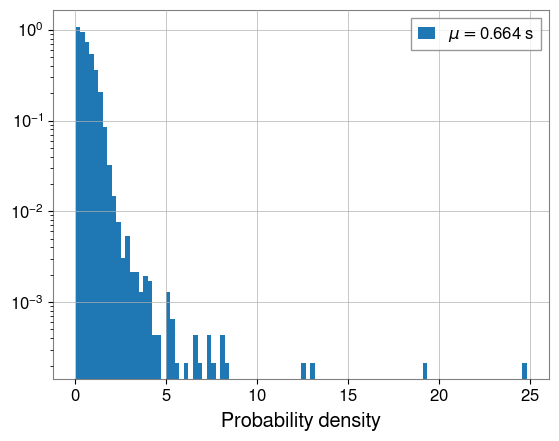

In [11]:
plt.hist(selected['duration'].values, bins=100, density=True,
         label=f'$\mu=$'+str(np.round(np.mean(selected['duration'].values), 3))+' s')
plt.yscale('log')
plt.xlabel('Duration (s)')
plt.xlabel('Probability density')
plt.legend()

On average they are 0.664 s long, so we can visualize then in 2s. Let's pick a random example and visualize it.

The `statistical_testing` module contains a function `fetch_glitch_data()` that fetches info from the LIGO OSC for L1 at a given gps time for 3 seconds at a sample rate of 4096. This sample is then converted to the pycbc format and whitened.

```python
noise = TimeSeries.fetch_open_data(ifo, g_star - tw ,  g_star + tw, sample_rate=srate)
```

In [13]:
data_df_tomte = statistical_testing.fetch_glitch_data_from_csv(selected, begin=0, n_samples=250)

OK, now we can check its Gaussianity with Saphiro test. We test that the input time series (y) is Gaussian, against the alternative hypothesis that it is non-Gaussian. If the test yields a p-value below $\alpha=0.05$ it means that the input data is non-Gaussian

Using the code above, we load up the dataset

Changing the sampling rate increases the amount of times we sample from the data per second. I want to know how the p-values would vary with this change. The gwpy [documentation](https://gwpy.github.io/docs/latest/api/gwpy.timeseries.TimeSeries/#gwpy.timeseries.TimeSeries.fetch_open_data) states that there can be event data with a 16384 Hz sampling rate which is what I will be using as a reference.

In [14]:
data_df_tomte.head()

,GPStime,snr,duration,confidence,ifo,label,unwhitened_y,whitened_y,t,q_scan,shapiro_statistic,shapiro_pvalue,shapiro_prediction,ks_statistic,ks_pvalue,ks_prediction,ad_statistic,ad_critical_values,ad_significance_level,ad_prediction,kurtosis,skew,glitch_present
0,1243679045.58200,35.21000,1.25000,1.00000,L1,Tomte,"[-1.0854155103346084e-19, -1.3654645578018337e...","[-0.5045093668242178, -0.20318748586240482, -0...","[1243679045.081787 s, 1243679045.0820312 s, 12...",[[FrequencySeries(0.91975904\n ...,0.99225,0.00000,1,0.01514,0.73609,0,1.46877,"[0.575, 0.655, 0.786, 0.917, 1.091]","[15.0, 10.0, 5.0, 2.5, 1.0]",1,4.10159,-0.20611,1
1,1250540898.89500,32.25600,1.50000,1.00000,L1,Tomte,"[1.7812745717014414e-19, 1.7493877360218948e-1...","[-2.8458679774897386, -2.9946451612694007, -2....","[1250540898.3947754 s, 1250540898.3950195 s, 1...",[[FrequencySeries(1.206756\n un...,0.99188,0.00000,1,0.01636,0.64366,0,1.71066,"[0.575, 0.655, 0.786, 0.917, 1.091]","[15.0, 10.0, 5.0, 2.5, 1.0]",1,4.11195,-0.19083,1
2,1249463266.05900,32.08200,1.50000,1.00000,L1,Tomte,"[3.910350888002077e-21, 1.8948101948847326e-21...","[-0.5472336580529558, -0.6615061672557502, -2....","[1249463265.558838 s, 1249463265.559082 s, 124...",[[FrequencySeries(1.237935\n un...,0.99155,0.00000,1,0.01562,0.69944,0,2.38057,"[0.575, 0.655, 0.786, 0.917, 1.091]","[15.0, 10.0, 5.0, 2.5, 1.0]",1,4.15024,-0.23770,1
3,1243933155.99600,29.36500,1.16000,1.00000,L1,Tomte,"[6.128452972915836e-19, 6.161272497036812e-19,...","[-0.16309805454198123, 0.2132511271668123, 0.4...","[1243933155.4958496 s, 1243933155.4960938 s, 1...",[[FrequencySeries(0.19453783\n ...,0.99095,0.00000,1,0.01514,0.73609,0,2.12240,"[0.575, 0.655, 0.786, 0.917, 1.091]","[15.0, 10.0, 5.0, 2.5, 1.0]",1,4.06771,-0.31484,1
4,1246398633.91000,28.77600,0.87500,1.00000,L1,Tomte,"[5.663362620411331e-20, 5.866555943670273e-20,...","[-4.407991446615926, -0.04219777770013926, -3....","[1246398633.409912 s, 1246398633.4101562 s, 12...",[[FrequencySeries(0.5195293\n u...,0.99275,0.00000,1,0.01538,0.71785,0,1.29654,"[0.575, 0.655, 0.786, 0.917, 1.091]","[15.0, 10.0, 5.0, 2.5, 1.0]",1,3.99457,-0.22619,1


In [15]:
# def p_values_with_sample_rate(begin=0,end=100):
#     data_df_4096 = get_noise_data(selected, tw=3, begin=begin, end=end)
#     data_df_16384 = get_noise_data(selected, tw=3, begin=begin, end=end)

#     data_df_4096['shapiro_pvalue'] = data_df_4096['y'].apply(lambda y: stats.shapiro(y).pvalue)
#     data_df_16384['shapiro_pvalue'] = data_df_16384['y'].apply(lambda y: stats.shapiro(y).pvalue)
    
#     display_shapiro_stats(data_df_4096, 3)
#     display_shapiro_stats(data_df_16384, 3)

#     return data_df_4096, data_df_16384


# data_df_4096, data_df_16384 = p_values_with_sample_rate()



We also check the equality of the numpy arrays to 100% confirm that the distributions are the same. Here we see that the p-values differ by a small margin (in the scale of $10^{-15}$) at to points. At first I thought this was particular to certain values, but on further experimentation, this could most probably be chalked up to floating point precision errors.

In [16]:
# plt.plot(difference)
# plt.xlabel("Index")
# plt.ylabel("Difference in p-values")
# plt.title("Difference in Shapiro p-values (4096 Hz vs. 16384 Hz)")
# plt.show()

Next would be checking the timeframe over which we conduct the test. This is more likely to change the shapiro values as we are increasing the number of points over which we are doing these calculations.

In [17]:
# def p_values_with_time_width():
#     data_df_3 = get_noise_data(selected, tw=3, begin=100, end=150)
#     data_df_4 = get_noise_data(selected, tw=4, begin=100, end=150)
#     data_df_5 = get_noise_data(selected, tw=5, begin=100, end=150)

#     data_df_3['shapiro_pvalue'] = data_df_3['y'].apply(lambda y: stats.shapiro(y).pvalue)
#     data_df_4['shapiro_pvalue'] = data_df_4['y'].apply(lambda y: stats.shapiro(y).pvalue)
#     data_df_5['shapiro_pvalue'] = data_df_5['y'].apply(lambda y: stats.shapiro(y).pvalue)
    
#     display_shapiro_stats(data_df_3, 3)
#     display_shapiro_stats(data_df_4, 4)
#     display_shapiro_stats(data_df_5, 5)

#     return data_df_3, data_df_4, data_df_5


# data_df_3, data_df_4, data_df_5 = p_values_with_time_width()

My hunch was right. The p-values have changed. This could probably be because we are considering more data points as we increase the time window.

Ignoring The outlier, we now focus on values below 0.05

In [18]:
# def view_filtered_histograms_tw(threshold = 0.065):
#     filtered_3 = data_df_3[data_df_3['shapiro_pvalue'] <= 0.06]
#     filtered_4 = data_df_4[data_df_4['shapiro_pvalue'] <= 0.06]
#     filtered_5 = data_df_5[data_df_5['shapiro_pvalue'] <= 0.06]

#     fig, ax = plt.subplots(1, 3, figsize=(21, 6))

#     ax[0].hist(filtered_3['shapiro_pvalue'])
#     ax[0].set_xlabel("Shapiro p-value")
#     ax[0].set_ylabel("Frequency")
#     ax[0].set_title("Shapiro p-values ≤ 0.01 (Time Window = 3s)")


#     ax[1].hist(filtered_4['shapiro_pvalue'])
#     ax[1].set_xlabel("Shapiro p-value")
#     ax[1].set_ylabel("Frequency")
#     ax[1].set_title("Shapiro p-values ≤ 0.01 (Time Window = 4s)")

#     ax[2].hist(filtered_5['shapiro_pvalue'])
#     ax[2].set_xlabel("Shapiro p-value")
#     ax[2].set_ylabel("Frequency")
#     ax[2].set_title("Shapiro p-values ≤ 0.01 (Time Window = 5s)")
#     plt.show()

# view_filtered_histograms_tw()

In [19]:
# fig = plt.figure(figsize=(10, 6))
# fig = plt.figure(dpi=200)

# plt.plot(data_df_3['shapiro_pvalue'], color='blue', alpha=0.3)
# plt.plot(data_df_4['shapiro_pvalue'], color='orange', alpha=0.3)
# plt.plot(data_df_5['shapiro_pvalue'], color='green', alpha=0.3)

# plt.xlabel('Glitch Instance')
# plt.ylabel('p-value')
# plt.title('Comparison of Shapiro p-values with differing time windows')
# plt.legend(['filtered_3', 'filtered_4', 'filtered_5'])
# plt.show()

What I find interesting in these graphs is that the p-values for a time window of 3s fluctuate between 0 to 0.04, for 4s, it fluctuates from 0 to 0.005, and for 5s it is between 0 to 0.05



I now want to investigate the glitch that was classified but was failing this test. I'll use `data_df_tomte` for this

In [20]:
data_df_tomte['ewm_y'] = data_df_tomte['whitened_y'].apply(lambda row: pd.Series(row).ewm(0.9).mean().tolist())
# data_df_tomte['ewm_q_transform'] = data_df_tomte['ewm_y'].apply(lambda row: TimeSeries(row, sample_rate=4096).q_transform(qrange=[4,64], frange=[10, 2048], tres=0.002, fres=0.5, whiten=False))
data_df_tomte['ewm_q_transform'] = data_df_tomte['ewm_y'].apply(lambda row: TimeSeries(row, sample_rate=4096).q_transform(qrange=[4,64], frange=[10, 2048], tres=0.002, fres=0.5, whiten=False))

In [21]:
data_df_tomte.iloc[0]

GPStime                                                   1243679045.58200
snr                                                               35.21000
duration                                                           1.25000
confidence                                                         1.00000
ifo                                                                     L1
label                                                                Tomte
unwhitened_y             [-1.0854155103346084e-19, -1.3654645578018337e...
whitened_y               [-0.5045093668242178, -0.20318748586240482, -0...
t                        [1243679045.081787 s, 1243679045.0820312 s, 12...
q_scan                   [[FrequencySeries(0.91975904\n                ...
shapiro_statistic                                                  0.99225
shapiro_pvalue                                                     0.00000
shapiro_prediction                                                       1
ks_statistic             

In [22]:
suspicious_glitch = data_df_tomte[data_df_tomte['shapiro_pvalue'] >= 0.05]
suspicious_glitch.shape

(2, 25)

In [23]:
suspicious_glitch = data_df_tomte[data_df_tomte['ks_pvalue'] >= 0.05]
suspicious_glitch.shape

(250, 25)

In [24]:
# fig, ax = plt.subplots(1,2, figsize=(12, 6))
# ax[0].plot(suspicious_glitch['t'].iloc[0], suspicious_glitch['y'].iloc[0], label='Suspicious Glitch')
# ax[0].set_xlabel("Time (s)")
# ax[0].set_ylabel("Amplitude")
# ax[0].legend()

# ax[1].imshow(suspicious_glitch['q_transform'].iloc[0])
# ax[1].set_yscale('log', base=2)
# ax[1].set_xscale('linear')
# ax[1].set_ylabel('Frequency (Hz)')
# ax[1].set_xlabel('Time (s)')
# ax[1].images[0].set_clim(0, 25.5)

# fig.colorbar(ax[1].images[0], ax=ax[1], label='Normalized energy', orientation='vertical', fraction=0.046, pad=0.04)

# plt.show()

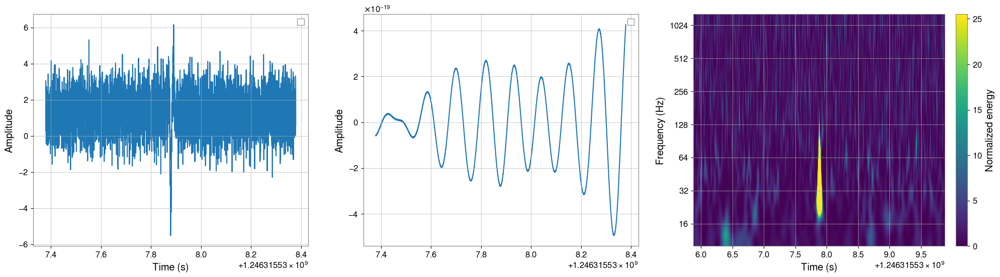

In [25]:
glitch_idx = 9

statistical_testing.display_sample_plots(data_df_tomte.iloc[glitch_idx])

The glitch with a p-value above 0.05 does look gaussian in the time-amplitude domain, but its q-transform makes it look similar to the other glitches.

Now, I want to compare this glitch to the other ones to see if its distribution is similar to theirs and by how much. The Kolmogorov-Smirnov test is suitable for this as it provides a statistic and p-value to work with.

In [26]:
# sus_y_values = suspicious_glitch.iloc[0]['y']

# ks_stats = list(data_df_tomte['y'].apply(lambda row: tuple(stats.ks_2samp(row,sus_y_values))))

In [27]:
# ks_stats = pd.DataFrame(ks_stats, columns=['suspicious_KS_statistic', 'suspicious_KS_p_value'])
# data_df_tomte = data_df_tomte.join(ks_stats[['suspicious_KS_statistic', 'suspicious_KS_p_value']])

Now that I have the KS statistic and p-values, I can now see how the suspicious glitch here fares with the others

In [28]:
# fig, ax = plt.subplots(1,2, figsize=(12, 6))

# # plt.title("Kolmogorov Smirnov Statistic and P-values of data compared to outlier glitch")
# ax[0].plot(data_df_tomte['suspicious_KS_statistic'])
# ax[0].set_ylabel("KS statistic")
# ax[0].set_xlabel("Glitch Instance")

# ax[1].plot(data_df_tomte['suspicious_KS_p_value'])
# ax[1].set_ylabel('KS p-value')
# ax[1].set_xlabel('Glitch Instance')

# plt.show()

Due to how much this statistic varies with each of the glitches in our sample set, it will probably not be of much use to us in determining whether the glitch that we are studying is similar to the other ones are not. Additionally the KS test doesn't take into consideration the temporal nature of our data, which is problematic.

An idea I wanted to try for this was [Dynamic Time Warping](https://en.wikipedia.org/wiki/Dynamic_time_warping). This algorithm can compare the simlarities between two temporal sequences, taking into account their speed (warping). However this assumes there to be a phase shift between the timeseries and does not account for changes in amplitudes. 

In our case, we would go for something akin to lock-step distance. The main issue however is the whitening that has been done to our signal.

Since our signal is being introduced to white noise, it is effectively a vaguely glitch-like white noise signal that we are dealing with. I could try applying a weighted average that would help capture the general trend of the glitch as it moves along, along with either one of the two methods.

We first do the lock-step calculations with the glitches directly

In [29]:
# def lock_step(sus, row):
#     return np.sqrt(((sus-row)**2).sum())

# data_df_tomte['lock_step_distance'] = data_df_tomte['y'].apply(lambda row: lock_step(np.array(row) , np.array(sus_y_values)))

In [30]:
# fig = plt.figure(dpi=100)
# plt.plot(data_df_tomte['lock_step_distance'])

# plt.xlabel('Glitch Instance')
# plt.ylabel('Lock-step distance')
# plt.title('Lock-step distances of whitened glitches compared to the suspicious glitch')
# plt.show()

We notice that a lot of the lock-step distance values hover around the 5500 t0 6100 range. However there are some points where the variation is extremely high. I want to compare this with th KS statistic to see the parallels.

In [31]:
# fig, ax = plt.subplots(1,2, figsize=(12, 6))

# ax[0].plot(data_df_tomte['suspicious_KS_statistic'])
# ax[0].set_ylabel("KS statistic")
# ax[0].set_xlabel("Glitch Instance")

# ax[1].plot(data_df_tomte['lock_step_distance'])
# ax[1].set_ylabel('Lock-step distance')
# ax[1].set_xlabel('Glitch Instance')

# plt.show()

We notice that both these plots have spikes at similar points, having a zero value at point 28 (the suspicious glitch).

I'll now take the weighted average and do the same. First i want to see what our suspicious glitch looks when taken as a weighted average.

In [32]:
# fig, ax = plt.subplots(2,2, figsize=(13, 12))
# ax[0][0].plot(suspicious_glitch['t'].iloc[0], suspicious_glitch['y'].iloc[0], label='Suspicious Glitch')
# ax[0][0].set_xlabel("Time (s)")
# ax[0][0].set_ylabel("Amplitude")
# ax[0][0].legend()

# ax[0][1].plot(suspicious_glitch['t'].iloc[0], suspicious_glitch['ewm_y'].iloc[0], label='Suspicious Glitch (EWM)')
# ax[0][1].set_xlabel("Time (s)")
# ax[0][1].set_ylabel("Amplitude")
# ax[0][1].legend()
# # ax[1].images[0].set_clim(0, 25.5)

# ax[1][0].imshow(suspicious_glitch['q_transform'].iloc[0])
# ax[1][0].set_yscale('log', base=2)
# ax[1][0].set_xscale('linear')
# ax[1][0].set_ylabel('Frequency (Hz)')
# ax[1][0].set_xlabel('Time (s)')
# ax[1][0].images[0].set_clim(0, 25.5)
# fig.colorbar(ax[1][0].images[0], ax=ax[1][0], label='Normalized energy', orientation='vertical', fraction=0.046, pad=0.04)

# ax[1][1].imshow(suspicious_glitch['ewm_q_transform'].iloc[0])
# ax[1][1].set_yscale('log', base=2)
# ax[1][1].set_xscale('linear')
# ax[1][1].set_ylabel('Frequency (Hz)')
# ax[1][1].set_xlabel('Time (s)')
# ax[1][1].images[0].set_clim(0, 25.5 )

# plt.subplots_adjust(wspace=0.4, hspace=0.4)

# fig.colorbar(ax[1][1].images[0], ax=ax[1][1], label='Normalized energy', orientation='vertical', fraction=0.046, pad=0.04)

# plt.show()

# Testing EWA on white noise

0.803221258730529


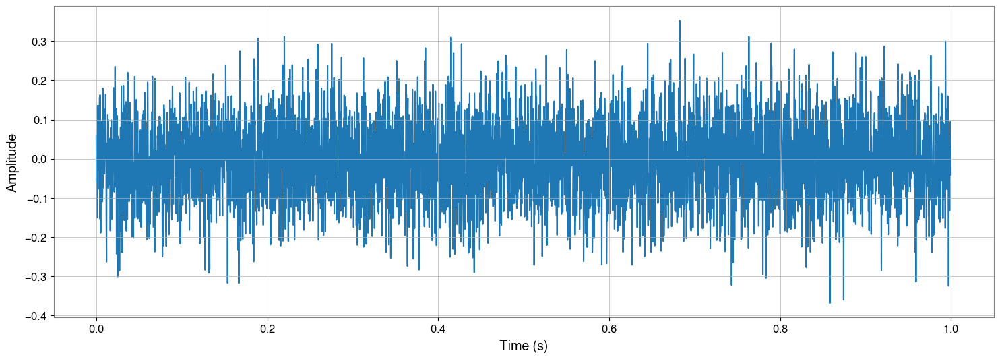

In [33]:
# creating noise
example_noise = TimeSeries(np.random.normal(scale=.1, size=4096), sample_rate=4096)
print(stats.shapiro(example_noise.value).pvalue)
fig = plt.figure(figsize=(18,6))
plt.plot(example_noise)
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.show()

In [34]:
ewm_example_1 = pd.Series(example_noise.value).ewm(0).mean()
ewm_example_2 = pd.Series(example_noise.value).ewm(0.5).mean()
ewm_example_3 = pd.Series(example_noise.value).ewm(0.8).mean()
ewm_example_4 = pd.Series(example_noise.value).ewm(0.9).mean()
ewm_example_5 = pd.Series(example_noise.value).ewm(0.98).mean()
ewm_example_6 = pd.Series(example_noise.value).ewm(0.9999).mean()

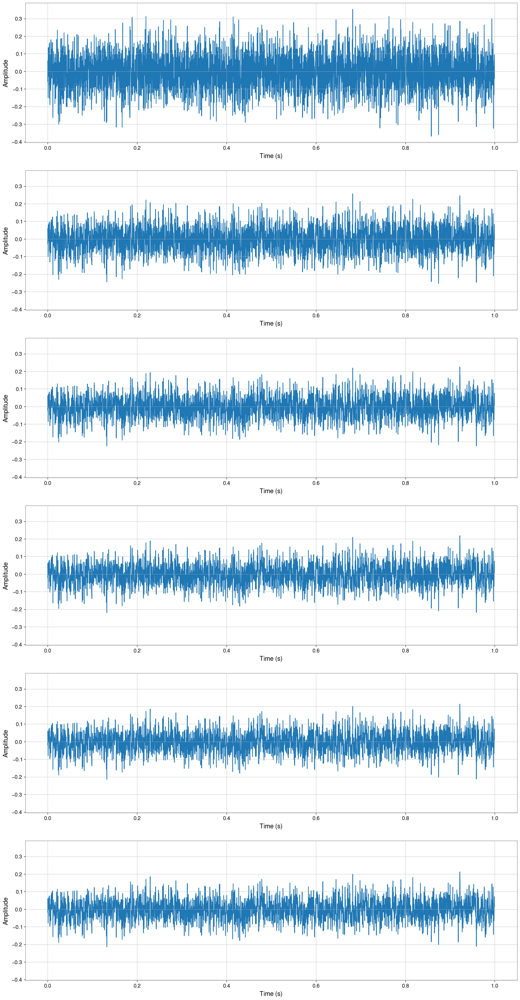

In [35]:
fig, ax = plt.subplots(6, 1, figsize=(20,40), sharey=True, dpi=100)

ax[0].plot(example_noise.times, ewm_example_1)
ax[0].set_xlabel("Time (s)")
ax[0].set_ylabel("Amplitude")

ax[1].plot(example_noise.times, ewm_example_2)
ax[1].set_xlabel("Time (s)")
ax[1].set_ylabel("Amplitude")

ax[2].plot(example_noise.times, ewm_example_3)
ax[2].set_xlabel("Time (s)")
ax[2].set_ylabel("Amplitude")

ax[3].plot(example_noise.times, ewm_example_4)
ax[3].set_xlabel("Time (s)")
ax[3].set_ylabel("Amplitude")

ax[4].plot(example_noise.times, ewm_example_5)
ax[4].set_xlabel("Time (s)")
ax[4].set_ylabel("Amplitude")

ax[5].plot(example_noise.times, ewm_example_6)
ax[5].set_xlabel("Time (s)")
ax[5].set_ylabel("Amplitude")

plt.show()

What's happening here is that the effective values following the first sample are dampened with the following formula

$$\text{ewm}_{t} = \alpha \text{ val}_{t} + (1 - \alpha) \text{ewm}_{t-1}$$

where $\text{ewm}_{t}$ is the exponentially weighted mean at $t$, and $\alpha$ is a user defined value between $(0,1)$

So at every point, we take into account previous points in our timeseries. Hence, the white noise is not necessarily going to remain as white noise.

Also, from a visual standpoint, the glitch seems to be converging to the mean, which in this case is zero since the white noise here is zero centered.

# Using the Shapiro Wilks test on smaller parts of a glitch

We now take our suspicious glitch and perform the Shapiro-Wilks test on sections of it.

Shapiro Statistics
0.5427232164930027
0.8046026697753509
0.9296481605650483
0.09723666104102488
0.4435848773816628
0.6085584668204402
0.10338484124725561
7.050755591661417e-10
0.6749031751207566
0.509605946641807
0.7282364438563537
0.8325674756864933
0.5289255115030413
0.2997005642418751
0.41090158435997026
0.3378644866544225


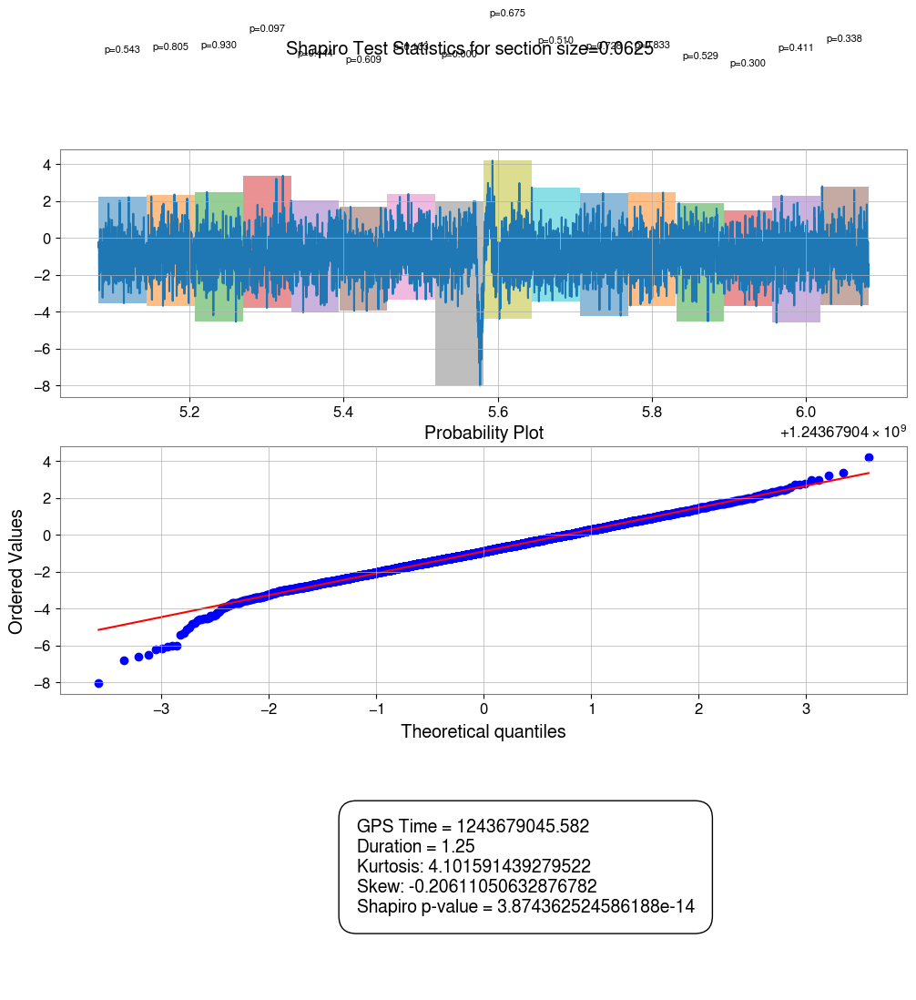

In [36]:
# statistical_testing.display_section_statistics(suspicious_glitch.iloc[0],stat_test="Shapiro", sections=16) # 256
statistical_testing.display_section_statistics(suspicious_glitch.iloc[0],stat_test="Shapiro", section_size_seconds=0.0625) # 256 (16)


Shapiro Statistics
0.1294058787365096
3.979949477316353e-16
0.08074533704831623
0.911053922739044


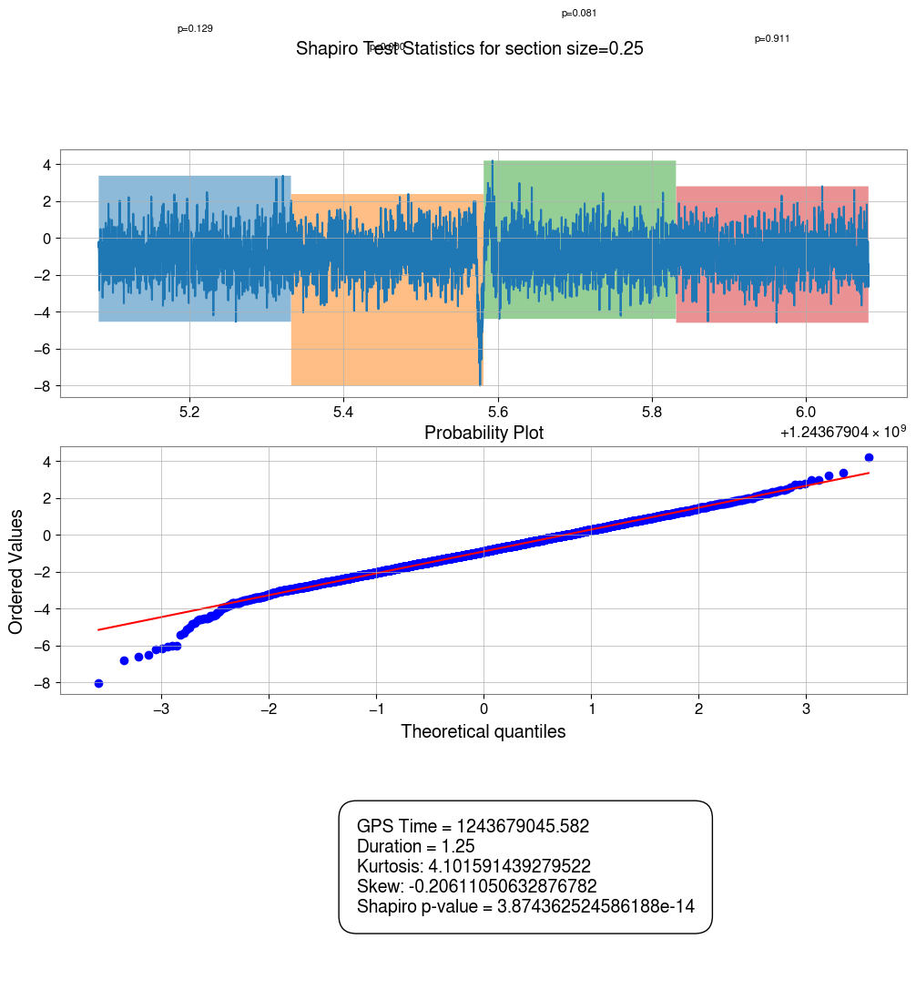

In [37]:
# statistical_testing.display_section_statistics(suspicious_glitch.iloc[0],stat_test="Shapiro", sections=4)
statistical_testing.display_section_statistics(suspicious_glitch.iloc[0],stat_test="Shapiro", section_size_seconds=0.25) # 1024 (4)

Shapiro Statistics
0.6619620141367593
1.151038109787808e-13
0.8232314280172406


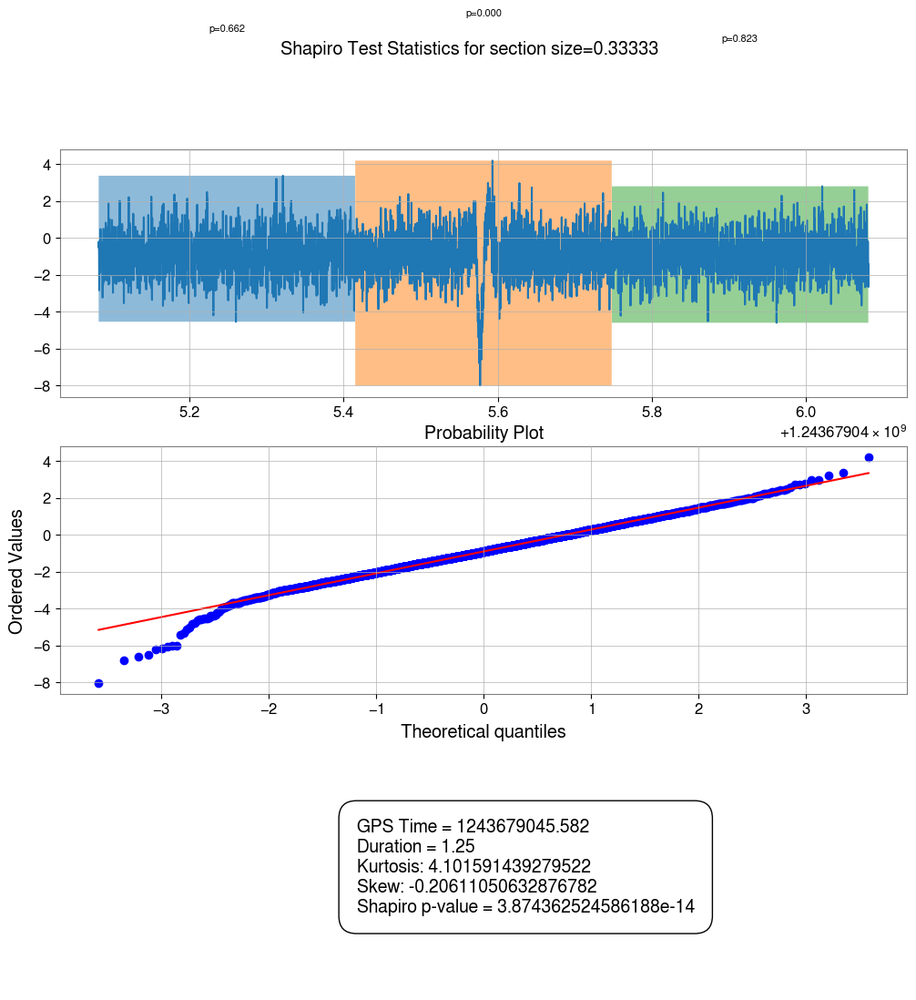

In [38]:
# statistical_testing.display_section_statistics(suspicious_glitch.iloc[0],stat_test="Shapiro", sections=3)
statistical_testing.display_section_statistics(suspicious_glitch.iloc[0],stat_test="Shapiro", section_size_seconds=0.33333) #1365 (3)

Shapiro Statistics
0.2842926802382705
0.9343946940025813
0.6756137247229173
0.5645183087762569
1.0718090265288733e-09
0.8244141660822117
0.9622039324165038
0.7362761225105261
0.3251617246632179


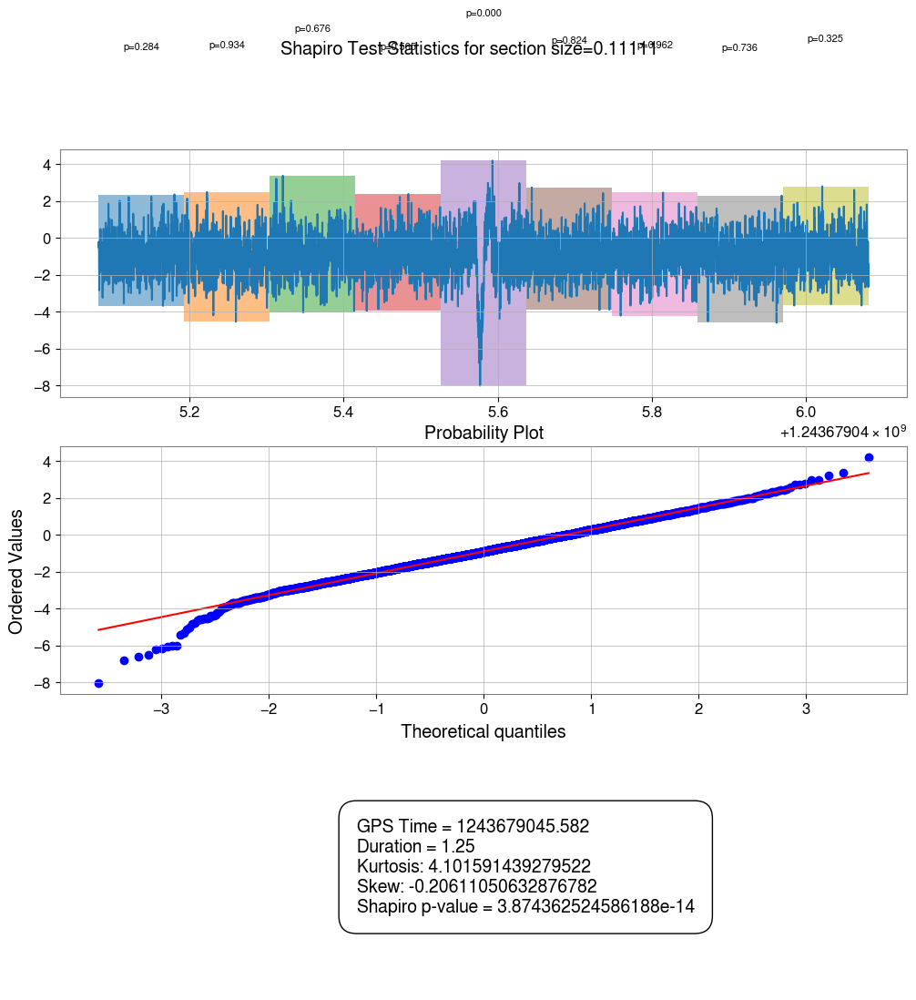

In [39]:
# statistical_testing.display_section_statistics(suspicious_glitch.iloc[0],stat_test="Shapiro", sections=9)
statistical_testing.display_section_statistics(suspicious_glitch.iloc[0],stat_test="Shapiro", section_size_seconds=0.11111) #455 (9)

From the above plots, we see that the Shapiro-Wilk test works well for sections of the glitch samples where it consistently identifies domains not containing the glitch as a 

# Understanding what the Shapiro-Wilk test tries to do

The null hypothesis of this test is that our data comes from a normal distribution. This test only works for univariate, continuous data.

Given a sample $x_{1} \dots x_{n}$, with $n$ as the number of data points the Shapiro-Wilks test statistic is given by $W$ as follows

$$
W = \frac{(\sum_{i=1}^{n}a_{i}x_{(i)})^2}{\sum_{i=1}^{n}(x_i - \bar{x})^2}
$$

If a distribution is normal then, $(\sum_{i=1}^{n}a_{i}x_{(i)})^2$ should be an estimate of the population's variance $\sigma^2$

The denominator here is also an estimation of population variance $\sigma^2$

So, for our null hypothesis to hold true, $W=1$, since the numerator and denominator are both estimating the variance.

For values less than one, it indicates a non-normal distribution

### Issues with this test

- It won't work well if our data has too many equal values
- For a small dataset, our null hypothesis will rarely get rejected
- For a large dataset, our null hypothesis will be rejected for tiny differences from normality

A large p value doesn't prove that a distribution is normal, but that it is not significantly difference from a normal distribution.

### Note

Shapiro Wilks test is too sensitive - a histogram/Q-Q plot should be used when assessing t-test/ANOVA assumptions

### About "a"

Taking the numerator

$$(\sum_{i=1}^{n}a_{i}x_{(i)})^2$$

Here, $x_{(i)}$ are the ["order statistics"](https://youtu.be/gDtkGqLD1R0), that is, the values obtained from the sample when sorted in ascending order.

$a_i$ are constants given by

$$
\frac{m^TV^{-1}}{||V^{-1}m||}
$$

Here, $m$ represents a vector of order statistics we would expect from a standard normal distribution.

$V$ is the covariance matrix given by

$$
V = \mu[X_i - \mu X_i][X_j - \mu X_j]
$$

where $\mu$ is the expected mean of the distribution.

So, for example, if we had two points, $a$ would be $[0.5]$, for 3 points, $[0.375, 0.625]$, for 4 points, $[0.2857, 0.5, 0.7143]$,  and so on.

### Q-Q plots

These plot quantiles of our data vs expected quantiles of a normal distribution.

(Quantile = fraction of points below a given value)
![q-q plot](ad_4nxcrzsncc66mesuuafrmu-n91-w2j72w29cr-sb_o5_9y4k4errnbl3ei0req8twyso1snfa3haoctju5kfnadqygfo0micewassf3ljzvx1thwjgoytvchzbxyqmqdsemaovm7beg.avif)

# More experimentation with the Exponentially weighted averages

A concern I have with exponentially weighted averages is the fact that each of the calculated values depend on a window of values before the current timepoint, hence adding bias to the variance and distribution of every point in the whitened signal. This could lead to a level of non-gaussianity when trying to test our data with the Shapiro-Wilks test. I would like to test this out.

Consider the `example_noise` example from before. Here is what it looks like.

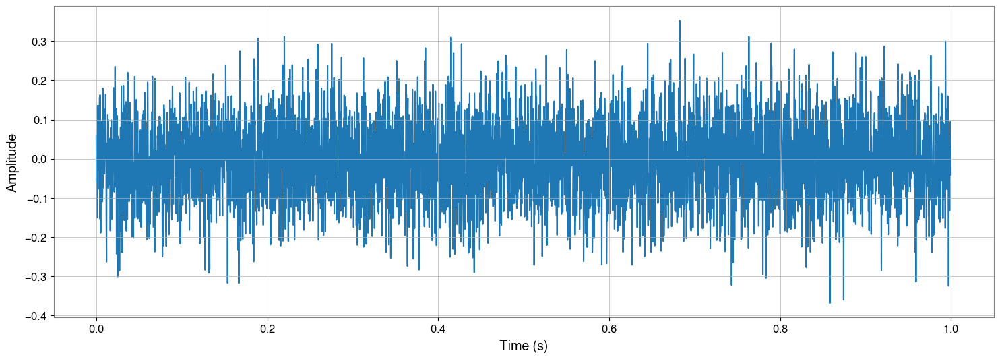

0.803221258730529


In [40]:
fig = plt.figure(figsize=(18,6))
plt.plot(example_noise)
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.show()

print(stats.shapiro(example_noise.value).pvalue)
# warnings.filterwarnings(action='once')

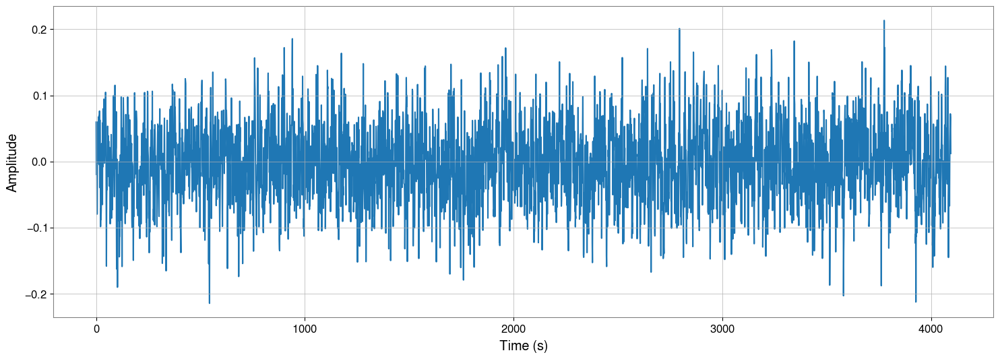

0.9096959368956521


In [41]:
fig = plt.figure(figsize=(18,6))
plt.plot(ewm_example_5)
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.show()

print(stats.shapiro(ewm_example_5).pvalue)
# warnings.filterwarnings(action='once')


Applying an exponentially weighted average to our data increased the Shapiro test p-value, hence confirming my suspicion. Since exponentially weighted averages supress sudden changes in values, it makes the points seem more uniform than they probably are in reality, hence making this approach unacceptable.

However, I do want to see if this could help a bit when there is a glitch in our data. Since the EWA acts as a low-pass filter of sorts, it can attenuate most high amplitudes, while also introducing a bias. In this case, if there exists a glitch, there is a chance that it could be affected by this, putting more of an emphasis on it (p-value <0.05). 

In [42]:
# fig = plt.figure(figsize=(18,6))
# plt.plot(suspicious_glitch['t'].iloc[0], suspicious_glitch['y'].iloc[0])
# plt.show()

# print(stats.shapiro(suspicious_glitch['y'].iloc[0]).pvalue)

In [43]:
# fig = plt.figure(figsize=(18,6))
# plt.plot(suspicious_glitch['t'].iloc[0],suspicious_glitch['ewm_y'].iloc[0])
# plt.show()

# print(stats.shapiro(suspicious_glitch['ewm_y'].iloc[0]).pvalue)

As expected, this leads to a huge change in the p-value. I want to study this a bit more in detail for all the 50 selected points. 

In [44]:
data_df_tomte['ewm_shapiro_pvalue'] = data_df_tomte['ewm_y'].apply(lambda y: stats.shapiro(y).pvalue)

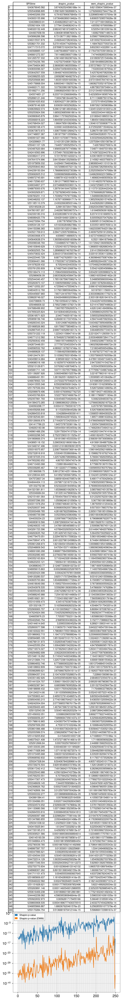

In [45]:
# fig,ax = plt.subplots(figsize=(6,10))
fig,ax = plt.subplots(dpi=100)
plt.plot(data_df_tomte['shapiro_pvalue'], label="Shapiro p-value")
plt.plot(data_df_tomte['ewm_shapiro_pvalue'], label="Shapiro p-value (EWM)")
ax.set_yscale('log')
for i in range(len(data_df_tomte)):
    plt.axvline(x=i, color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
ax.table(cellText=data_df_tomte[['GPStime','shapiro_pvalue','ewm_shapiro_pvalue']].values, colLabels=['GPStime','shapiro_pvalue','ewm_shapiro_pvalue'], rowLabels=data_df_tomte.index, loc='top')
# plt.subplots_adjust(left=0.2, top=0.8)
plt.legend(fontsize=8)
plt.show()

In the above case, we can see that save for a few points, the Shapiro p-values generally have a drastic decrease when the exponentially weighted average is applied to them. This is understandable since we are aware that these samples have a glitch in them.

Below, we perform the same test with a bunch of synthetically generated white noise samples to study whether it has the same effect. The null hyopthesis I have here is that since white noise has several frequencies bounded at the same level of frequencies, the p-value will increase, i.e. all the points in our dataset will be supressed.

In [46]:
def white_noise_shapiro_values(n=50):
    np.random.seed(42)
    noise_df = pd.DataFrame(columns=['TimeSeries', 'EWM TimeSeries', 'shapiro_pvalue', 'ewm_shapiro_pvalue'])
    for i in range(n):
        white_noise = TimeSeries(np.random.normal(scale=.1, size=4096), sample_rate=4096)
        white_noise_ewm = pd.Series(white_noise.value).ewm(0.98).mean()
        noise_df.loc[len(noise_df)] = [white_noise, white_noise_ewm, stats.shapiro(white_noise.value).pvalue, stats.shapiro(white_noise_ewm).pvalue]
    return noise_df


In [47]:
white_noise_examples = white_noise_shapiro_values()

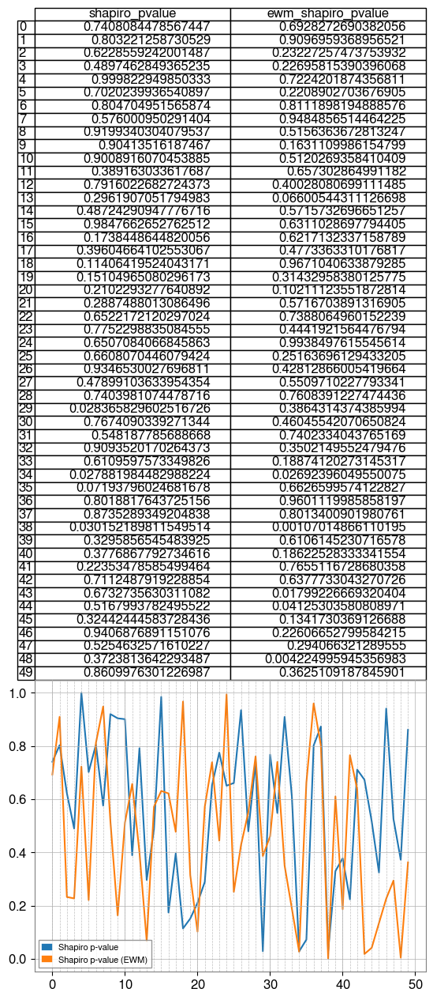

In [48]:
fig,ax = plt.subplots(dpi=100)
plt.plot(white_noise_examples['shapiro_pvalue'], label="Shapiro p-value")
plt.plot(white_noise_examples['ewm_shapiro_pvalue'], label="Shapiro p-value (EWM)")
# ax.set_yscale('log')
for i in range(len(white_noise_examples)):
    plt.axvline(x=i, color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
ax.table(cellText=white_noise_examples[['shapiro_pvalue','ewm_shapiro_pvalue']].values, colLabels=['shapiro_pvalue','ewm_shapiro_pvalue'], rowLabels=white_noise_examples.index, loc='top')
# plt.subplots_adjust(left=0.2, top=0.8)
plt.legend(fontsize=8)
plt.show()

Here we see that even for gaussian noise there can be variations in the Shapiro p-value both below and above the 0.05 threshold

What can be inferred from here is that the exponentially weighted might not be a good approach.

Now I want to shift focus back onto normality testing of our dataset. First I want to start plotting Q-Q plots of the data, starting with the suspicious glitch.

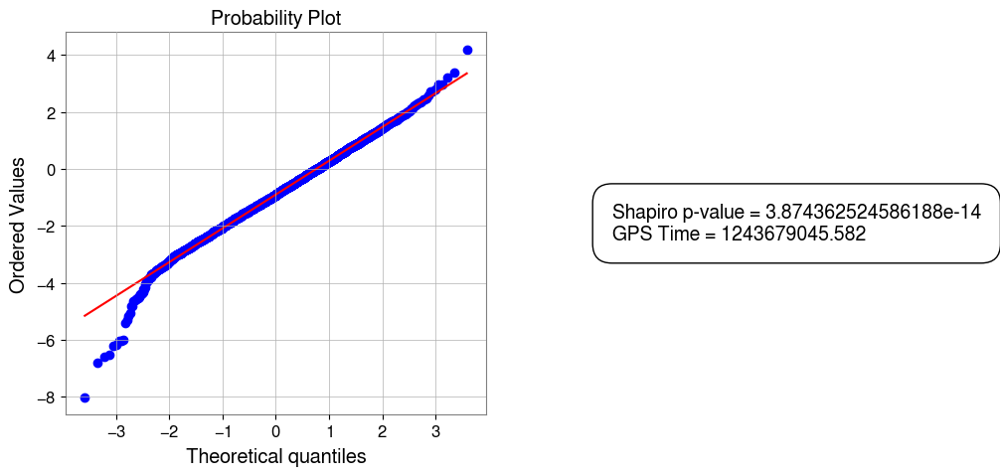

In [49]:
statistical_testing.display_probability_plot(suspicious_glitch.iloc[0])

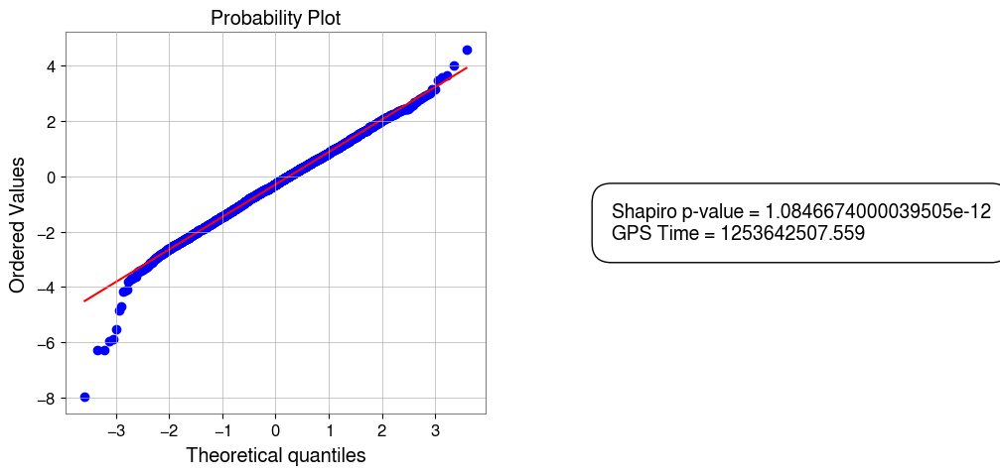

In [50]:
statistical_testing.display_probability_plot(data_df_tomte.iloc[18])

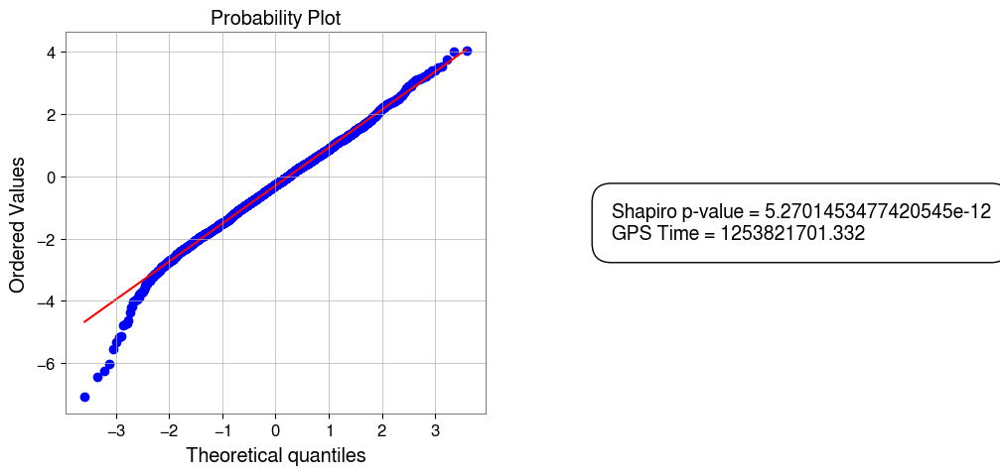

In [51]:
statistical_testing.display_probability_plot(data_df_tomte.iloc[10])

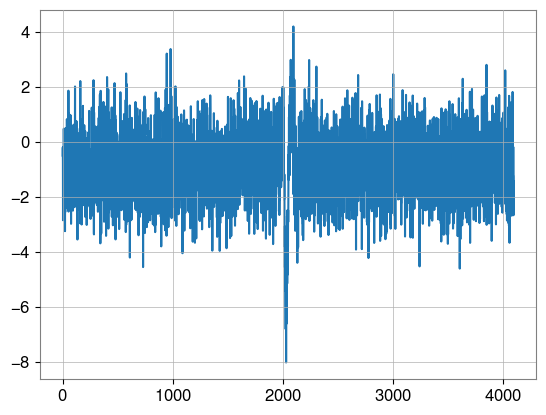

In [52]:
plt.plot(suspicious_glitch['whitened_y'].iloc[0])

Shapiro Statistics
0.44196203716523785
0.8267602437088559
0.5488660380394881
0.5609674121318241
0.6312302269893914
0.49265104926622344
0.2224319487419455
0.8095470635517656
0.195529193015283
0.5888044608161271
1.1770247920353127e-06
0.4009498189768106
0.1760059626544303
0.28941126842243725
0.9379069786915494
0.9250816584922763
0.37272669386056084
0.07464834418218735
0.8289115231453961
0.5410602856829964
0.17816795562795745


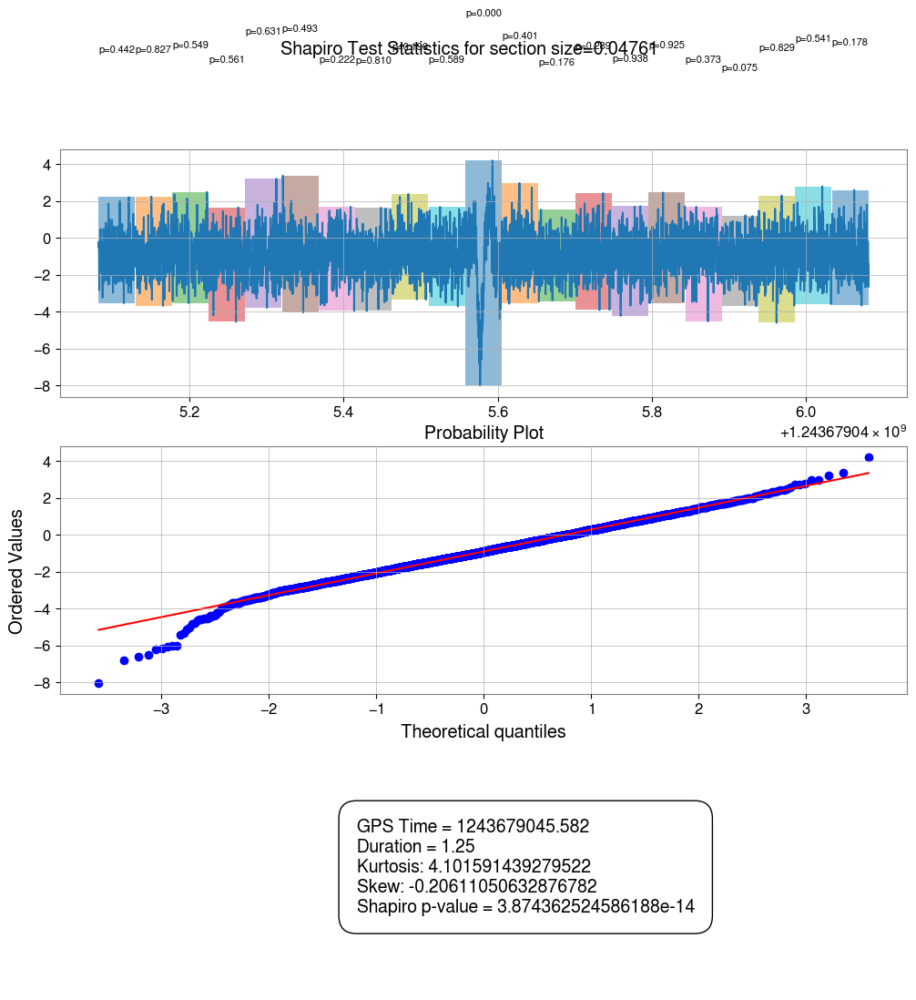

In [53]:
# section_list = statistical_testing.display_section_statistics(suspicious_glitch.iloc[0],stat_test="Shapiro", sections=21)
statistical_testing.display_section_statistics(suspicious_glitch.iloc[0],stat_test="Shapiro", section_size_seconds=0.04761) #195 (21)

In [2]:
from sklearn.preprocessing import MinMaxScaler

np.random.seed(42)

scaler = MinMaxScaler(feature_range=(-4,4))

plt.hist(list(scaler.fit_transform(suspicious_glitch.iloc[0]["whitened_y"].reshape(-1,1))[:,0]), label="sample glitch", histtype='step')
plt.hist(stats.norm.rvs(size=len(suspicious_glitch.iloc[0]["whitened_y"]), random_state=np.random.default_rng()), label="normal distribution", histtype='step')
plt.legend()
plt.show()

NameError: name 'suspicious_glitch' is not defined

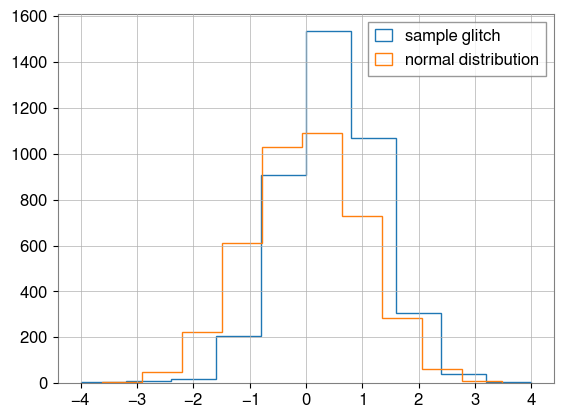

In [55]:
np.random.seed(42)

plt.hist(list(scaler.fit_transform(suspicious_glitch.iloc[1]["whitened_y"].reshape(-1,1))[:,0]), label="sample glitch", histtype='step')
plt.hist(stats.norm.rvs(size=len(suspicious_glitch.iloc[1]["whitened_y"]), random_state=np.random.default_rng()), label="normal distribution", histtype='step')
plt.legend()
plt.show()

In [56]:
stats.ks_2samp(suspicious_glitch.iloc[0]["whitened_y"], stats.norm.rvs(size=len(suspicious_glitch.iloc[0]["whitened_y"]), random_state=np.random.default_rng()))

KstestResult(statistic=np.float64(0.333251953125), pvalue=np.float64(8.73706179476639e-202), statistic_location=np.float64(-0.5384578825858949), statistic_sign=np.int8(1))

Anderson Statistics
Section 1: 
AD Statistic= 0.3126992414869676
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 2: 
AD Statistic= 0.22877313258786103
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 3: 
AD Statistic= 0.23487339534312923
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 4: 
AD Statistic= 0.30143077876039115
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 5: 
AD Statistic= 0.1999569223926585
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 6: 
AD Statistic= 0.3099226086973772
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 7: 
AD Statistic= 0.43787704787428083
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 8: 
AD Statistic= 0.22768108058008352
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 9: 
AD Statistic= 0.6453571436562129
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 10: 
AD Statistic= 0.2942386511659265
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 11: 
AD Statistic= 3.645487343907803

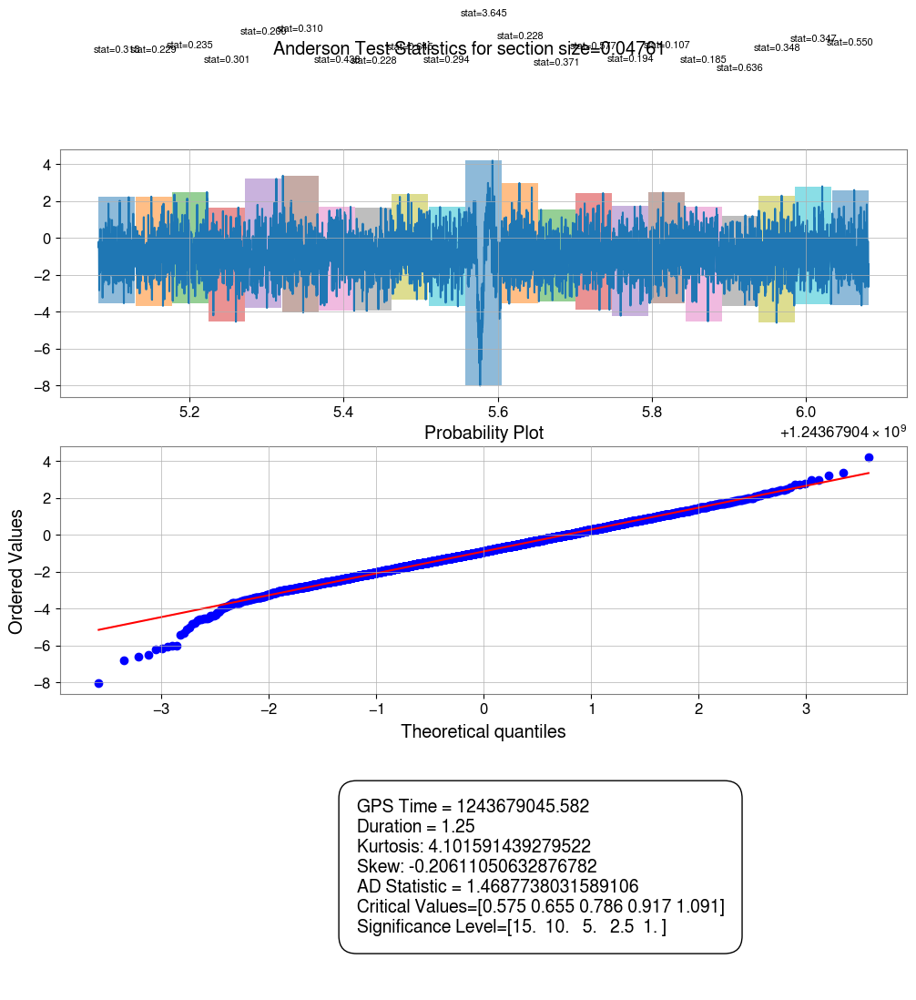

In [57]:
statistical_testing.display_section_statistics(suspicious_glitch.iloc[0],stat_test="Anderson", section_size_seconds=0.04761)

In [58]:
selected.loc[selected["GPStime"] == 1244889828.137]

,GPStime,snr,duration,confidence,ifo,label
1108,1244889828.13700,21.68400,0.75000,1.00000,L1,Tomte


Shapiro Statistics
0.030707806680213664
9.883809554517735e-12
0.8924527765311934


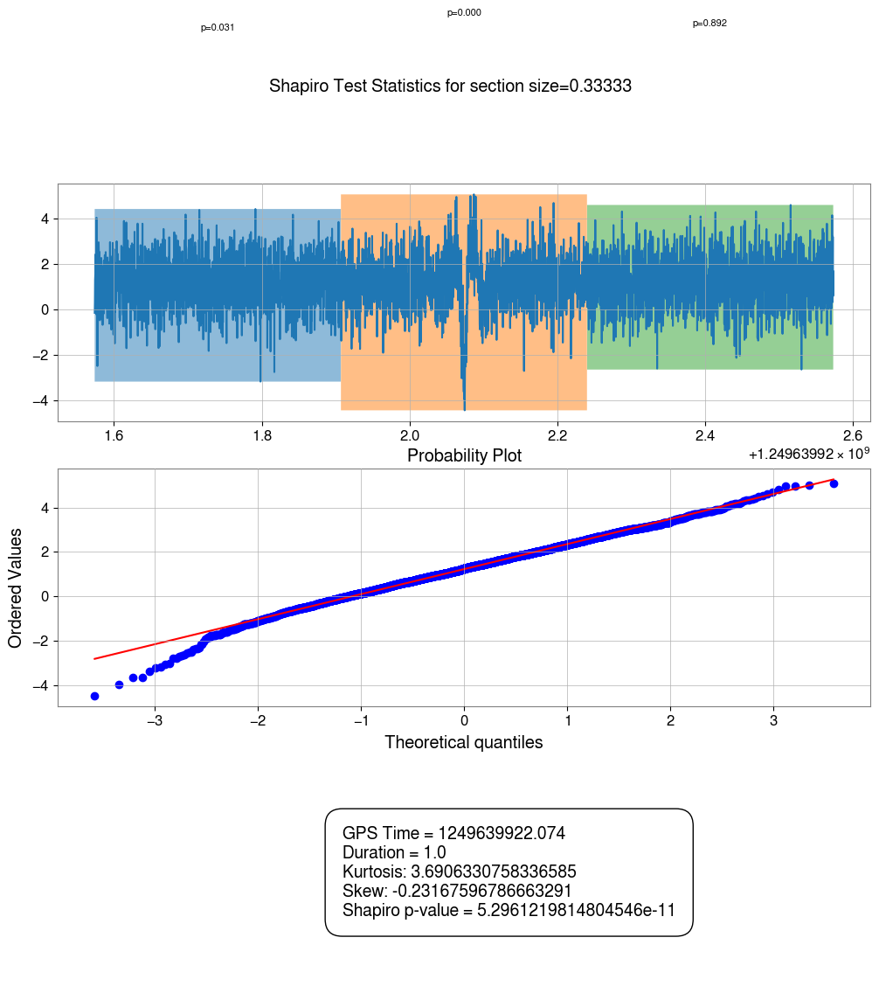

In [59]:
# statistical_testing.display_section_statistics(data_df_tomte.iloc[28],stat_test="Shapiro", sections=3)
statistical_testing.display_section_statistics(data_df_tomte.iloc[28],stat_test="Shapiro", section_size_seconds=0.33333) # (3)

Shapiro Statistics
0.5959839398641413
0.5490605256503744
0.008388725768422863
0.42827567126546917
4.69074492411426e-08
0.08726761897197972
0.834088310644804
0.9133171547547507
0.7346906319655351


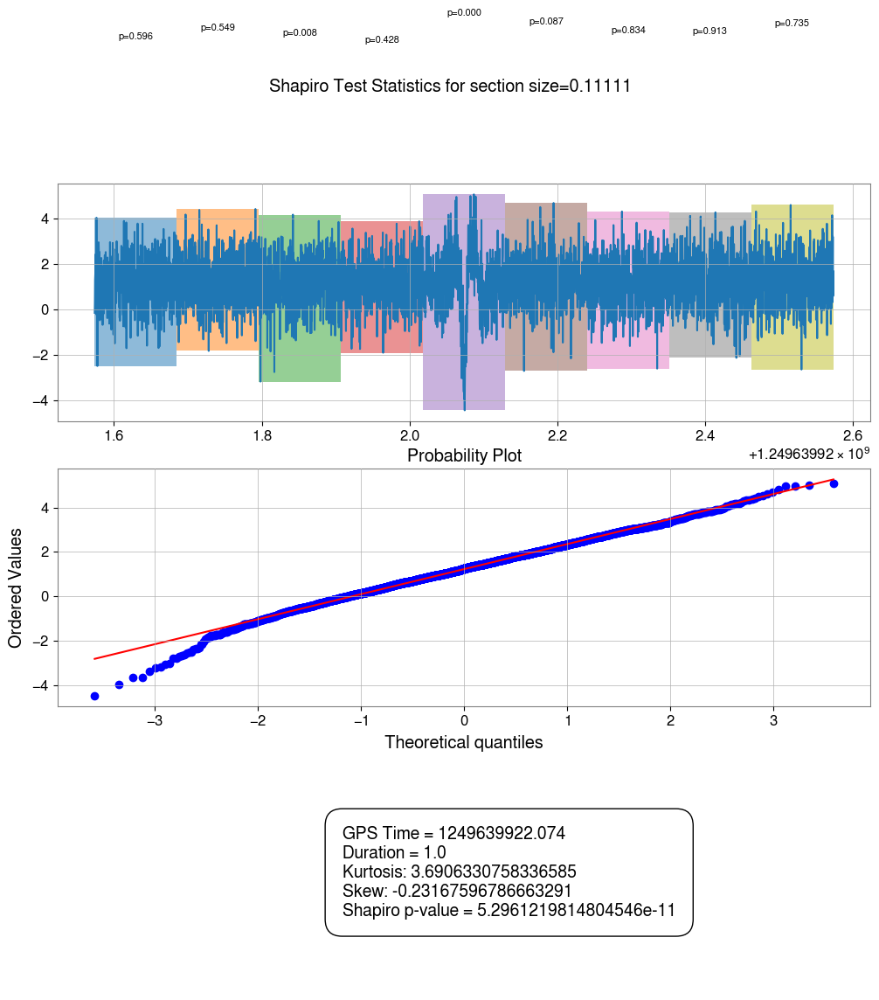

In [60]:
# statistical_testing.display_section_statistics(data_df_tomte.iloc[28],stat_test="Shapiro", sections=9)
statistical_testing.display_section_statistics(data_df_tomte.iloc[28],stat_test="Shapiro", section_size_seconds=0.11111) # (9)

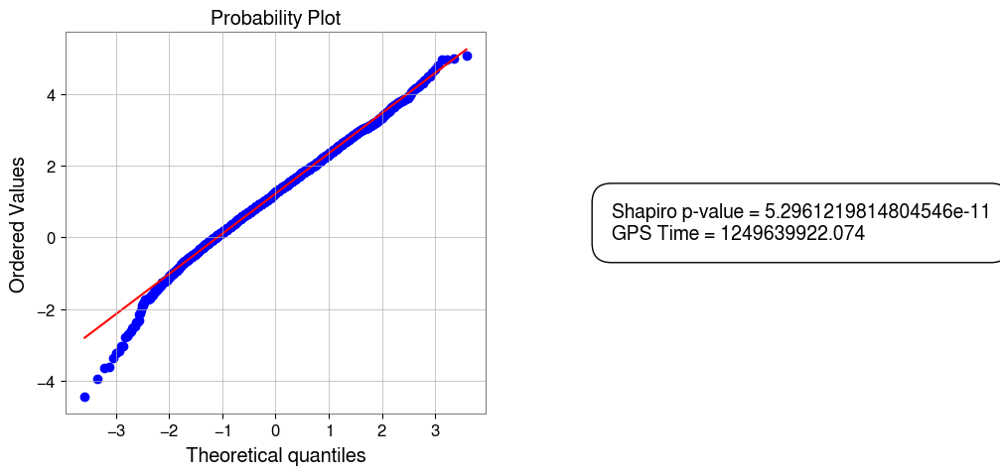

In [61]:
statistical_testing.display_probability_plot(data_df_tomte.iloc[28])

Shapiro Statistics
0.17547335314441154
0.1419129999547284
0.880043653149523
0.8776230248660661
0.04707674380106739
0.1910295041284253
0.3273321422581573
0.18643832337306687
0.9380558253457997
0.8229250578186222
2.3796851707173116e-06
0.04291170751038721
0.26093247188277924
0.0822805687359866
0.8199113268306064
0.4912548892059198
0.7709581003177974
0.781993688477733
0.6847156735332872
0.4556277142448329
0.3047457681611778


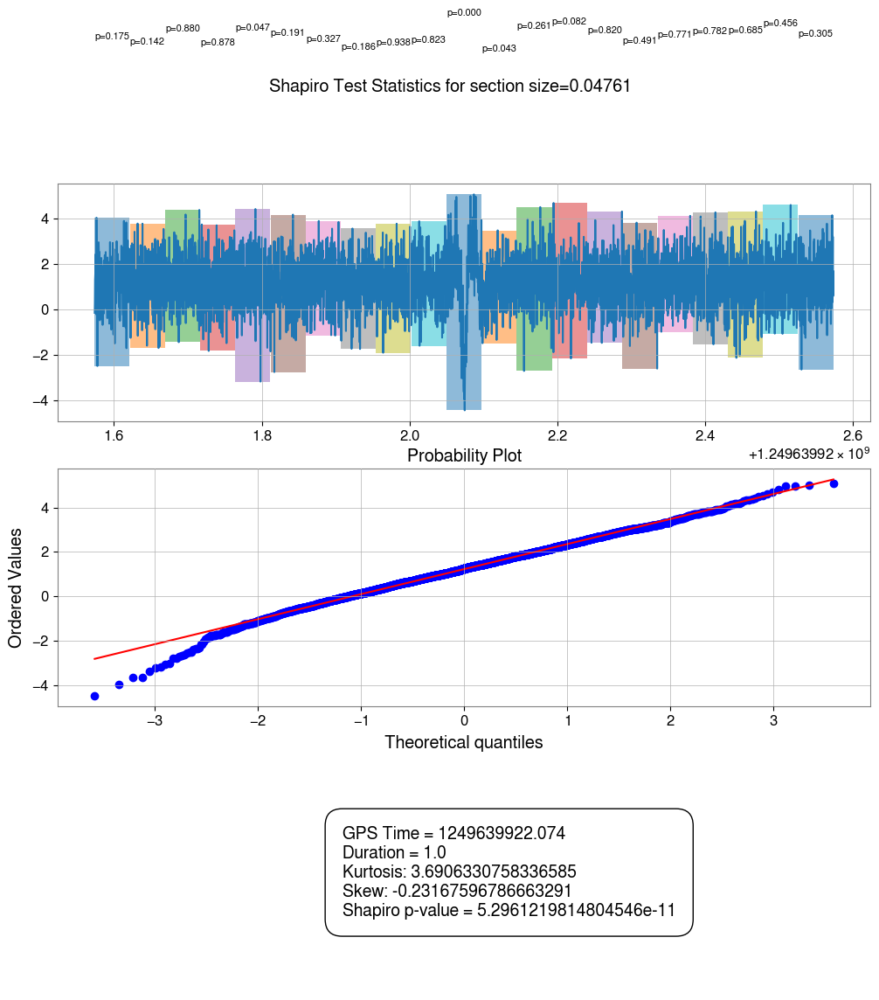

In [62]:
# statistical_testing.display_section_statistics(data_df_tomte.iloc[28],stat_test="Shapiro", sections=21)
statistical_testing.display_section_statistics(data_df_tomte.iloc[28],stat_test="Shapiro", section_size_seconds=0.04761) # (21)

Shapiro Statistics
0.09773905619526738
6.393701468333817e-11
0.47486148250000243


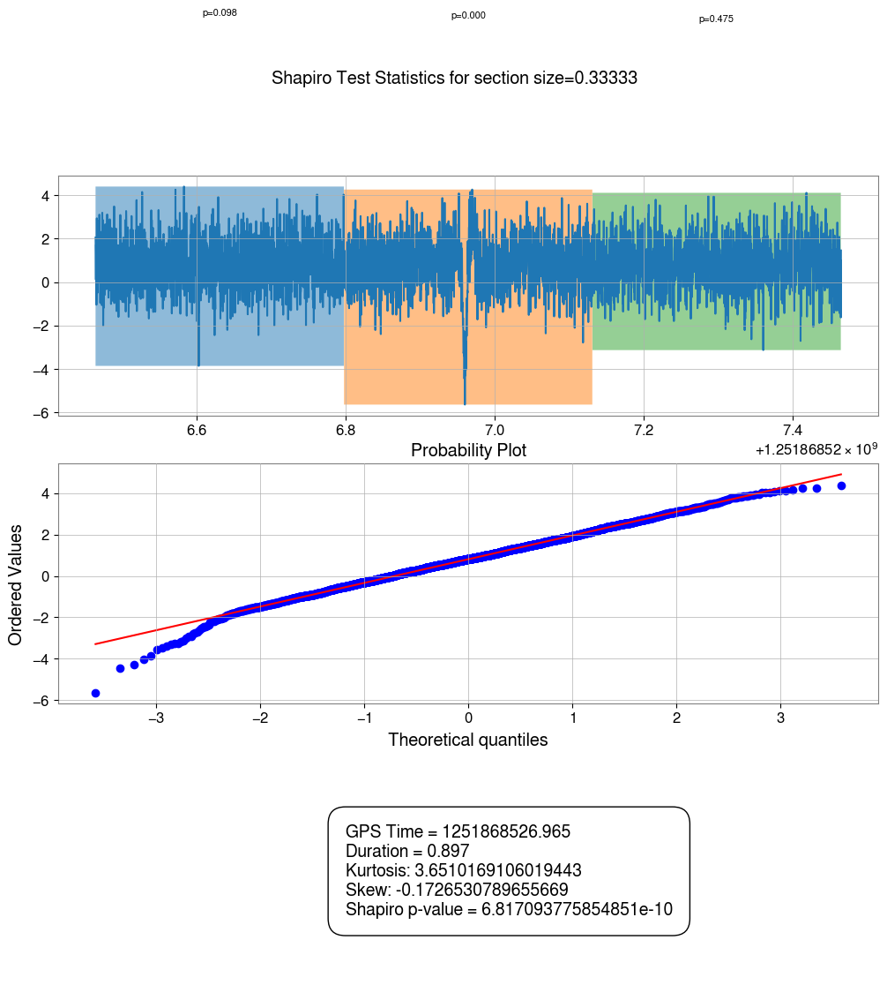

In [63]:
# statistical_testing.display_section_statistics(data_df_tomte.iloc[88],stat_test="Shapiro", sections=9)
statistical_testing.display_section_statistics(data_df_tomte.iloc[88],stat_test="Shapiro", section_size_seconds=0.33333) # (9)

Up to this point I have tested the gitch with a few statistical tests of normality, mainly focusing on the Shapiro-Wilks test. The initial assumption was that the SW test worked well in identifying the 1 second glitch sample to be non-gaussian due to the low p-values. However, on checking the Q-Q plot of the samples against normal distributions, it is found that the samples are actually more akin to gaussian distributions. On testing with smaller chunks of the signal, the Shapiro-Wilks test is able to consistently identify gaussian and non-gaussian sections of the signal.

Hence we see that the test seems to work relatively well when the number of data points per sample is low, however, when we approach a large number of points, say close to 5000, the test fails since the signal represents white noise, giving us a false negatives (Our whitened glitch being identified as gaussian) for a huge portion of our data.

A good use case for what we have experimented with till now could be using the Shapiro on the subsection around our glitch (around 0.25 seconds)

I now want a function which can allow us to study the sample signal using the Shapiro-Wilks, Kolmogorov-Smirnov and Anderson-Darling tests, while also allowing the isolation of the glitched portions of the data for a better understanding of its gaussuanity. I will also be looking at the skewness and kurtosis of our samples to check by how much each sample differs from a normal distribution.

Anderson Statistics
Section 1: 
AD Statistic= 0.23284163922198786
Critical Values=[0.574 0.654 0.785 0.915 1.089]
Section 2: 
AD Statistic= 2.957795213576901
Critical Values=[0.574 0.654 0.785 0.915 1.089]
Section 3: 
AD Statistic= 0.2425446368529265
Critical Values=[0.574 0.654 0.785 0.915 1.089]


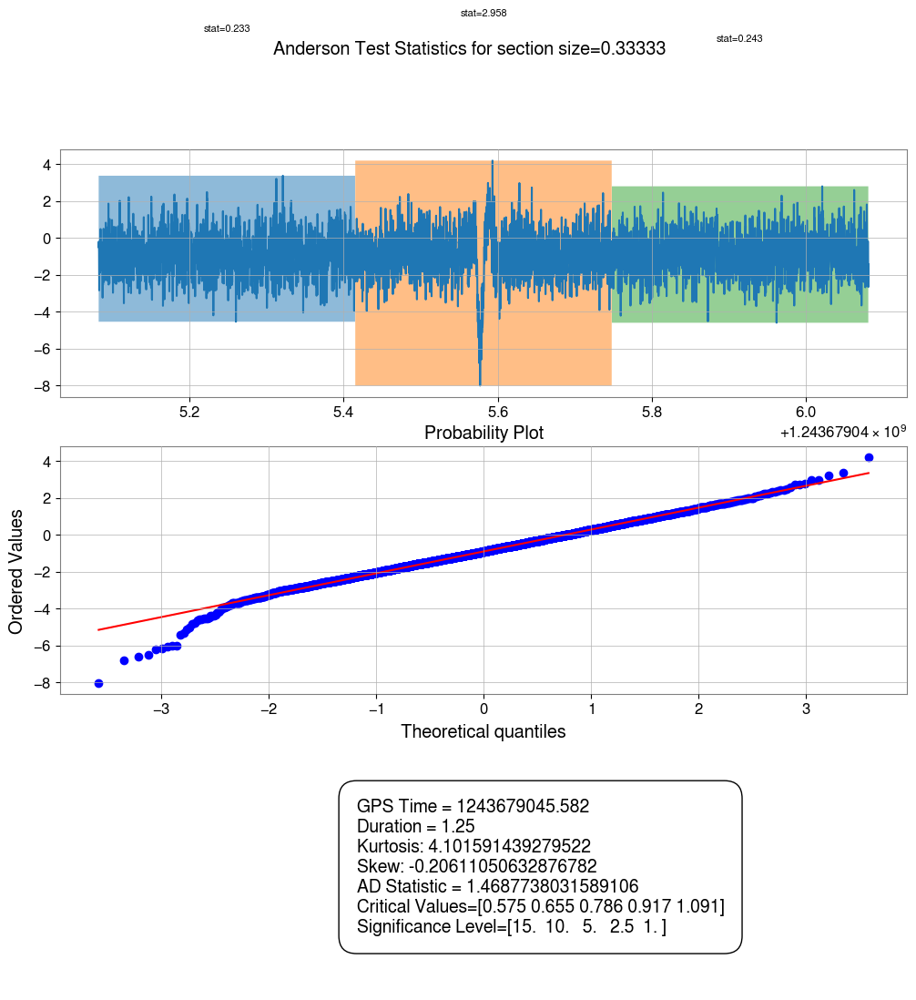

In [64]:
# statistical_testing.display_section_statistics(suspicious_glitch.iloc[0],stat_test="Anderson", sections=9)
statistical_testing.display_section_statistics(suspicious_glitch.iloc[0],stat_test="Anderson", section_size_seconds=0.33333) # (9)

Anderson Statistics
Section 1: 
AD Statistic= 0.22523119062464048
Critical Values=[0.571 0.65  0.78  0.91  1.083]
Section 2: 
AD Statistic= 0.36921170018541716
Critical Values=[0.571 0.65  0.78  0.91  1.083]
Section 3: 
AD Statistic= 0.5636559709123503
Critical Values=[0.571 0.65  0.78  0.91  1.083]
Section 4: 
AD Statistic= 0.22913335829531434
Critical Values=[0.571 0.65  0.78  0.91  1.083]
Section 5: 
AD Statistic= 3.4422958885032244
Critical Values=[0.571 0.65  0.78  0.91  1.083]
Section 6: 
AD Statistic= 0.375372070656681
Critical Values=[0.571 0.65  0.78  0.91  1.083]
Section 7: 
AD Statistic= 0.2243088695397546
Critical Values=[0.571 0.65  0.78  0.91  1.083]
Section 8: 
AD Statistic= 0.2352347932553016
Critical Values=[0.571 0.65  0.78  0.91  1.083]
Section 9: 
AD Statistic= 0.3513587714435289
Critical Values=[0.571 0.65  0.78  0.91  1.083]


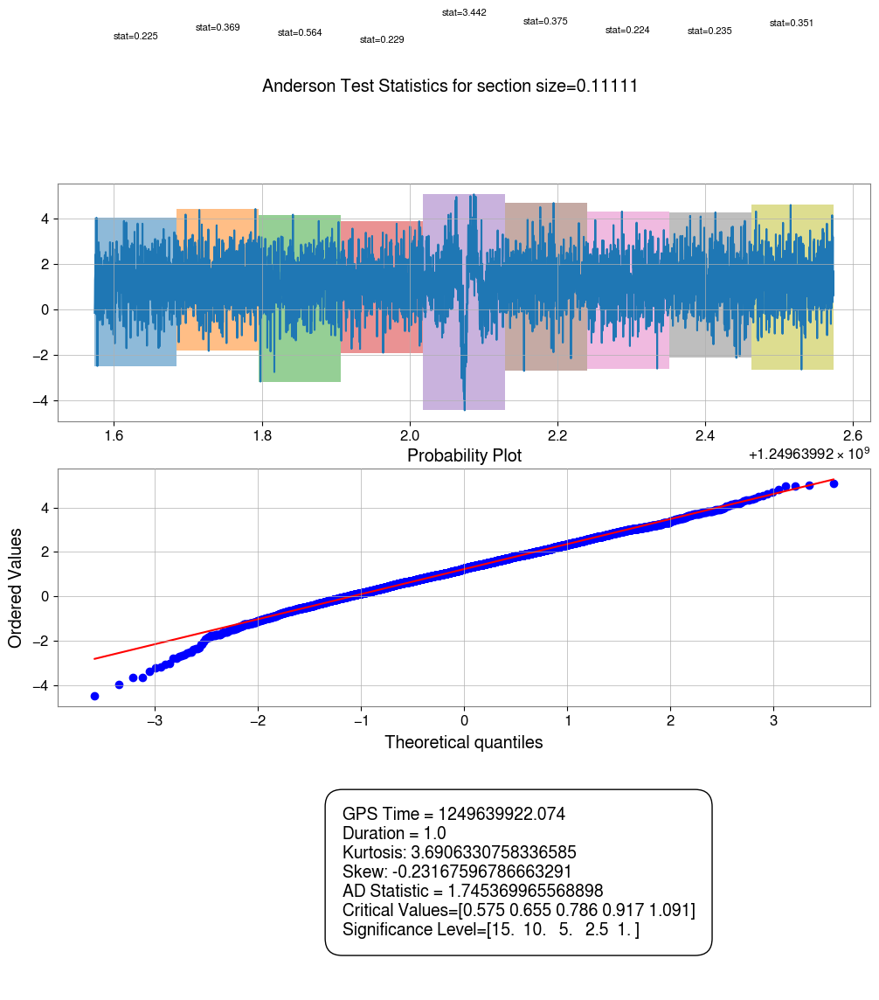

In [65]:
# statistical_testing.display_section_statistics(data_df_tomte.iloc[28],stat_test="Anderson", sections=9)
statistical_testing.display_section_statistics(data_df_tomte.iloc[28],stat_test="Anderson", section_size_seconds=0.11111) # (9)


Anderson Statistics
Section 1: 
AD Statistic= 0.5808867006474259
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 2: 
AD Statistic= 0.6570906459477612
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 3: 
AD Statistic= 0.22622566740693628
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 4: 
AD Statistic= 0.17727782807284598
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 5: 
AD Statistic= 0.4736873381995679
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 6: 
AD Statistic= 0.4054354031156322
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 7: 
AD Statistic= 0.31483350459245685
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 8: 
AD Statistic= 0.37059906899412454
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 9: 
AD Statistic= 0.2164354395909811
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 10: 
AD Statistic= 0.24212143929722174
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 11: 
AD Statistic= 3.205262063066470

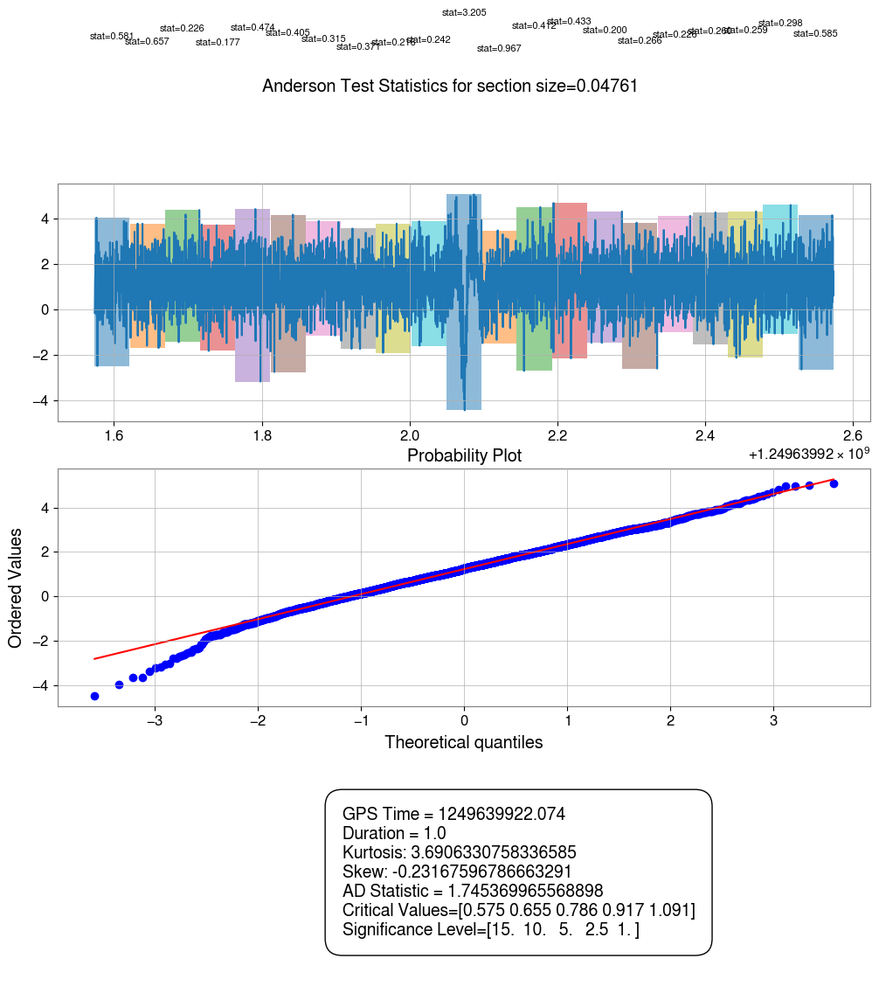

In [66]:
# statistical_testing.display_section_statistics(data_df_tomte.iloc[28],stat_test="Anderson", sections=21)
statistical_testing.display_section_statistics(data_df_tomte.iloc[28],stat_test="Anderson", section_size_seconds=0.04761) # (21)

Anderson Statistics
Section 1: 
AD Statistic= 0.5808867006474259
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 2: 
AD Statistic= 0.6570906459477612
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 3: 
AD Statistic= 0.22622566740693628
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 4: 
AD Statistic= 0.17727782807284598
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 5: 
AD Statistic= 0.4736873381995679
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 6: 
AD Statistic= 0.4054354031156322
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 7: 
AD Statistic= 0.31483350459245685
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 8: 
AD Statistic= 0.37059906899412454
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 9: 
AD Statistic= 0.2164354395909811
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 10: 
AD Statistic= 0.24212143929722174
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 11: 
AD Statistic= 3.205262063066470

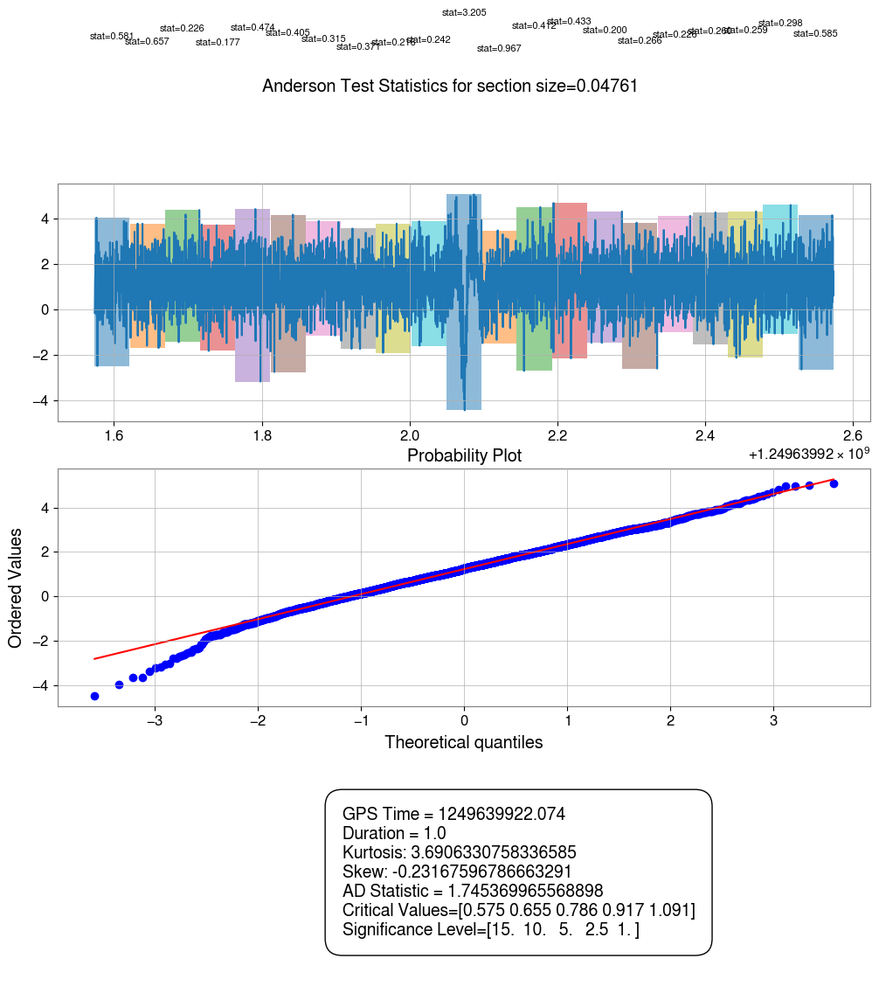

In [67]:
# statistical_testing.display_section_statistics(data_df_tomte.iloc[28],stat_test="Anderson", sections=21)
statistical_testing.display_section_statistics(data_df_tomte.iloc[28],stat_test="Anderson", section_size_seconds=0.04761) # (21) 

Anderson Statistics
Section 1: 
AD Statistic= 0.5808867006474259
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 2: 
AD Statistic= 0.6570906459477612
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 3: 
AD Statistic= 0.22622566740693628
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 4: 
AD Statistic= 0.17727782807284598
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 5: 
AD Statistic= 0.4736873381995679
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 6: 
AD Statistic= 0.4054354031156322
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 7: 
AD Statistic= 0.31483350459245685
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 8: 
AD Statistic= 0.37059906899412454
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 9: 
AD Statistic= 0.2164354395909811
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 10: 
AD Statistic= 0.24212143929722174
Critical Values=[0.565 0.643 0.772 0.9   1.071]
Section 11: 
AD Statistic= 3.205262063066470

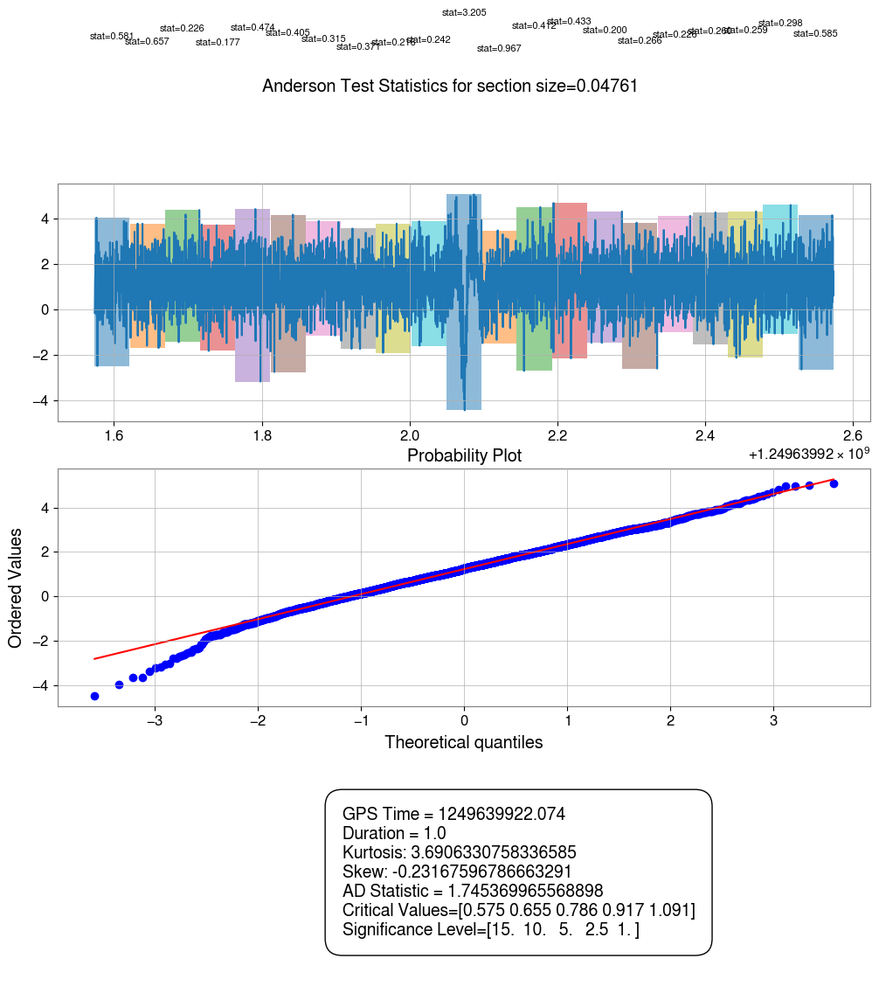

In [68]:
# statistical_testing.display_section_statistics(data_df_tomte.iloc[28],stat_test="Anderson", sections=21)
statistical_testing.display_section_statistics(data_df_tomte.iloc[28],stat_test="Anderson", section_size_seconds=0.04761) # (21)

KS Statistics
0.7182388690856716
0.8230582665384996
0.399970796157055
0.6068072254839504
0.21057158451497518
0.2417153436520942
0.2761682314871651
0.399970796157055
0.6626523748908518
1.0


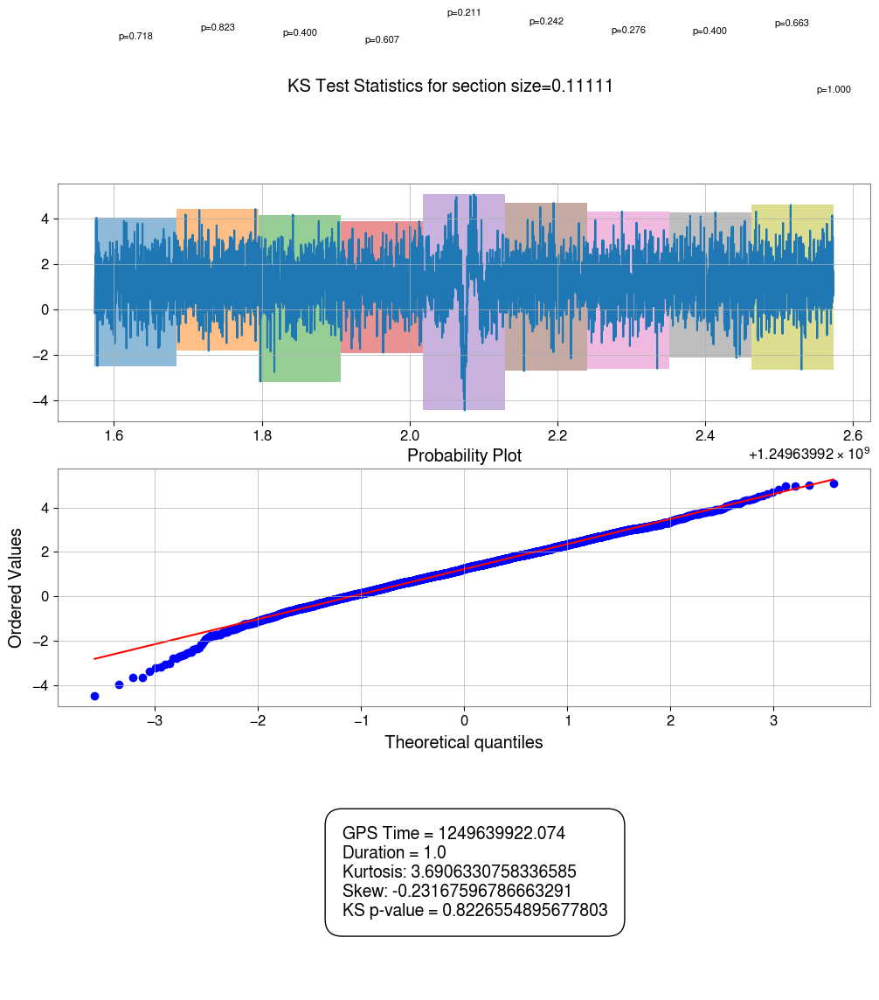

In [69]:
# statistical_testing.display_section_statistics(data_df_tomte.iloc[28],stat_test="KS", sections=9)
statistical_testing.display_section_statistics(data_df_tomte.iloc[28],stat_test="KS", section_size_seconds=0.11111) # (9)

This glitch, for some reason, fails most of the tests. I want to study it a bit.

[This](https://stats.stackexchange.com/questions/20793/what-is-gaussianity-and-how-do-you-perform-gaussianity-testing-in-macroeconom) stackexchange post goes a bit into testing gaussianity for time series information that could be useful. It, however criticizes the approach of using elliptically symmetric distributions (normal distributions) as a way to test gaussianity of a timeseries.

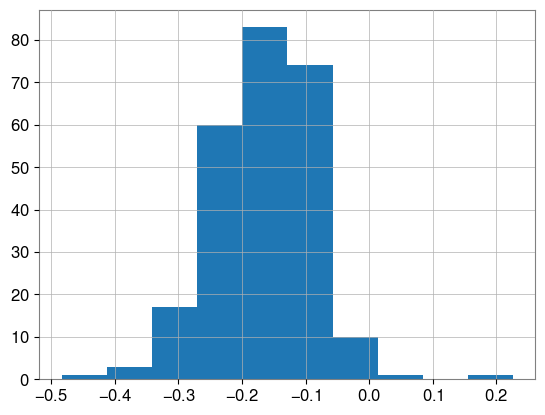

In [70]:
plt.hist(data_df_tomte['skew'])
plt.show()

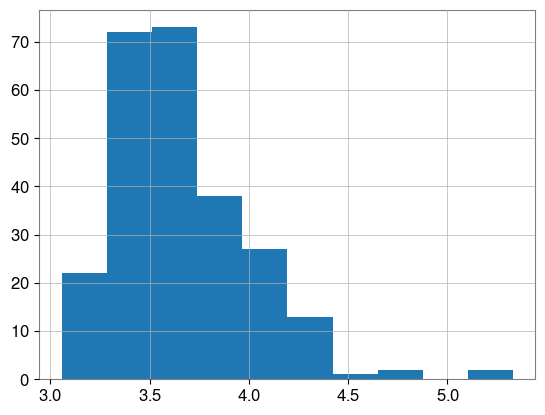

In [71]:
plt.hist(data_df_tomte['kurtosis'])
plt.show()

KS Statistics
0.7722156003089574
0.9090532154995592
0.2417153436520942
0.11587608223026544
0.2417153436520942
0.399970796157055
0.8691712738433836
0.3140231770175474
0.6626523748908518
1.0


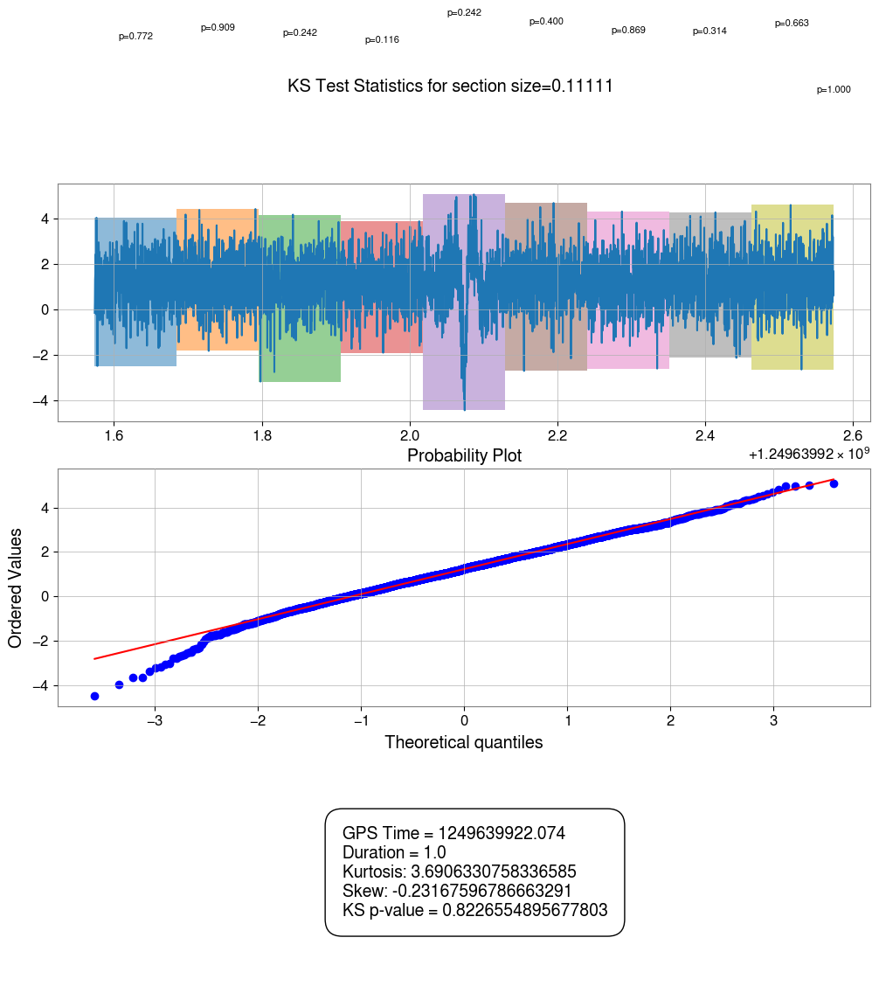

In [72]:
# statistical_testing.section_statistics(data_df_tomte.iloc[28],stat_test="KS", sections=9, display_plots=False)
statistical_testing.display_section_statistics(data_df_tomte.iloc[28],stat_test="KS", section_size_seconds=0.11111) # (9)

Initial statistical testing of the glitches with a time window of 3 seconds showed that the glitch sample at GPS time 1248343512.793 was an outlier. However, this was caused due to the time window in consideration being very small before whitening was performed on the glitch. This led to residual energy peaks disrupting the whitening process for the given sample. This was solved by using a larger window (5 seconds on each side).

In [73]:
outlier_glitch = data_df_tomte.loc[data_df_tomte["GPStime"] == 1248343512.793]

In [74]:
outlier_glitch

,GPStime,snr,duration,confidence,ifo,label,unwhitened_y,whitened_y,t,q_scan,shapiro_statistic,shapiro_pvalue,shapiro_prediction,ks_statistic,ks_pvalue,ks_prediction,ad_statistic,ad_critical_values,ad_significance_level,ad_prediction,kurtosis,skew,glitch_present,ewm_y,ewm_q_transform,ewm_shapiro_pvalue
78,1248343512.79300,22.43900,0.87500,1.00000,L1,Tomte,"[1.0213084965931745e-19, 1.0786808828124569e-1...","[0.3040292942376957, 0.7818574043836505, 0.509...","[1248343512.2929688 s, 1248343512.293213 s, 12...",[[FrequencySeries(0.2174753\n u...,0.99217,0.00000,1,0.01416,0.80615,0,1.67461,"[0.575, 0.655, 0.786, 0.917, 1.091]","[15.0, 10.0, 5.0, 2.5, 1.0]",1,4.04930,-0.25544,1,"[0.3040292942376957, 0.6282697975510221, 0.558...",[[FrequencySeries(1.0589323\n u...,0.00000


There is one glitch that fails the Shapiro-Wilks test. I want to study this a bit deeper.

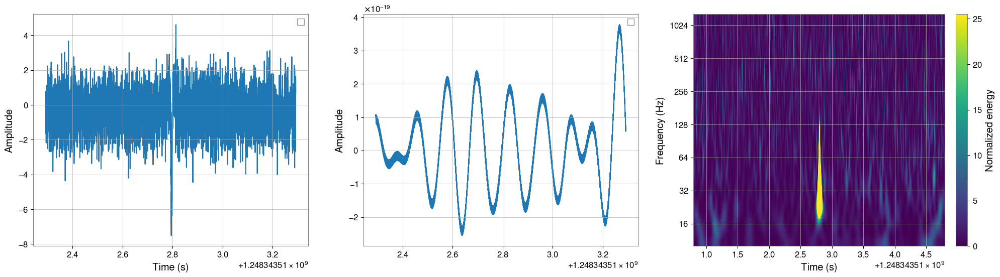

In [75]:
statistical_testing.display_sample_plots(outlier_glitch.iloc[0])

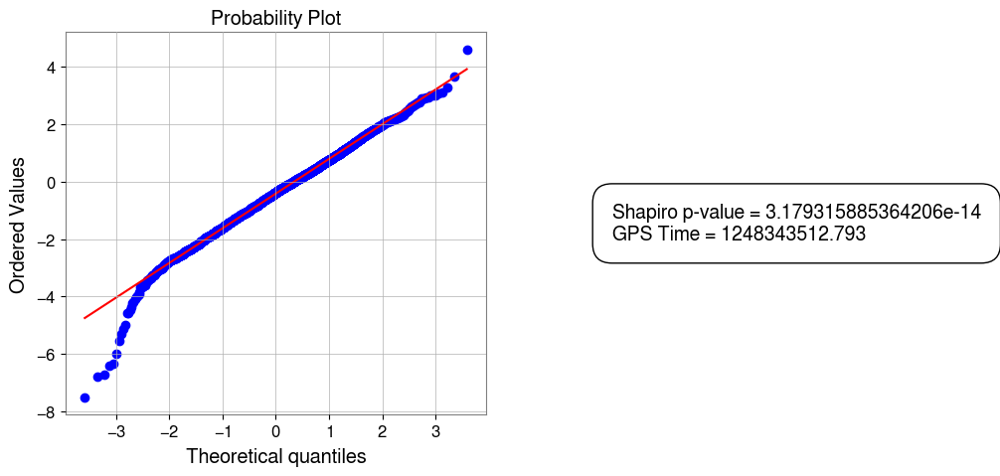

In [76]:
statistical_testing.display_probability_plot(outlier_glitch.iloc[0])

Shapiro Statistics
0.9174441308976289
0.423178960231404
0.2546323072206543
0.7795787390200857
4.0262629422655906e-11
0.834573737960133
0.9530693071147311
0.879807188576255
0.39868343642359916


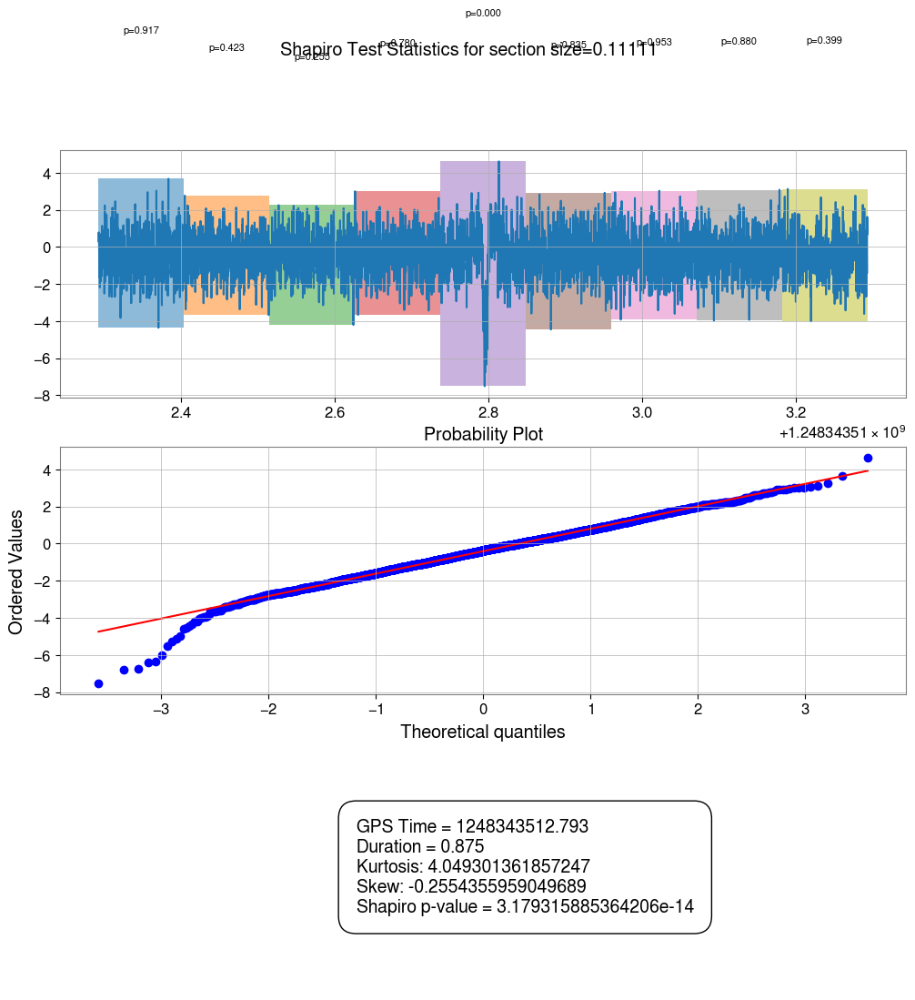

In [77]:
statistical_testing.display_section_statistics(outlier_glitch.iloc[0], section_size_seconds=0.11111)

# Testing GravitySpyTable/EventTable

For the below code to work you will need a few packages to be installed as follows

```bash
pip install sqlalchemy dotenv psycopg2
```

In [78]:
# import os
# from dotenv import find_dotenv,load_dotenv
# from gwpy.table import EventTable
# from gwpy.table import GravitySpyTable

# load_dotenv(find_dotenv(), verbose=True)

For the code from here on out to work, you will need to use `.env` files to load a username and password unique to you. Make a `.env` file in the same folder as this notebook with the following information

```env
GRAVITYSPY_DATABASE_USER='username'
GRAVITYSPY_DATABASE_PASSWD='password'
```

The code below adds the GravitySpy database username and password from the .env file to your system environment variable which can then be used by `GravitySpyTable` to authenticate you as a valid LIGO member accessing the information. More information on this can be found in the [documentation](https://gwpy.github.io/docs/latest/table/io/)

In [79]:
# GRAVITYSPY_DATABASE_USER = os.getenv('GRAVITYSPY_DATABASE_USER')
# GRAVITYSPY_DATABASE_PASSWD = os.getenv('GRAVITYSPY_DATABASE_PASSWD')

Now that the above cell has been run, we can now access the dataset of our choice as follows.

In [80]:
# if not os.path.exists("./gspy_glitches"):
#     os.makedirs("./gspy_glitches")
# if not os.path.exists("./gspy_glitches/gspy_tomtes.csv"):
#     tomtes = GravitySpyTable.fetch(
#         "gravityspy",
#         "glitches",
#         selection="ml_label=Tomte"
#     ).to_pandas()
#     tomtes.to_csv("gspy_glitches/gspy_tomtes.csv", index=False)

In [81]:
# if not os.path.exists("./gspy_glitches"):
#     os.makedirs("./gspy_glitches")
# if not os.path.exists("./gspy_glitches/gspy_extremely_loud.csv"):
#     extremely_loud = GravitySpyTable.fetch(
#         "gravityspy",
#         "glitches",
#         selection="ml_label=Extremely_Loud"
#     ).to_pandas()
#     extremely_loud.to_csv("gspy_glitches/gspy_extremely_loud.csv", index=False)

Hence, loading up datasets from GravitySpy is much easier than anticipated.

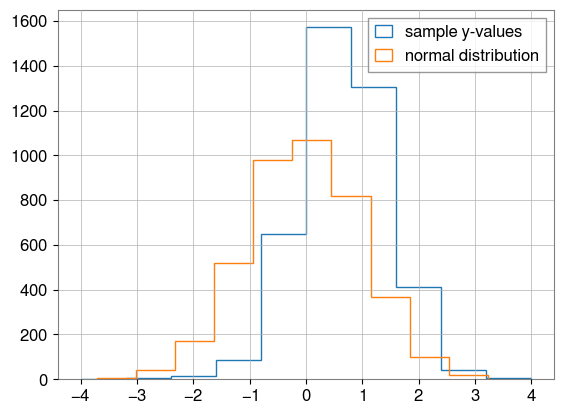

In [82]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(-4,4))
# fig,ax = plt.subplots(figsize=(6,10))

fig = plt.figure(dpi=100)
plt.hist(scaler.fit_transform(suspicious_glitch['whitened_y'].iloc[0].reshape(-1,1)), label="sample y-values", histtype='step')
plt.hist(stats.norm.rvs(size=len(suspicious_glitch['whitened_y'].iloc[0]), random_state=np.random.default_rng()), label="normal distribution", histtype='step')
plt.legend()
plt.show()

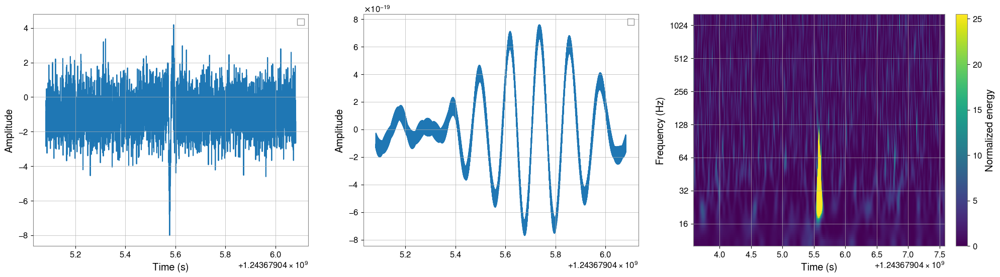

In [83]:
statistical_testing.display_sample_plots(suspicious_glitch.iloc[0])

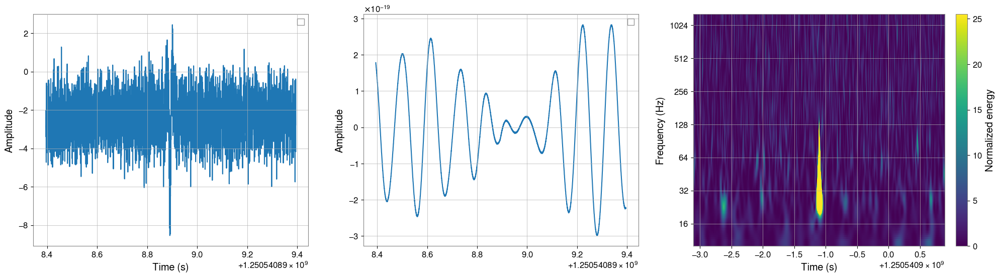

In [84]:
statistical_testing.display_sample_plots(suspicious_glitch.iloc[1])

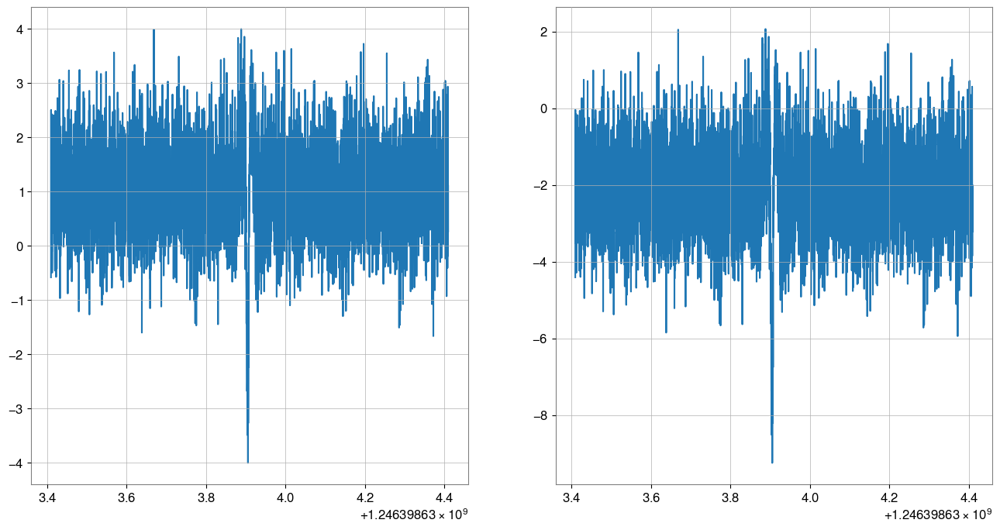

In [85]:
scaler = MinMaxScaler(feature_range=(-4,4))
# fig,ax = plt.subplots(figsize=(6,10))

fig, ax = plt.subplots(1,2,dpi=100, figsize=(16,8))
ax[0].plot(data_df_tomte['t'].iloc[4], scaler.fit_transform(data_df_tomte['whitened_y'].iloc[4].reshape(-1,1)), label="Shapiro p-value")
ax[1].plot(data_df_tomte['t'].iloc[4], data_df_tomte['whitened_y'].iloc[4], label="Shapiro p-value (rescaled)")

plt.show()

# Confusion Matrices for the chosen statistics


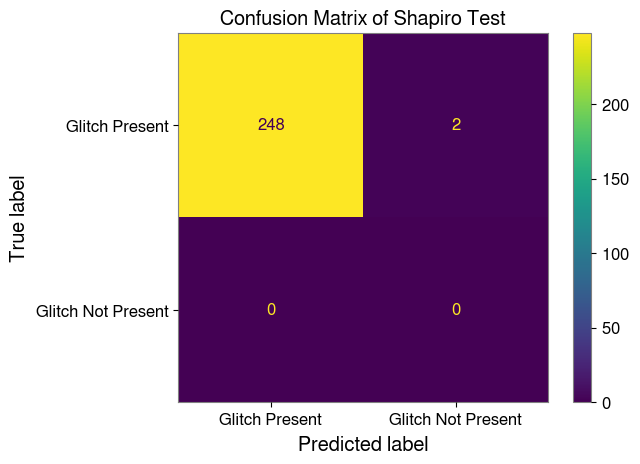

In [86]:
# cm = statistical_testing.generate_confusion_matrix(data_df_tomte)
statistical_testing.display_confusion_matrix(data_df_tomte)

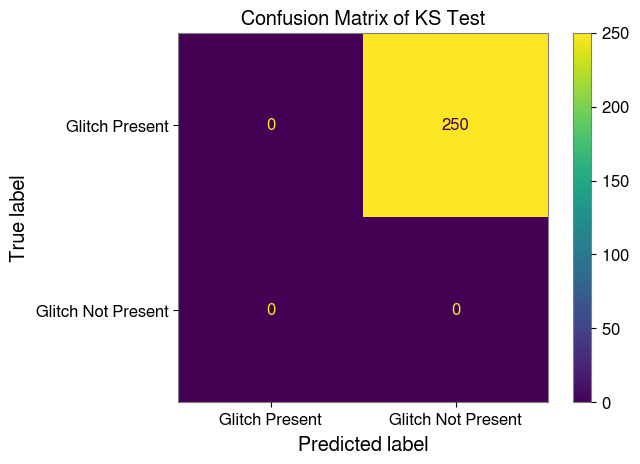

In [87]:
# cm = statistical_testing.generate_confusion_matrix(data_df_tomte,'KS')
statistical_testing.display_confusion_matrix(data_df_tomte,'KS')

In [88]:
idx = 10

failing_case = data_df_tomte.loc[data_df_tomte["shapiro_pvalue"] > 0.05]

scaler = StandardScaler()

np.random.seed(42)

fig = plt.figure(dpi=100)
plt.hist(scaler.fit_transform(failing_case.iloc[idx]['whitened_y'].reshape(-1,1)), label="sample y-values", histtype='step')
plt.hist(stats.norm.rvs(size=len(failing_case.iloc[idx]['whitened_y'])), label="normal distribution", histtype='step')
plt.legend()
plt.show()

IndexError: single positional indexer is out-of-bounds

<Figure size 640x480 with 0 Axes>

In [ ]:
failing_case.iloc[10]

GPStime                                                   1245470832.42400
snr                                                               22.85600
duration                                                           0.75000
confidence                                                         1.00000
ifo                                                                     L1
label                                                                Tomte
unwhitened_y             [1.931241093189619e-19, 1.946462295912979e-19,...
whitened_y               [96.88900055896656, 24.769758285787557, -155.0...
t                        [1.5 s, 1.500244140625 s, 1.50048828125 s, 1.5...
q_scan                   [[FrequencySeries(0.84032536\n                ...
shapiro_statistic                                                  0.99955
shapiro_pvalue                                                     0.47321
shapiro_prediction                                                       0
ks_statistic             

In [89]:
scattered_light_selction = glitches[(glitches['label'] == 'Scattered_Light') & (glitches['ifo'] == 'L1')]

In [90]:
df_Scattered_Light_5s = statistical_testing.fetch_glitch_data_from_csv(scattered_light_selction, n_samples=250)

Failed to generate q-transform for 1252088898.875
Input signal contains non-numerical values


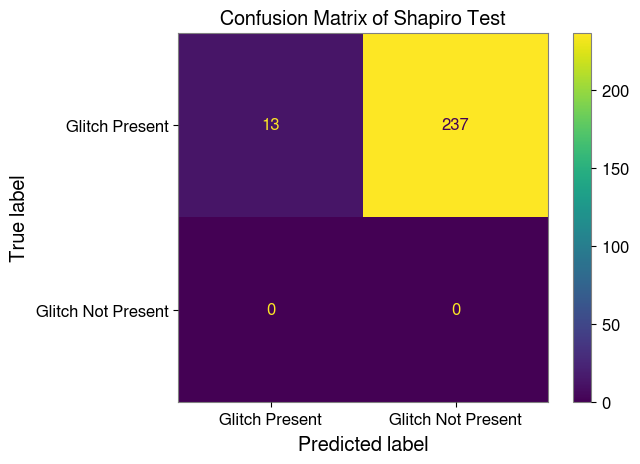

In [91]:
# cm = statistical_testing.generate_confusion_matrix(df_Scattered_Light_5s)
statistical_testing.display_confusion_matrix(df_Scattered_Light_5s)

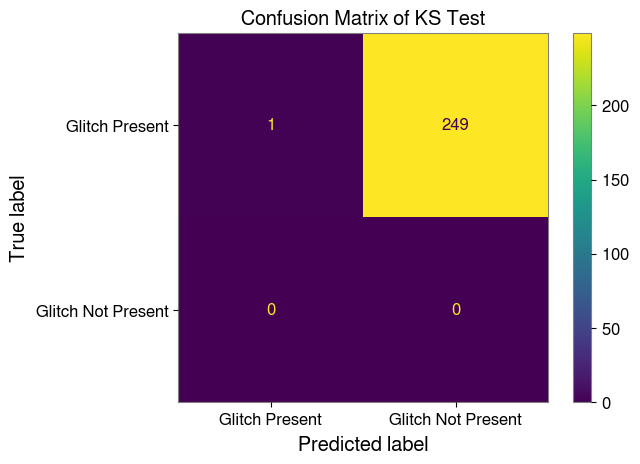

In [92]:
# cm = statistical_testing.generate_confusion_matrix(df_Scattered_Light_5s, "KS")
statistical_testing.display_confusion_matrix(df_Scattered_Light_5s, "KS")

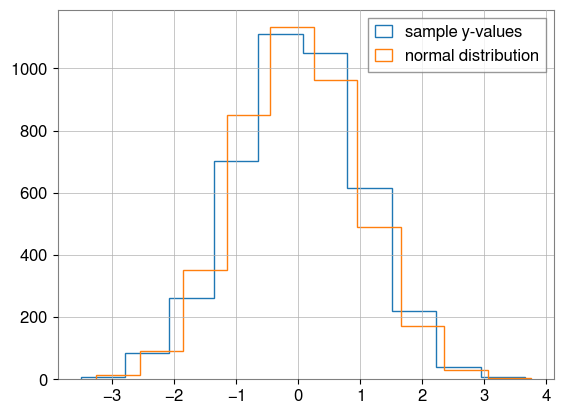

In [93]:
idx = 2

fig = plt.figure(dpi=100)
plt.hist(scaler.fit_transform(df_Scattered_Light_5s['whitened_y'].iloc[idx].reshape(-1,1)), label="sample y-values", histtype='step')
plt.hist(stats.norm.rvs(size=len(df_Scattered_Light_5s['whitened_y'].iloc[idx]), random_state=np.random.default_rng()), label="normal distribution", histtype='step')
plt.legend()
plt.show()

Judging from previous testing I have found that

- The **tomte** glitches, for the most part behave well with the Shapiro-Wilks test, giving us a p-value of less than 0.05. There are two main cases here where the test fails, and we observe that both these cases have relatively low signal-to-noise ratios.
  - The first sample is at GPS time 1251419205.832, with an SNR of 18.001. The q-scan of this glitch shows us two peaks instead of one which would be expected from a tomte glitch. There is a high possibility that this could have led to the test failing.
  - The second sample is at GPS time 1241711101.473 with an SNR of 16.089. The time series of this glitch shows a number of neighboring peaks along with the current glitch. There is a chance that this coupled with the low SNR could have contributed to the Shapiro-Wilks test failing.

- In these cases I found that the Kolmogorov-Smirnov test seems to work well at detecting a deviation of our glitches' ampltude distribution from that of a randomly sampled normal distribution.
  - I would, however, not trust this test wholly at its current state, since it compares our glitch with a synthesized normal distribution instead of actual on-ground interferometer signals, which are not necessarily gaussian.

- I performed the same tests on 50 samples of Scattered light glitches and found that the Shapiro-Wilks test failed in detecting the presence of a glitch for most cases, while the Kolmogorov-Smirnov test worked fairly well with a few false negatives.
  - An important consideration hee is that the time window was 5 seconds around the glitch, while scattered light glitches can have very large time windows. Hence making this test invalid.

I will perform the same test as before but with a larger time window on the scattered light glitches

In [94]:
# This will result in the final time window tested being 5.5 seconds arond the glitch (-4.5 seconds on each side) 
df_Scattered_Light_10s = statistical_testing.fetch_glitch_data_from_csv(scattered_light_selction,tw=10, begin=0, n_samples=250)

Failed to generate q-transform for 1252088898.875
Input signal contains non-numerical values
Failed to generate q-transform for 1253331036.938
Input signal contains non-numerical values


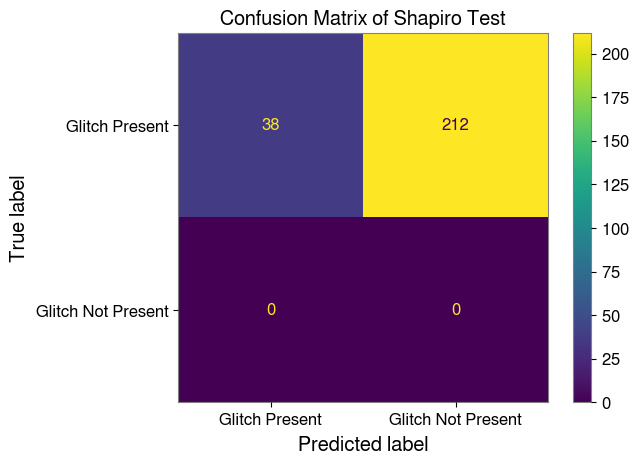

In [95]:
# cm = statistical_testing.generate_confusion_matrix(df_Scattered_Light_10s)
statistical_testing.display_confusion_matrix(df_Scattered_Light_10s)

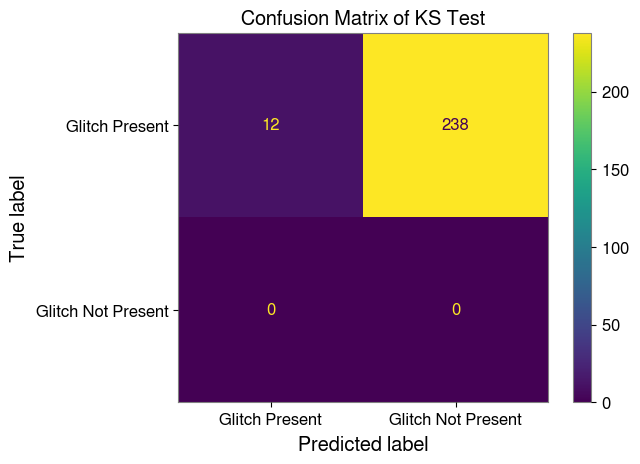

In [96]:
# cm = statistical_testing.generate_confusion_matrix(df_Scattered_Light_10s, "KS")
statistical_testing.display_confusion_matrix(df_Scattered_Light_10s, "KS")

The results seem to be similar. However, a good rule of thumb would be to look at the evvaluation metrics (Accuracy, Precision, Recall and F1 Score).

Looking at the evaluation metrics for the Shapiro-Wilks test, we get

In [97]:
cm = statistical_testing.generate_confusion_matrix(df_Scattered_Light_10s)
print("Accuracy, Precision, Recall, F1 Score:", statistical_testing.generate_evaluation_metrics(cm))



Accuracy, Precision, Recall, F1 Score: (np.float64(0.152), np.float64(1.0), np.float64(0.152), np.float64(0.2638888888888889))


Applying the same for the Kolmogorov-Smirnov test, we get

In [98]:
cm = statistical_testing.generate_confusion_matrix(df_Scattered_Light_10s, "KS")
print("Accuracy, Precision, Recall, F1 Score:", statistical_testing.generate_evaluation_metrics(cm))

Accuracy, Precision, Recall, F1 Score: (np.float64(0.048), np.float64(1.0), np.float64(0.048), np.float64(0.0916030534351145))


# Testing the Shapiro-Wilks and Kolmogorov-Smirnov tests with different glitch samples

Now that I have all the glitches at hand. I want to test how the Shapiro-Wilks and Kolmogorov-Smirnov tests work on each of the glitch samples.

First, however, I want to sample 100 of each type of glitch

In [ ]:
if not os.path.isfile("./glitches/random_samples.csv"):
    sample_df = glitches[glitches['ifo'] == 'L1'].groupby('label').apply(lambda x: x.sample(n=min(len(x),50))).reset_index(drop=True)
    sample_df.to_csv("./glitches/random_samples.csv", index=False)
else:
    sample_df = pd.read_csv("./glitches/random_samples.csv", index_col=False)

# sample_df["glitch_present"] = 1

In [100]:
glitches["label"].value_counts()

label
Scattered_Light        26233
Low_Frequency_Burst    23872
Fast_Scattering        21898
Tomte                  19934
No_Glitch              13119
Extremely_Loud         12516
Low_Frequency_Lines    12288
Koi_Fish               10288
Blip_Low_Frequency      8616
Whistle                 7365
Blip                    6526
1400Ripples             2388
None_of_the_Above       1713
Power_Line              1399
Scratchy                1325
Repeating_Blips         1274
Air_Compressor           640
Violin_Mode              544
Paired_Doves             232
Helix                    206
Light_Modulation         196
Wandering_Line           169
1080Lines                 14
Chirp                     10
Name: count, dtype: int64

In [101]:
sample_df.shape

(1006, 6)

In [102]:
sample_df["label"].value_counts()

label
1400Ripples            50
Air_Compressor         50
Blip                   50
Extremely_Loud         50
Blip_Low_Frequency     50
Koi_Fish               50
Fast_Scattering        50
Tomte                  50
Repeating_Blips        50
Light_Modulation       50
Low_Frequency_Burst    50
No_Glitch              50
Low_Frequency_Lines    50
Paired_Doves           50
Power_Line             50
Whistle                50
Violin_Mode            50
Scattered_Light        50
Scratchy               50
Helix                  21
Wandering_Line         20
1080Lines               9
Chirp                   6
Name: count, dtype: int64

The following code will take a lot of time to execute. I have put safeguards in place to skip files that fail to load. I would normally use a progress bar for this but the issue with that would be the size of the file increasing considerably. Instead, you can confirm the code to be working by opening a terminal, changing directory to the `glitch_timeseries_data/` folder and running the following command

```bash
find . -type f -name 'sample*' | wc -l
```
If you see the count increasing with subsequent executions of this command, it means that the code is mostly working as expected.

In [ ]:
labels = ['1080Lines', '1400Ripples', 'Air_Compressor', 'Blip',
       'Blip_Low_Frequency', 'Chirp', 'Extremely_Loud',
       'Fast_Scattering', 'Helix', 'Koi_Fish',
       'Light_Modulation', 'Low_Frequency_Burst',
       'Low_Frequency_Lines', 'No_Glitch', 'Paired_Doves',
       'Power_Line', 'Repeating_Blips', 'Scattered_Light',
       'Scratchy', 'Tomte', 'Violin_Mode', 'Wandering_Line',
       'Whistle']

columns = [
    'label', "shapiro_TP", "shapiro_FN",
    "shapiro_FP", "shapiro_TN", "shapiro_accuracy",
    "shapiro_precision", "shapiro_recall", "shapiro_f1_score", "KS_TP",
    "KS_FN", "KS_FP", "KS_TN",
    "KS_accuracy", "KS_precision", "KS_recall",
    "KS_f1_score", "AD_TP", "AD_FN", "AD_FP", "AD_TN",
    "AD_accuracy", "AD_precision", "AD_recall", "AD_f1_score"]


def generate_glitchwise_confusion_matrices(df, bandpass=False):

    scaler = StandardScaler()

    confusion_matrix_df = pd.DataFrame(columns=columns)
    for label in labels:
        temp_df = df[df['label'] == label]

        # print(f"Loading {label} data...")
        temp_df = statistical_testing.fetch_glitch_data_from_csv(temp_df, tw=10, bandpass=bandpass)
        temp_df.dropna(inplace=True)

        # print(f"Generating confusion matrix for {label}...")
        shapiro_cm = statistical_testing.generate_confusion_matrix(temp_df)
        ks_cm = statistical_testing.generate_confusion_matrix(temp_df, "KS")
        ad_cm = statistical_testing.generate_confusion_matrix(temp_df, "Anderson")

        shapiro_metrics = list(statistical_testing.generate_evaluation_metrics(shapiro_cm))
        ks_metrics = list(statistical_testing.generate_evaluation_metrics(ks_cm))
        ad_metrics = list(statistical_testing.generate_evaluation_metrics(ad_cm))

        shapiro_cm = shapiro_cm.flatten()
        ks_cm = ks_cm.flatten()
        ad_cm = ad_cm.flatten()

        confusion_matrix_df = pd.concat([confusion_matrix_df, pd.DataFrame([[label] + shapiro_cm.tolist() + shapiro_metrics + ks_cm.tolist() + ks_metrics + ad_cm.tolist() + ad_metrics], columns=columns)], ignore_index=True)

    return confusion_matrix_df
    

In [104]:
results = generate_glitchwise_confusion_matrices(sample_df)

Loading 1080Lines data...


Generating confusion matrix for 1080Lines...
Loading 1400Ripples data...
Generating confusion matrix for 1400Ripples...
Loading Air_Compressor data...
Generating confusion matrix for Air_Compressor...
Loading Blip data...
Generating confusion matrix for Blip...
Loading Blip_Low_Frequency data...
Generating confusion matrix for Blip_Low_Frequency...
Loading Chirp data...
Generating confusion matrix for Chirp...
Loading Extremely_Loud data...
Generating confusion matrix for Extremely_Loud...
Loading Fast_Scattering data...
Generating confusion matrix for Fast_Scattering...
Loading Helix data...
Generating confusion matrix for Helix...
Loading Koi_Fish data...
Generating confusion matrix for Koi_Fish...
Loading Light_Modulation data...
Generating confusion matrix for Light_Modulation...
Loading Low_Frequency_Burst data...
Failed to generate q-transform for 1249605198.875
Input signal contains non-numerical values
Generating confusion matrix for Low_Frequency_Burst...
Loading Low_Frequency

In [105]:
results

,label,shapiro_TP,shapiro_FN,shapiro_FP,shapiro_TN,shapiro_accuracy,shapiro_precision,shapiro_recall,shapiro_f1_score,KS_TP,KS_FN,KS_FP,KS_TN,KS_accuracy,KS_precision,KS_recall,KS_f1_score,AD_TP,AD_FN,AD_FP,AD_TN,AD_accuracy,AD_precision,AD_recall,AD_f1_score
0,1080Lines,4,5,0,0,0.44444,1.00000,0.44444,0.61538,0,9,0,0,0.00000,0,0.00000,0,1,8,0,0,0.11111,1.00000,0.11111,0.20000
1,1400Ripples,36,14,0,0,0.72000,1.00000,0.72000,0.83721,0,50,0,0,0.00000,0,0.00000,0,13,37,0,0,0.26000,1.00000,0.26000,0.41270
2,Air_Compressor,4,46,0,0,0.08000,1.00000,0.08000,0.14815,0,50,0,0,0.00000,0,0.00000,0,4,46,0,0,0.08000,1.00000,0.08000,0.14815
3,Blip,49,1,0,0,0.98000,1.00000,0.98000,0.98990,13,37,0,0,0.26000,1.00000,0.26000,0.41270,33,17,0,0,0.66000,1.00000,0.66000,0.79518
4,Blip_Low_Frequency,9,41,0,0,0.18000,1.00000,0.18000,0.30508,1,49,0,0,0.02000,1.00000,0.02000,0.03922,7,43,0,0,0.14000,1.00000,0.14000,0.24561
5,Chirp,2,4,0,0,0.33333,1.00000,0.33333,0.50000,0,6,0,0,0.00000,0,0.00000,0,0,6,0,0,0.00000,0.00000,0.00000,0.00000
6,Extremely_Loud,50,0,0,0,1.00000,1.00000,1.00000,1.00000,50,0,0,0,1.00000,1.00000,1.00000,1.00000,50,0,0,0,1.00000,1.00000,1.00000,1.00000
7,Fast_Scattering,0,50,0,0,0.00000,0.00000,0.00000,0.00000,0,50,0,0,0.00000,0,0.00000,0,2,48,0,0,0.04000,1.00000,0.04000,0.07692
8,Helix,19,2,0,0,0.90476,1.00000,0.90476,0.95000,7,14,0,0,0.33333,1.00000,0.33333,0.50000,19,2,0,0,0.90476,1.00000,0.90476,0.95000
9,Koi_Fish,50,0,0,0,1.00000,1.00000,1.00000,1.00000,46,4,0,0,0.92000,1.00000,0.92000,0.95833,49,1,0,0,0.98000,1.00000,0.98000,0.98990


From the given results, we can see that the Shapiro-Wilks test has a lot of false negatives in comaprison to the Kolmogorov-Smirnov test. There is a chance that this could be indicative of The Shapiro-Wilks test failing for a lot of the gltiches.

## Regarding the Data Quality of the Glitches

From above, we have seen that the Shapiro-Wilks test has a large number of false negatives, while the Kolmogorov-Smirnov test works better. One of the assumptions for why this occurs is the quality of the data we are working with.

The samples at hand though large in number, are not necessarily good examples of typical glitch samples we would expect to see from an interferometer run. For this, we have generated a new dataset that selects examples of glitches that "behave well"

I will be performing the tests once more on these glitches to see how the results change.

In [106]:
dq_glitches = pd.read_csv('./glitches/DQ_glitches_O3a.csv', usecols=['GPStime', 'snr', 'duration', 'confidence', 'ifo', 'label'])
dq_glitches = dq_glitches[~dq_glitches.duplicated(subset=['GPStime'], keep='first')]

if not os.path.isfile("./glitches/random_dq_filtered_samples.csv"):
    dq_sample_df = dq_glitches[dq_glitches['ifo'] == 'L1'].groupby('label').apply(lambda x: x.sample(n=min(len(x),50))).reset_index(drop=True)
    dq_sample_df.to_csv("./glitches/random_dq_filtered_samples.csv", index=False)
else:
    dq_sample_df = pd.read_csv("./glitches/random_dq_filtered_samples.csv", index_col=False)

# dq_sample_df["glitch_present"] = 1

In [107]:
dq_glitches["label"].value_counts()

label
Fast_Scattering        21378
Tomte                  18688
Blip_Low_Frequency      7530
Scattered_Light         5337
No_Glitch               5324
Extremely_Loud          4302
Koi_Fish                4255
1400Ripples             2363
Blip                    1943
Power_Line              1189
Low_Frequency_Burst     1180
Low_Frequency_Lines      784
Whistle                  636
Air_Compressor           364
Scratchy                 203
Repeating_Blips          161
Violin_Mode              161
Paired_Doves             155
Light_Modulation          72
Helix                     21
Wandering_Line             9
Chirp                      6
1080Lines                  6
Name: count, dtype: int64

In [108]:
dq_sample_df.shape

(1011, 3)

In [109]:
dq_sample_df["label"].value_counts()

label
1400Ripples            51
Air_Compressor         51
Blip                   51
Extremely_Loud         51
Blip_Low_Frequency     51
Koi_Fish               51
Fast_Scattering        51
Tomte                  51
Repeating_Blips        51
Light_Modulation       51
Low_Frequency_Burst    51
No_Glitch              51
Low_Frequency_Lines    51
Paired_Doves           51
Power_Line             51
Whistle                51
Violin_Mode            51
Scattered_Light        51
Scratchy               51
Helix                  21
Wandering_Line          9
Chirp                   6
1080Lines               6
Name: count, dtype: int64

In [110]:
dq_results = generate_glitchwise_confusion_matrices(dq_sample_df)

Loading 1080Lines data...


Generating confusion matrix for 1080Lines...
Loading 1400Ripples data...
Generating confusion matrix for 1400Ripples...
Loading Air_Compressor data...
Generating confusion matrix for Air_Compressor...
Loading Blip data...
Generating confusion matrix for Blip...
Loading Blip_Low_Frequency data...
Failed to generate q-transform for 1249763783.637
Input signal contains non-numerical values
Generating confusion matrix for Blip_Low_Frequency...
Loading Chirp data...
Generating confusion matrix for Chirp...
Loading Extremely_Loud data...
Generating confusion matrix for Extremely_Loud...
Loading Fast_Scattering data...
Generating confusion matrix for Fast_Scattering...
Loading Helix data...
Generating confusion matrix for Helix...
Loading Koi_Fish data...
Generating confusion matrix for Koi_Fish...
Loading Light_Modulation data...
Generating confusion matrix for Light_Modulation...
Loading Low_Frequency_Burst data...
Failed to generate q-transform for 1245126518.875
Input signal contains non-

In [111]:
dq_results

,label,shapiro_TP,shapiro_FN,shapiro_FP,shapiro_TN,shapiro_accuracy,shapiro_precision,shapiro_recall,shapiro_f1_score,KS_TP,KS_FN,KS_FP,KS_TN,KS_accuracy,KS_precision,KS_recall,KS_f1_score,AD_TP,AD_FN,AD_FP,AD_TN,AD_accuracy,AD_precision,AD_recall,AD_f1_score
0,1080Lines,4,2,0,0,0.66667,1.00000,0.66667,0.80000,0,6,0,0,0.00000,0,0.00000,0,0,6,0,0,0.00000,0,0.00000,0
1,1400Ripples,33,18,0,0,0.64706,1.00000,0.64706,0.78571,0,51,0,0,0.00000,0,0.00000,0,11,40,0,0,0.21569,1.00000,0.21569,0.35484
2,Air_Compressor,3,48,0,0,0.05882,1.00000,0.05882,0.11111,1,50,0,0,0.01961,1.00000,0.01961,0.03846,4,47,0,0,0.07843,1.00000,0.07843,0.14545
3,Blip,45,6,0,0,0.88235,1.00000,0.88235,0.93750,13,38,0,0,0.25490,1.00000,0.25490,0.40625,35,16,0,0,0.68627,1.00000,0.68627,0.81395
4,Blip_Low_Frequency,12,38,0,0,0.24000,1.00000,0.24000,0.38710,1,49,0,0,0.02000,1.00000,0.02000,0.03922,9,41,0,0,0.18000,1.00000,0.18000,0.30508
5,Chirp,2,4,0,0,0.33333,1.00000,0.33333,0.50000,0,6,0,0,0.00000,0,0.00000,0,0,6,0,0,0.00000,0,0.00000,0
6,Extremely_Loud,51,0,0,0,1.00000,1.00000,1.00000,1.00000,51,0,0,0,1.00000,1.00000,1.00000,1.00000,51,0,0,0,1.00000,1.00000,1.00000,1.00000
7,Fast_Scattering,2,49,0,0,0.03922,1.00000,0.03922,0.07547,0,51,0,0,0.00000,0,0.00000,0,0,51,0,0,0.00000,0,0.00000,0
8,Helix,19,2,0,0,0.90476,1.00000,0.90476,0.95000,7,14,0,0,0.33333,1.00000,0.33333,0.50000,19,2,0,0,0.90476,1.00000,0.90476,0.95000
9,Koi_Fish,51,0,0,0,1.00000,1.00000,1.00000,1.00000,50,1,0,0,0.98039,1.00000,0.98039,0.99010,51,0,0,0,1.00000,1.00000,1.00000,1.00000


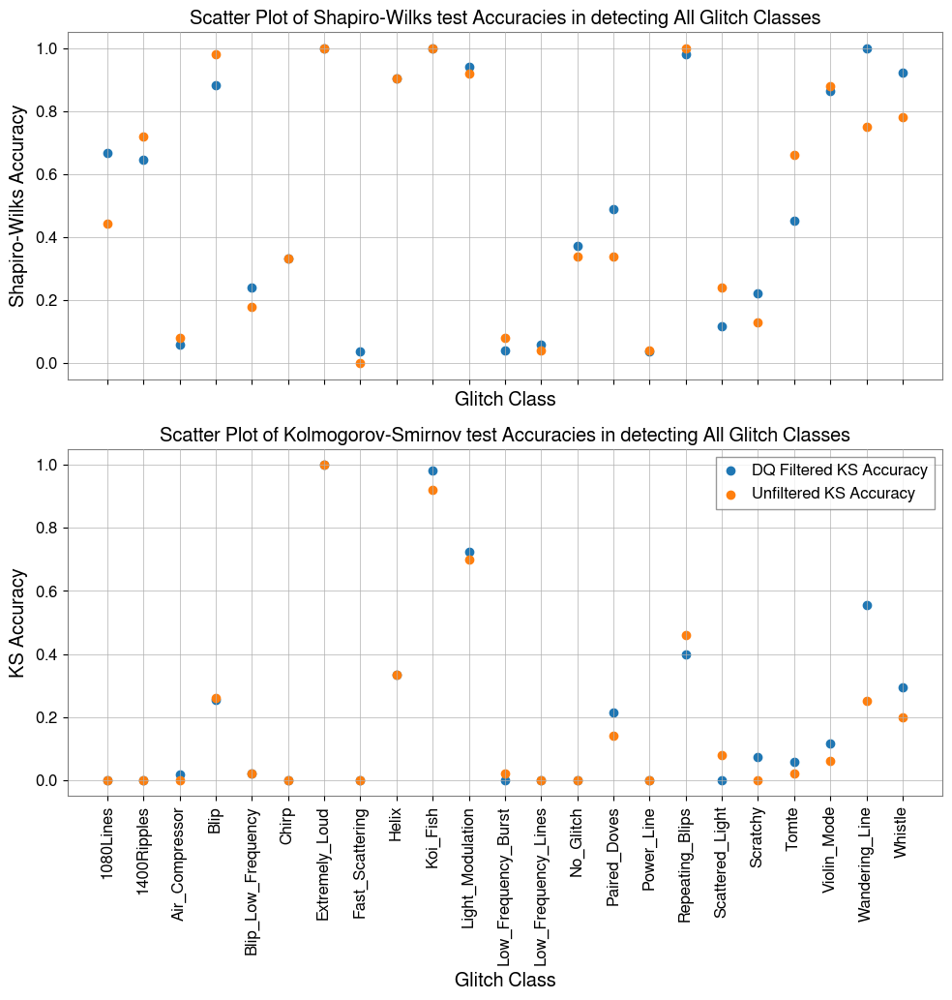

In [112]:
fig,ax = plt.subplots(2,1,figsize=(10, 9), sharex=True)
# for glitch_class in dq_sample_df['glitch_class'].unique():
#     class_data = dq_sample_df[dq_sample_df['glitch_class'] == glitch_class]
#     plt.scatter(class_data['glitch_class'], class_data['KS_accuracy'], label=glitch_class)

# Add labels and title
ax[0].scatter(dq_results["label"], dq_results["shapiro_accuracy"])
ax[0].scatter(results["label"], results["shapiro_accuracy"])
ax[0].set_xlabel('Glitch Class')
ax[0].set_ylabel('Shapiro-Wilks Accuracy')
ax[0].set_title('Scatter Plot of Shapiro-Wilks test Accuracies in detecting All Glitch Classes')

ax[1].scatter(dq_results["label"], dq_results["KS_accuracy"], label="DQ Filtered KS Accuracy")
ax[1].scatter(results["label"], results["KS_accuracy"], label="Unfiltered KS Accuracy")
ax[1].set_xlabel('Glitch Class')
ax[1].set_ylabel('KS Accuracy')
ax[1].set_title('Scatter Plot of Kolmogorov-Smirnov test Accuracies in detecting All Glitch Classes')
ax[1].legend()

plt.tight_layout()
plt.xticks(rotation=90)
plt.show()

# Studying our tests with clean data segments

Now that we have studied the given statistical tests on glitch data, I now have at hand a dataset of "clean segments" which contain examples of time intervals where no glitches were detected during the run.

In [113]:
clean_gpstimes = pd.read_csv("./clean_segments/pre_clean_segments_O3a_L1.csv", usecols=['start_time', 'end_time', 'p_values'])

In [114]:
clean_gpstimes.head()

,start_time,end_time,p_values
0,1238184014.93750,1238184024.00000,0.00000
1,1238176530.30420,1238176537.55859,1.00000
2,1238198056.74707,1238198066.20508,1.00000
3,1238198327.12940,1238198335.15204,0.00001
4,1238197723.62500,1238197731.61633,1.00000


In [115]:
clean_samples_df = statistical_testing.fetch_clean_segment_samples(clean_gpstimes.iloc[0:300], n_samples=1000)
# clean_samples_df["glitch_present"] = 0

Input Length:  300
Failed to load data for segment 1238432315.695312 - 1238432322.828125.
Cannot find a GWOSC dataset for L1 covering [1238432315, 1238432323)
Number of failed samples:  1
Number of whitened samples obtained:  1000


In [116]:
clean_samples_df.shape

(1000, 15)

In [117]:
clean_samples_df.head()

,y,t,shapiro_statistic,shapiro_pvalue,shapiro_prediction,ks_statistic,ks_pvalue,ks_prediction,ad_statistic,ad_critical_values,ad_significance_level,ad_prediction,kurtosis,skew,glitch_present
0,"[-3.142995708648623, -5.018972671936743, -4.51...","[1238367409.5878906 s, 1238367409.5881348 s, 1...",0.99945,0.29052,0,0.01929,0.43135,0,0.32562,"[0.575, 0.655, 0.786, 0.917, 1.091]","[15.0, 10.0, 5.0, 2.5, 1.0]",0,3.12967,-0.00757,0
1,"[-0.27427186138901904, -0.26011876909851267, -...","[1238416930.196045 s, 1238416930.196289 s, 123...",0.99957,0.52863,0,0.01685,0.60648,0,0.36644,"[0.575, 0.655, 0.786, 0.917, 1.091]","[15.0, 10.0, 5.0, 2.5, 1.0]",0,2.89997,0.02334,0
2,"[-1.9250609541057095, -3.534158120267897, -2.6...","[1238327577.5095215 s, 1238327577.5097656 s, 1...",0.99932,0.12565,0,0.01050,0.97772,0,0.48208,"[0.575, 0.655, 0.786, 0.917, 1.091]","[15.0, 10.0, 5.0, 2.5, 1.0]",0,3.14683,-0.05756,0
3,"[-1.5773786382341375, 0.30949234991629054, 0.7...","[1238243221.126709 s, 1238243221.1269531 s, 12...",0.99952,0.41451,0,0.01807,0.51586,0,0.33027,"[0.575, 0.655, 0.786, 0.917, 1.091]","[15.0, 10.0, 5.0, 2.5, 1.0]",0,2.87574,0.01643,0
4,"[0.8198875837599308, -1.2940582659422526, -0.5...","[1238315951.0080566 s, 1238315951.0083008 s, 1...",0.99964,0.70166,0,0.01660,0.62504,0,0.11425,"[0.575, 0.655, 0.786, 0.917, 1.091]","[15.0, 10.0, 5.0, 2.5, 1.0]",0,3.01760,-0.00587,0


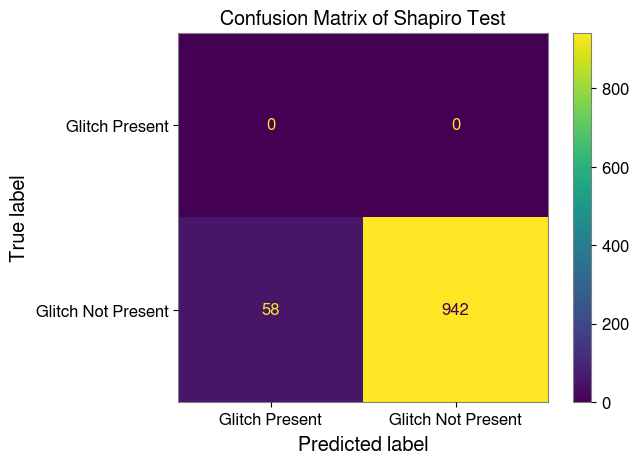

In [118]:
statistical_testing.display_confusion_matrix(clean_samples_df)

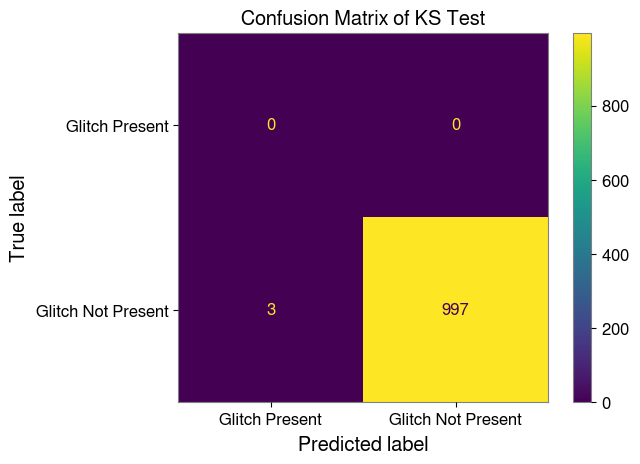

In [119]:
statistical_testing.display_confusion_matrix(clean_samples_df, "KS")

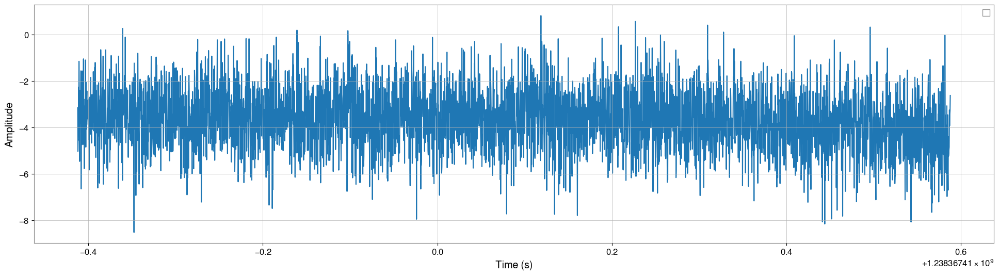

In [120]:
fig, ax = plt.subplots(figsize=(24, 6))
ax.plot(clean_samples_df.iloc[0]['t'], clean_samples_df.iloc[0]['y'])
ax.set_xlabel("Time (s)")
ax.set_ylabel("Amplitude")
ax.legend()

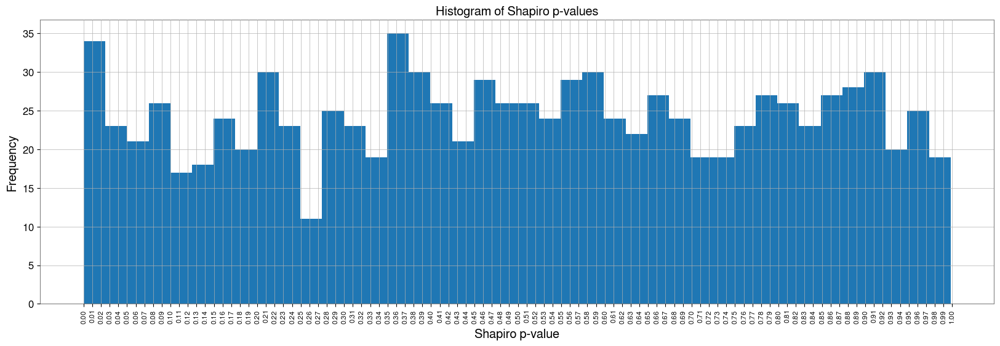

Number of Shapiro p-values above 0.05: 915
Maximum p-value: 0.9983428925348868
Minimum p-value: 9.56651529472836e-16


In [121]:
pvalues = clean_samples_df["shapiro_pvalue"]

# statistical_testing.display_statistic_pvalue_histogram(clean_samples_df["shapiro_pvalue"])

fig = plt.figure(figsize=(20, 6))

plt.hist(pvalues, bins=40)
plt.xlabel('Shapiro p-value')
plt.ylabel('Frequency')
plt.xticks(list(np.arange(min(pvalues), max(pvalues)+0.01, 0.01)), fontsize=8, rotation=90)
plt.title(f'Histogram of Shapiro p-values')
plt.grid(True)
plt.show()

print(f"Number of Shapiro p-values above 0.05: {(np.array(pvalues) > 0.05).sum()}")
print(f"Maximum p-value: {max(pvalues)}")
print(f"Minimum p-value: {min(pvalues)}")

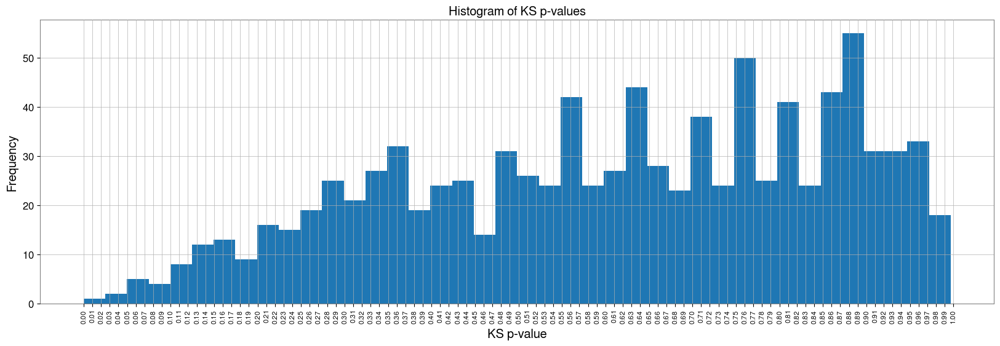

Number of KS p-values above 0.05: 970
Maximum p-value: 0.9971523804261258
Minimum p-value: 0.00017903708076264513


In [122]:
pvalues = clean_samples_df["ks_pvalue"]

fig = plt.figure(figsize=(20, 6))

plt.hist(pvalues, bins=40)
plt.xlabel('KS p-value')
plt.ylabel('Frequency')
plt.xticks(list(np.arange(min(pvalues), max(pvalues)+0.01, 0.01)), fontsize=8, rotation=90)
plt.title(f'Histogram of KS p-values')
plt.grid(True)
plt.show()

print(f"Number of KS p-values above 0.05: {(np.array(pvalues) > 0.05).sum()}")
print(f"Maximum p-value: {max(pvalues)}")
print(f"Minimum p-value: {min(pvalues)}")

# Testing our normality tests on a combined dataset of glitches and clean data

In this case we have a rather unique challenge where the data at hand is fairly unbalanced, with variations in the number of glitches and clean samples. Hence, for this case I'll take around 1000 samples of each to see how things go.

Our data with glitches has a lot more information to work with such as snr, duration and confidence, which we will not be taking into consideration for now since we want to look at what is common betwen clean and glitches samples.

Additionally our glitches are marked by particular GPS times around which we need to consider a time window to whiten and crop the sample into workable segments for our statistical tests. Our clean data is in the form of time segments of relative "silence" which we will have to process as is and divide into equally sized segments as our glitch data. 

## Loading the data

Let's generate this dataset below

In [4]:
glitch_count_df = glitches["label"].value_counts().rename_axis('Glitch Class').reset_index(name='Count')
glitch_count_df.to_latex("./outputs/glitch_counts.tex", index=False, float_format="%.0f", escape=False)

In [5]:
selection = glitches[(glitches['label'] == 'Tomte')]
samples = statistical_testing.fetch_glitch_data_from_csv(selection, begin=0, n_samples=10)

Time elapsed for q-transform: 0.51 seconds


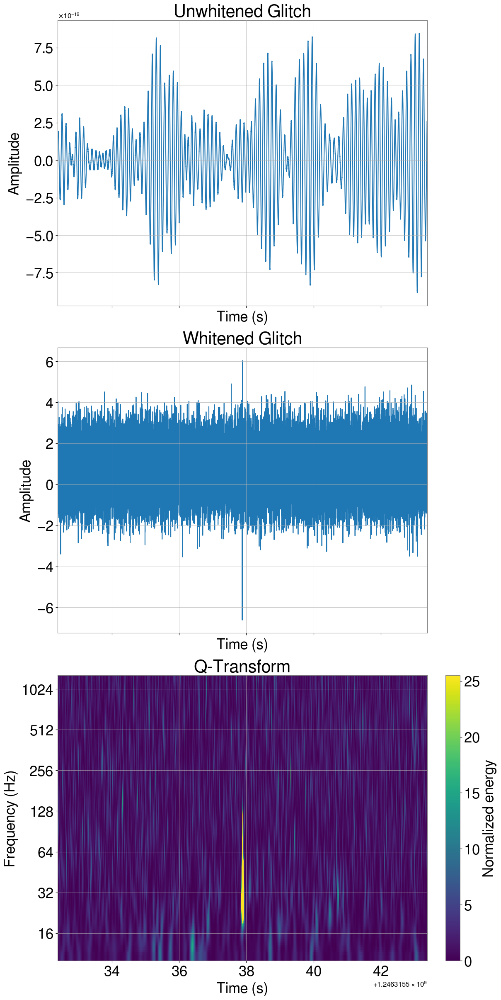

In [6]:
statistical_testing.display_sample_plots(samples.iloc[9], "./outputs/sample_plot.pdf")

In [7]:
samples.columns

Index(['GPStime', 'snr', 'duration', 'confidence', 'ifo', 'label',
       'unwhitened_y', 'whitened_y', 't', 'timeseries_file_location',
       'shapiro_statistic', 'shapiro_pvalue', 'ks_statistic', 'ks_pvalue',
       'ad_statistic', 'ad_critical_values', 'ad_significance_level',
       'kurtosis', 'skew', 'glitch_present'],
      dtype='object')

In [8]:
sample_timeseries = TimeSeries.read(samples["timeseries_file_location"].iloc[0])

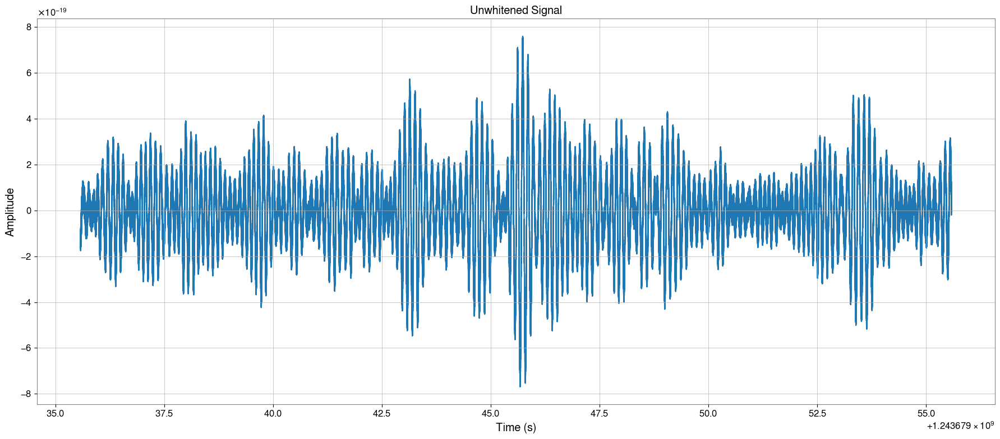

In [9]:
# plot the unwhitened y values for the first chirp
fig = plt.figure(figsize=(18, 8))
plt.plot(sample_timeseries.times, sample_timeseries.value)
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.title("Unwhitened Signal")
plt.tight_layout()
plt.savefig("./outputs/unwhitened_signal.pdf", dpi=100)

In [10]:
#whiten the timeseries
sample_timeseries_whitened = sample_timeseries.whiten(4,2)

In [11]:
sample_timeseries_whitened = sample_timeseries_whitened[int(4096*4):-int(4096*4)]

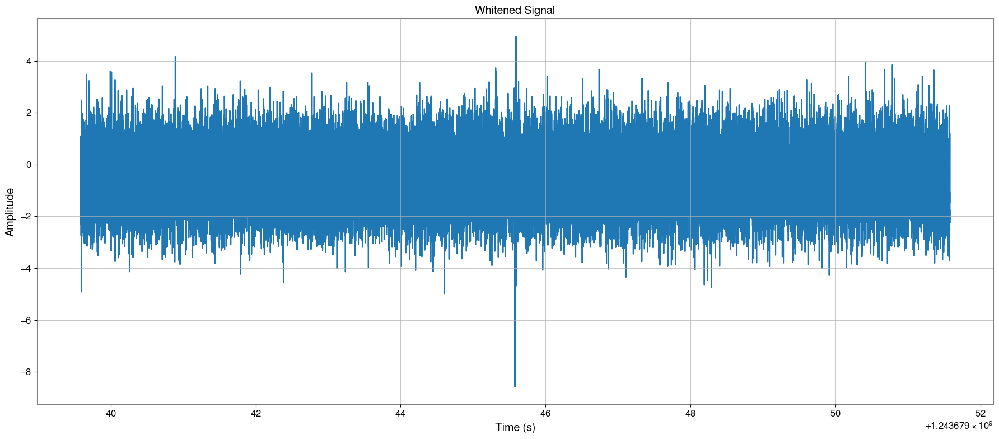

In [12]:
plt.figure(figsize=(18, 8))
plt.plot(sample_timeseries_whitened.times, sample_timeseries_whitened.value)
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.title("Whitened Signal")
plt.tight_layout()
plt.savefig("./outputs/whitened_signal.pdf", dpi=100)

In [13]:
sample_asd = sample_timeseries.asd(4, 2)

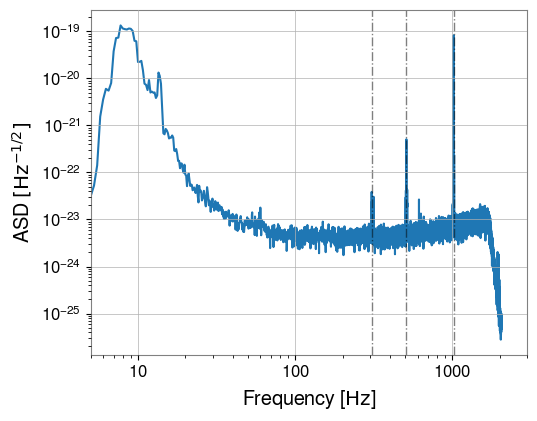

In [14]:
plot = sample_asd.plot()
ax = plot.gca()
ax.set_xlim(5, 3000)
# ax.set_ylim(5e-26, 1e-21)

#plot dotted lines at 512 Hz and 1024Hz
ax.axvline(x=310, color='black', linestyle='-.', linewidth=1, alpha=0.5)
ax.axvline(x=510, color='black', linestyle='-.', linewidth=1, alpha=0.5)
ax.axvline(x=1020, color='black', linestyle='-.', linewidth=1, alpha=0.5)
ax.set_ylabel("ASD $[\mathrm{Hz}^{-1/2}]$")

plot.savefig("./outputs/unwhitened_asd.pdf", dpi=100)

In [15]:
labels = ['1080Lines', '1400Ripples', 'Air_Compressor', 'Blip',
       'Blip_Low_Frequency', 'Chirp', 'Extremely_Loud',
       'Fast_Scattering', 'Helix', 'Koi_Fish',
       'Light_Modulation', 'Low_Frequency_Burst',
       'Low_Frequency_Lines', 'Paired_Doves',
       'Power_Line', 'Repeating_Blips', 'Scattered_Light',
       'Scratchy', 'Tomte', 'Violin_Mode', 'Wandering_Line',
       'Whistle', 'clean_signal']

columns = [
    'label', "shapiro_TP", "shapiro_FN",
    "shapiro_FP", "shapiro_TN", "shapiro_accuracy", "shapiro_recall", "shapiro_fpr",
    "shapiro_precision", "shapiro_f1_score", "KS_TP",
    "KS_FN", "KS_FP", "KS_TN",
    "KS_accuracy", "KS_recall", "KS_fpr", "KS_precision",
    "KS_f1_score", "AD_TP", "AD_FN", "AD_FP", "AD_TN",
    "AD_accuracy", "AD_recall", "AD_fpr", "AD_precision", "AD_f1_score"]


def generate_glitchwise_confusion_matrices(df):

    scaler = StandardScaler()

    confusion_matrix_df = pd.DataFrame(columns=columns)
    for label in labels:
        temp_df = df[df['label'] == label]

        # print(f"Loading {label} data...")

        # temp_df = statistical_testing.fetch_glitch_data_from_csv(temp_df, tw=10, bandpass=bandpass, low_freq=low_feq, high_freq=high_freq)
        # temp_df.dropna(inplace=True)

        # print(f"Generating confusion matrix for {label}...")
        shapiro_cm = statistical_testing.generate_confusion_matrix(temp_df)
        ks_cm = statistical_testing.generate_confusion_matrix(temp_df, "KS")
        ad_cm = statistical_testing.generate_confusion_matrix(temp_df, "Anderson")

        shapiro_metrics = list(statistical_testing.generate_evaluation_metrics(shapiro_cm))
        ks_metrics = list(statistical_testing.generate_evaluation_metrics(ks_cm))
        ad_metrics = list(statistical_testing.generate_evaluation_metrics(ad_cm))

        shapiro_cm = shapiro_cm.flatten()
        ks_cm = ks_cm.flatten()
        ad_cm = ad_cm.flatten()

        confusion_matrix_df = pd.concat([confusion_matrix_df, pd.DataFrame([[label] + shapiro_cm.tolist() + shapiro_metrics + ks_cm.tolist() + ks_metrics + ad_cm.tolist() + ad_metrics], columns=columns)], ignore_index=True)

    return confusion_matrix_df
    

In [16]:
def generate_testwise_confusion_matrix(df):

    confusion_matrix_df = pd.DataFrame(columns=["Test","TP","FN","FP","TN","Accuracy","Recall(TPR/Sensitivity)", "FPR","Precision","F1 Score"])
    for test in ["Shapiro", "KS", "Anderson"]:
        # print(f"Generating confusion matrix for {test}...")
        cm = statistical_testing.generate_confusion_matrix(df, test)
        metrics = list(statistical_testing.generate_evaluation_metrics(cm))
        cm = cm.flatten()
        confusion_matrix_df = pd.concat([confusion_matrix_df, pd.DataFrame([[test] + cm.tolist() + metrics], columns=confusion_matrix_df.columns)], ignore_index=True)
    
    return confusion_matrix_df

In [17]:
# Loading up the clean segments
clean_gpstimes = pd.read_csv("./clean_segments/pre_clean_segments_O3a_L1.csv", usecols=['start_time', 'end_time', 'p_values'])

# Loading up the glitch data times and randomly sampling 51 glitches from each label
sample_glitches = pd.read_csv('./glitches/DQ_glitches_O3a.csv', usecols=['GPStime', 'ifo', 'label'])
# Excluide 'no_glitch' label
sample_glitches = sample_glitches[sample_glitches['label'] != 'No_Glitch']
sample_glitches = sample_glitches[~sample_glitches.duplicated(subset=['GPStime'], keep='first')]


if not os.path.isfile("./glitches/random_samples.csv"):
    sample_glitches_df = sample_glitches[sample_glitches['ifo'] == 'L1'].groupby('label').apply(lambda x: x.sample(n=min(len(x),101))).reset_index(drop=True)
    sample_glitches_df.to_csv("./glitches/random_samples.csv", index=False)
else:
    sample_glitches_df = pd.read_csv("./glitches/random_samples.csv", index_col=False)

In [18]:
def create_combined_glitch_clean_df(clean_gpstimes, sample_glitches_df, n_samples=1000, bandpass=False, low_freq=10, high_freq=250):
    clean_samples_df = statistical_testing.fetch_clean_segment_samples(clean_gpstimes, n_samples=n_samples, bandpass=bandpass, low_freq=low_freq, high_freq=high_freq)
    sample_glitches_df = statistical_testing.fetch_glitch_data_from_csv(sample_glitches_df, tw=10, bandpass=bandpass, low_freq=low_freq, high_freq=high_freq)

    print(clean_samples_df.columns)
    print(sample_glitches_df.columns)
    # , 'shapiro_prediction', 'ks_prediction', 'ad_prediction'
    sample_glitches_df = sample_glitches_df[['whitened_y', 'unwhitened_y', 't', "timeseries_file_location", 'shapiro_statistic', 'shapiro_pvalue',
	    'ks_statistic', 'ks_pvalue', 'ad_statistic',
	    'ad_critical_values', 'ad_significance_level', 'kurtosis', 'skew',
	    'ifo', 'label', 'glitch_present']]

    sample_glitches_df = sample_glitches_df.dropna()
    clean_samples_df = clean_samples_df.dropna()

    # Combining the clean and glitch data
    combined_df = pd.concat([clean_samples_df, sample_glitches_df], ignore_index=True)
    
    return combined_df

In [19]:
combined_df = create_combined_glitch_clean_df(clean_gpstimes[0:700], sample_glitches_df, n_samples=2000)

Input Length:  700
Index(['whitened_y', 't', 'timeseries_file_location', 'unwhitened_y',
       'shapiro_statistic', 'shapiro_pvalue', 'ks_statistic', 'ks_pvalue',
       'ad_statistic', 'ad_critical_values', 'ad_significance_level',
       'kurtosis', 'skew', 'ifo', 'label', 'glitch_present'],
      dtype='object')
Index(['GPStime', 'ifo', 'label', 'unwhitened_y', 'whitened_y', 't',
       'timeseries_file_location', 'shapiro_statistic', 'shapiro_pvalue',
       'ks_statistic', 'ks_pvalue', 'ad_statistic', 'ad_critical_values',
       'ad_significance_level', 'kurtosis', 'skew', 'glitch_present'],
      dtype='object')


In [20]:
combined_df[combined_df.isna().any(axis=1)].head()

,whitened_y,t,timeseries_file_location,unwhitened_y,shapiro_statistic,shapiro_pvalue,ks_statistic,ks_pvalue,ad_statistic,ad_critical_values,ad_significance_level,kurtosis,skew,ifo,label,glitch_present


In [21]:
len(combined_df)

3597

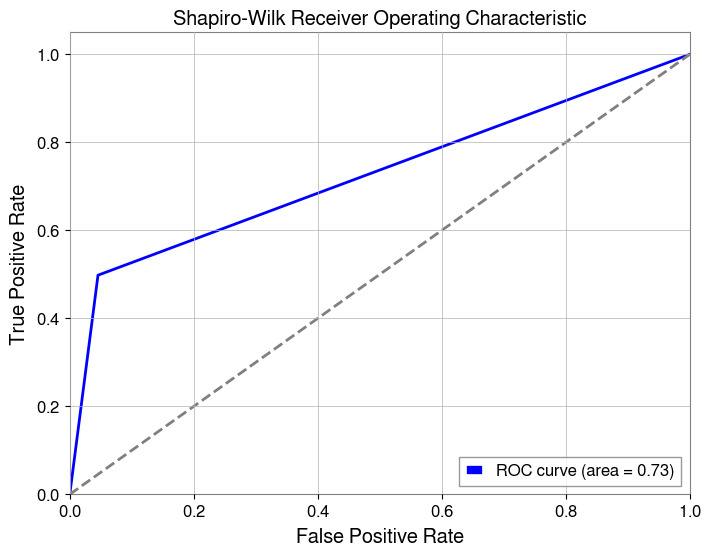

In [22]:
# # Now we can generate the ROC curve
# y_true = combined_df['glitch_present']
# y_scores = combined_df['shapiro_pvalue']
# fpr, tpr, thresholds = roc_curve(y_true, y_scores)
# roc_auc = auc(fpr, tpr)

# # plotting the ROC curve
# # This code was AI geenrated
# plt.figure(figsize=(8, 6))
# plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
# plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
# plt.xlim([0.0, 1.0])
# plt.ylim([0.0, 1.05])
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
# plt.title('Shapiro-Wilks Receiver Operating Characteristic')
# plt.legend(loc="lower right")
# plt.show()

# statistical_testing.display_auc_roc(combined_df['glitch_present'], combined_df['shapiro_pvalue'], thresholds=list(np.arange(0.01,1.01,0.02)))
statistical_testing.display_auc_roc(combined_df['glitch_present'], combined_df['shapiro_pvalue'])

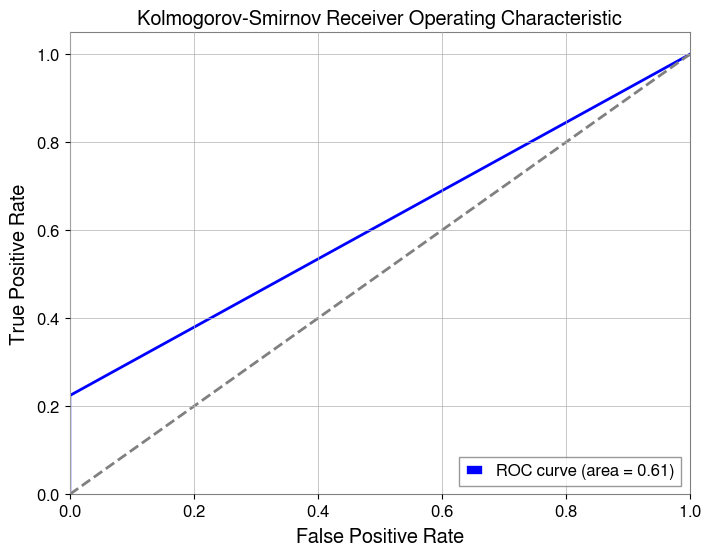

In [23]:
# Now we can generate the ROC curve
# y_true = combined_df['glitch_present']
# y_scores = combined_df['ks_prediction']
# fpr, tpr, thresholds = roc_curve(y_true, y_scores)
# roc_auc = auc(fpr, tpr)

# # plotting the ROC curve
# # This code was AI geenrated
# plt.figure(figsize=(8, 6))
# plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
# plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
# plt.xlim([0.0, 1.0])
# plt.ylim([0.0, 1.05])
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
# plt.title('Kolmogorov-Smirnov Receiver Operating Characteristic')
# plt.legend(loc="lower right")
# plt.show()

# statistical_testing.display_auc_roc(combined_df['glitch_present'], combined_df['ks_pvalue'], "KS", thresholds=list(np.arange(0.01,1.01,0.02)))
statistical_testing.display_auc_roc(combined_df['glitch_present'], combined_df['ks_pvalue'], "KS")

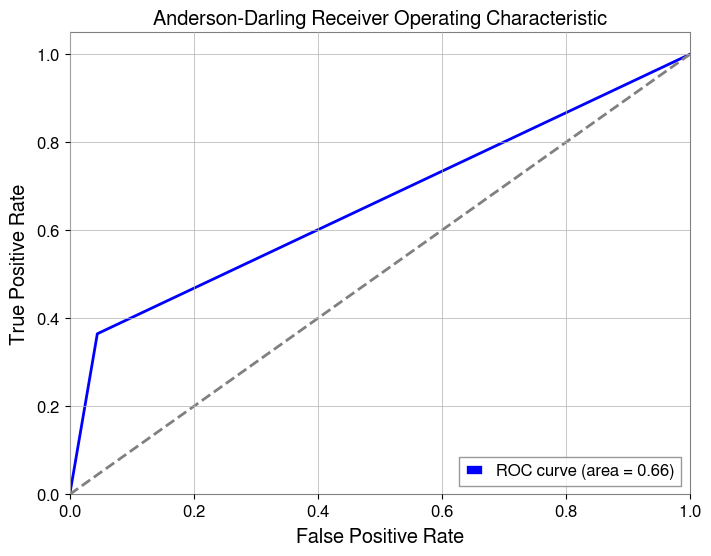

In [24]:
# statistical_testing.display_auc_roc(combined_df['glitch_present'], combined_df[['ad_statistic','ad_critical_values']], "Anderson", thresholds=combined_df.iloc[0]['ad_critical_values'])
statistical_testing.display_auc_roc(combined_df['glitch_present'], combined_df[['ad_statistic','ad_critical_values']], "Anderson")

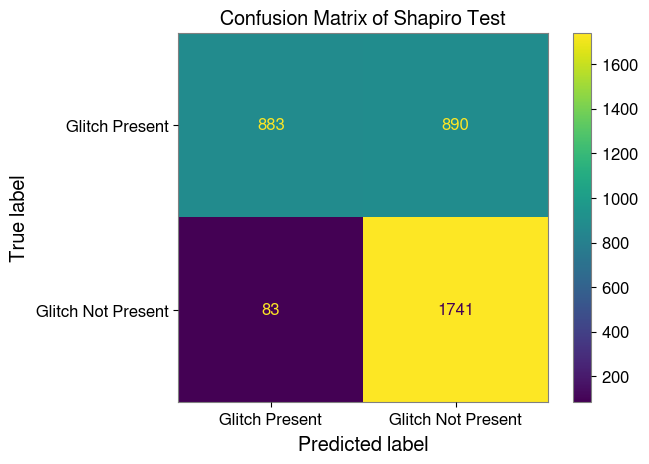

In [25]:
statistical_testing.display_confusion_matrix(combined_df)

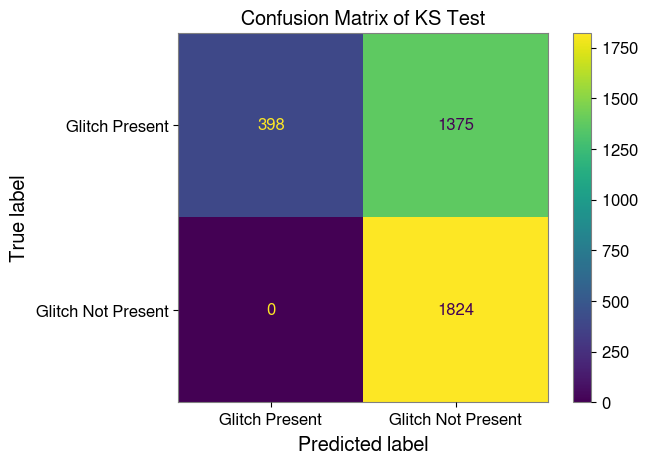

In [26]:
statistical_testing.display_confusion_matrix(combined_df, "KS")

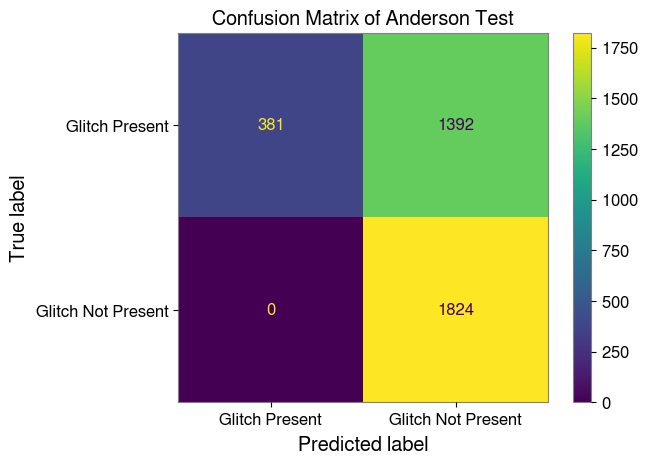

In [27]:
statistical_testing.display_confusion_matrix(combined_df, "Anderson")

also want to look at the results when a band-pass filter is applied to the Scattered Light glitches

In [29]:
# # Loading up the clean segments
# bp_clean_gpstimes = pd.read_csv("./clean_segments/pre_clean_segments_O3a_L1.csv", usecols=['start_time', 'end_time', 'p_values'])
# # bp_clean_gpstimes = bp_clean_gpstimes[bp_clean_gpstimes['p_values'] >= 0.05]

# bp_clean_samples_df = statistical_testing.fetch_clean_segment_samples(bp_clean_gpstimes.iloc[0:300], n_samples=1000, bandpass=True, low_freq=10, high_freq=1000)
# bp_clean_samples_df["ifo"] = "L1"
# bp_clean_samples_df["label"] = "clean_signal"

# # Loading up the glitch data 
# bp_sample_glitches = pd.read_csv('./glitches/DQ_glitches_O3a.csv', usecols=['GPStime', 'ifo', 'label'])
# bp_sample_glitches = bp_sample_glitches[~bp_sample_glitches.duplicated(subset=['GPStime'], keep='first')]

# if not os.path.isfile("./glitches/random_samples.csv"):
#     bp_sample_glitches_df = bp_sample_glitches[bp_sample_glitches['ifo'] == 'L1'].groupby('label').apply(lambda x: x.sample(n=min(len(x),51))).reset_index(drop=True)
#     bp_sample_glitches_df.to_csv("./glitches/random_samples.csv", index=False)
# else:
#     bp_sample_glitches_df = pd.read_csv("./glitches/random_samples.csv", index_col=False)

# bp_sample_glitches_df = statistical_testing.fetch_glitch_data_from_csv(bp_sample_glitches_df, tw=10, bandpass=True, low_freq=10, high_freq=1000)

# bp_sample_glitches_df = bp_sample_glitches_df.rename(columns={"whitened_y": "y", "whitened_t": "t"})

# bp_sample_glitches_df = bp_sample_glitches_df[['y', 't', "timeseries_file_location", 'shapiro_statistic', 'shapiro_pvalue',
#        'ks_statistic', 'ks_pvalue', 'ad_statistic',
#        'ad_critical_values', 'ad_significance_level', 'kurtosis', 'skew',
#        'ifo', 'label', 'glitch_present']]

# bp_sample_glitches_df = bp_sample_glitches_df.dropna()

# # Combining the clean and glitch data
# bp_combined_df = pd.concat([bp_clean_samples_df, bp_sample_glitches_df], ignore_index=True)

In [23]:
bp_combined_df = create_combined_glitch_clean_df(clean_gpstimes[0:700], sample_glitches_df, n_samples=2000, bandpass=True, low_freq=10, high_freq=1000)

Input Length:  700
Index(['whitened_y', 't', 'timeseries_file_location', 'unwhitened_y',
       'shapiro_statistic', 'shapiro_pvalue', 'ks_statistic', 'ks_pvalue',
       'ad_statistic', 'ad_critical_values', 'ad_significance_level',
       'kurtosis', 'skew', 'ifo', 'label', 'glitch_present'],
      dtype='object')
Index(['GPStime', 'ifo', 'label', 'unwhitened_y', 'whitened_y', 't',
       'timeseries_file_location', 'shapiro_statistic', 'shapiro_pvalue',
       'ks_statistic', 'ks_pvalue', 'ad_statistic', 'ad_critical_values',
       'ad_significance_level', 'kurtosis', 'skew', 'glitch_present'],
      dtype='object')


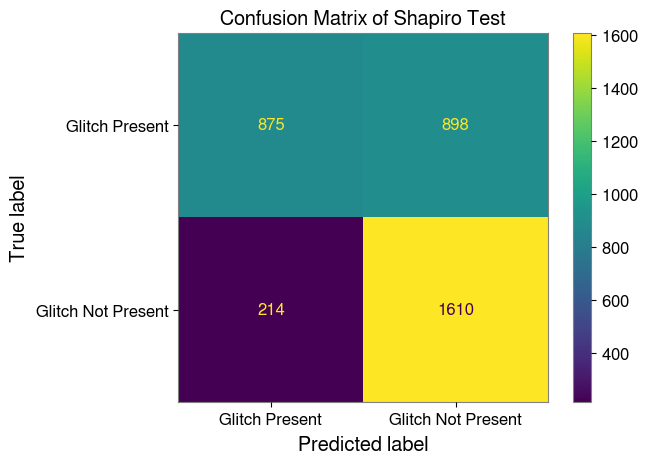

In [31]:
statistical_testing.display_confusion_matrix(bp_combined_df)

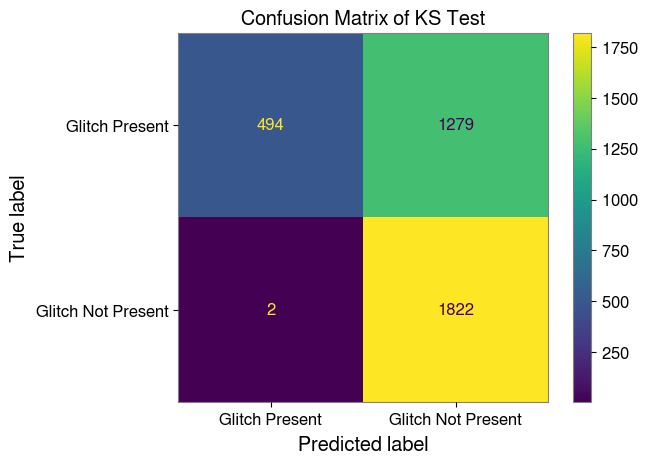

In [32]:
statistical_testing.display_confusion_matrix(bp_combined_df, "KS")

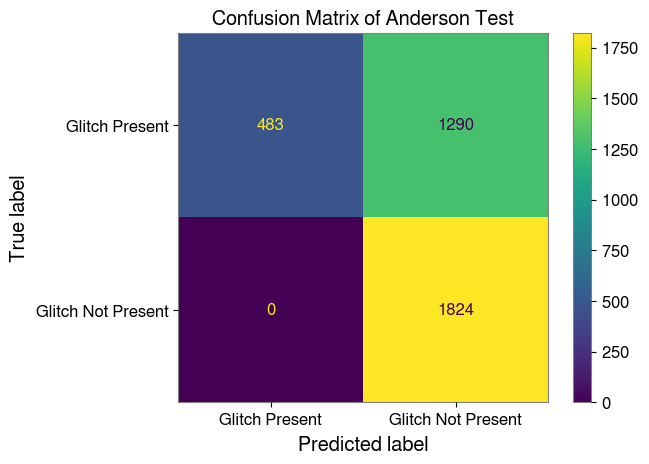

In [33]:
statistical_testing.display_confusion_matrix(bp_combined_df, "Anderson")

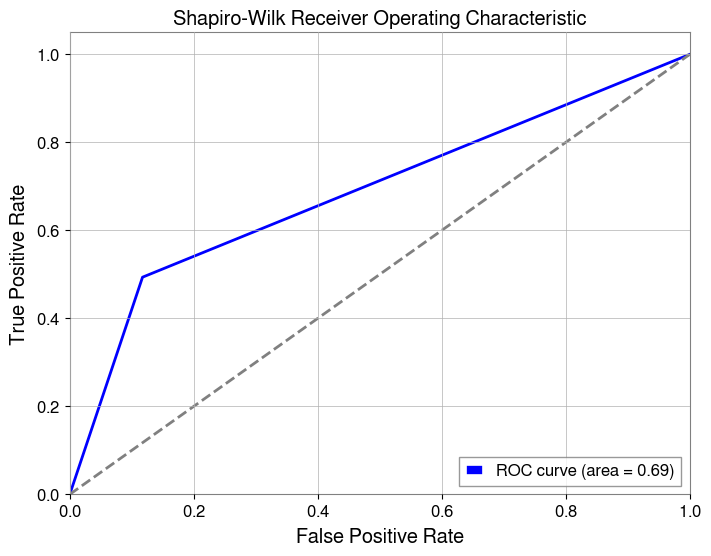

In [34]:
# statistical_testing.display_auc_roc(bp_combined_df['glitch_present'], bp_combined_df['shapiro_pvalue'], thresholds=list(np.arange(0.01,1.01,0.02)))
statistical_testing.display_auc_roc(bp_combined_df['glitch_present'], bp_combined_df['shapiro_pvalue'])

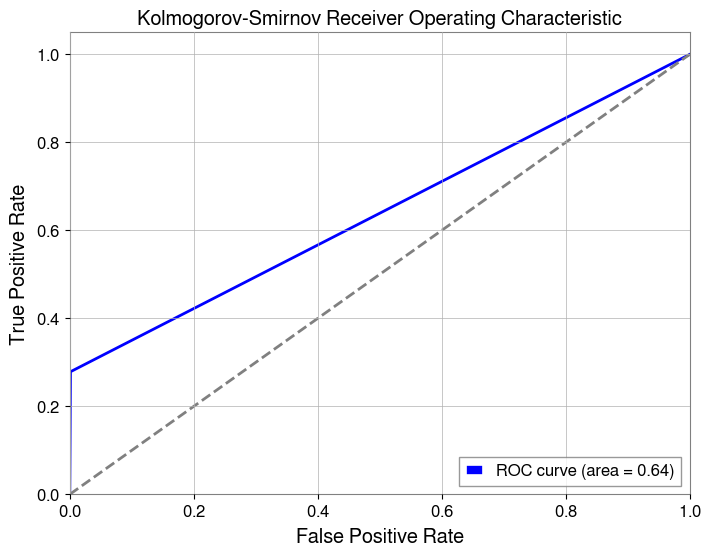

In [35]:
# statistical_testing.display_auc_roc(bp_combined_df['glitch_present'], bp_combined_df['ks_pvalue'], "KS", thresholds=list(np.arange(0.01,1.01,0.02)))
statistical_testing.display_auc_roc(bp_combined_df['glitch_present'], bp_combined_df['ks_pvalue'], "KS")

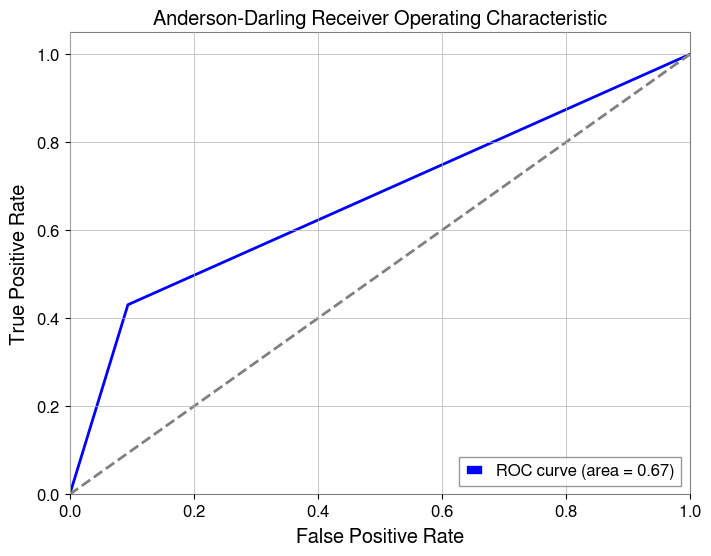

In [36]:
# statistical_testing.display_auc_roc(bp_combined_df['glitch_present'], bp_combined_df[['ad_statistic','ad_critical_values']], "Anderson", thresholds=bp_combined_df.iloc[0]['ad_critical_values'])
statistical_testing.display_auc_roc(bp_combined_df['glitch_present'], bp_combined_df[['ad_statistic','ad_critical_values']], "Anderson")

In [37]:
# subset_combined_df = combined_df[combined_df['ifo'] == 'L1'].groupby('label').apply(lambda x: x.sample(n=min(len(x),51))).reset_index(drop=True)
generate_glitchwise_confusion_matrices(combined_df)

,label,shapiro_TP,shapiro_FN,shapiro_FP,shapiro_TN,shapiro_accuracy,shapiro_recall,shapiro_fpr,shapiro_precision,shapiro_f1_score,KS_TP,KS_FN,KS_FP,KS_TN,KS_accuracy,KS_recall,KS_fpr,KS_precision,KS_f1_score,AD_TP,AD_FN,AD_FP,AD_TN,AD_accuracy,AD_recall,AD_fpr,AD_precision,AD_f1_score
0,1080Lines,1,5,0,0,0.16667,0.16667,0,1.00000,0.28571,0,6,0,0,0.00000,0.00000,0,0,0,0,6,0,0,0.00000,0.00000,0,0,0
1,1400Ripples,51,50,0,0,0.50495,0.50495,0,1.00000,0.67105,2,99,0,0,0.01980,0.01980,0,1.00000,0.03883,2,99,0,0,0.01980,0.01980,0,1.00000,0.03883
2,Air_Compressor,6,95,0,0,0.05941,0.05941,0,1.00000,0.11215,3,98,0,0,0.02970,0.02970,0,1.00000,0.05769,2,99,0,0,0.01980,0.01980,0,1.00000,0.03883
3,Blip,93,7,0,0,0.93000,0.93000,0,1.00000,0.96373,15,85,0,0,0.15000,0.15000,0,1.00000,0.26087,12,88,0,0,0.12000,0.12000,0,1.00000,0.21429
4,Blip_Low_Frequency,18,83,0,0,0.17822,0.17822,0,1.00000,0.30252,1,100,0,0,0.00990,0.00990,0,1.00000,0.01961,1,100,0,0,0.00990,0.00990,0,1.00000,0.01961
5,Chirp,0,6,0,0,0.00000,0.00000,0,0.00000,0.00000,0,6,0,0,0.00000,0.00000,0,0,0,0,6,0,0,0.00000,0.00000,0,0,0
6,Extremely_Loud,100,0,0,0,1.00000,1.00000,0,1.00000,1.00000,100,0,0,0,1.00000,1.00000,0,1.00000,1.00000,100,0,0,0,1.00000,1.00000,0,1.00000,1.00000
7,Fast_Scattering,5,96,0,0,0.04950,0.04950,0,1.00000,0.09434,2,99,0,0,0.01980,0.01980,0,1.00000,0.03883,1,100,0,0,0.00990,0.00990,0,1.00000,0.01961
8,Helix,21,0,0,0,1.00000,1.00000,0,1.00000,1.00000,14,7,0,0,0.66667,0.66667,0,1.00000,0.80000,12,9,0,0,0.57143,0.57143,0,1.00000,0.72727
9,Koi_Fish,100,1,0,0,0.99010,0.99010,0,1.00000,0.99502,93,8,0,0,0.92079,0.92079,0,1.00000,0.95876,93,8,0,0,0.92079,0.92079,0,1.00000,0.95876


In [38]:
generate_glitchwise_confusion_matrices(bp_combined_df)

,label,shapiro_TP,shapiro_FN,shapiro_FP,shapiro_TN,shapiro_accuracy,shapiro_recall,shapiro_fpr,shapiro_precision,shapiro_f1_score,KS_TP,KS_FN,KS_FP,KS_TN,KS_accuracy,KS_recall,KS_fpr,KS_precision,KS_f1_score,AD_TP,AD_FN,AD_FP,AD_TN,AD_accuracy,AD_recall,AD_fpr,AD_precision,AD_f1_score
0,1080Lines,0,6,0,0,0.00000,0.00000,0,0,0,0,6,0,0,0.00000,0.00000,0,0,0,0,6,0,0,0.00000,0.00000,0,0,0
1,1400Ripples,7,94,0,0,0.06931,0.06931,0,1.00000,0.12963,2,99,0,0,0.01980,0.01980,0,1.00000,0.03883,2,99,0,0,0.01980,0.01980,0,1.00000,0.03883
2,Air_Compressor,11,90,0,0,0.10891,0.10891,0,1.00000,0.19643,1,100,0,0,0.00990,0.00990,0,1.00000,0.01961,1,100,0,0,0.00990,0.00990,0,1.00000,0.01961
3,Blip,99,1,0,0,0.99000,0.99000,0,1.00000,0.99497,29,71,0,0,0.29000,0.29000,0,1.00000,0.44961,30,70,0,0,0.30000,0.30000,0,1.00000,0.46154
4,Blip_Low_Frequency,24,77,0,0,0.23762,0.23762,0,1.00000,0.38400,1,100,0,0,0.00990,0.00990,0,1.00000,0.01961,1,100,0,0,0.00990,0.00990,0,1.00000,0.01961
5,Chirp,2,4,0,0,0.33333,0.33333,0,1.00000,0.50000,0,6,0,0,0.00000,0.00000,0,0,0,0,6,0,0,0.00000,0.00000,0,0,0
6,Extremely_Loud,100,0,0,0,1.00000,1.00000,0,1.00000,1.00000,100,0,0,0,1.00000,1.00000,0,1.00000,1.00000,100,0,0,0,1.00000,1.00000,0,1.00000,1.00000
7,Fast_Scattering,7,94,0,0,0.06931,0.06931,0,1.00000,0.12963,2,99,0,0,0.01980,0.01980,0,1.00000,0.03883,2,99,0,0,0.01980,0.01980,0,1.00000,0.03883
8,Helix,21,0,0,0,1.00000,1.00000,0,1.00000,1.00000,21,0,0,0,1.00000,1.00000,0,1.00000,1.00000,21,0,0,0,1.00000,1.00000,0,1.00000,1.00000
9,Koi_Fish,101,0,0,0,1.00000,1.00000,0,1.00000,1.00000,97,4,0,0,0.96040,0.96040,0,1.00000,0.97980,97,4,0,0,0.96040,0.96040,0,1.00000,0.97980


In [39]:
generate_testwise_confusion_matrix(combined_df)

,Test,TP,FN,FP,TN,Accuracy,Recall(TPR/Sensitivity),FPR,Precision,F1 Score
0,Shapiro,883,890,83,1741,0.72950,0.49803,0.04550,0.91408,0.64476
1,KS,398,1375,0,1824,0.61774,0.22448,0.00000,1.00000,0.36665
2,Anderson,381,1392,0,1824,0.61301,0.21489,0.00000,1.00000,0.35376


In [40]:
generate_testwise_confusion_matrix(bp_combined_df)

,Test,TP,FN,FP,TN,Accuracy,Recall(TPR/Sensitivity),FPR,Precision,F1 Score
0,Shapiro,875,898,214,1610,0.69085,0.49351,0.11732,0.80349,0.61146
1,KS,494,1279,2,1822,0.64387,0.27862,0.00110,0.99597,0.43543
2,Anderson,483,1290,0,1824,0.64137,0.27242,0.00000,1.00000,0.42819


In [41]:
frequency_ranges=[[10, 100], [10, 250], [10, 500], [10, 1000], [250,1000], [500,1000]]

combined_df = create_combined_glitch_clean_df(clean_gpstimes[0:700], sample_glitches_df, n_samples=2000)
display(generate_testwise_confusion_matrix(combined_df))
for low_freq, high_freq in frequency_ranges:
    print(f"Low Frequency: {low_freq}, High Frequency: {high_freq}")
    combined_df = create_combined_glitch_clean_df(clean_gpstimes[0:700], sample_glitches_df, n_samples=2000, bandpass=True, low_freq=low_freq, high_freq=high_freq)
    display(generate_testwise_confusion_matrix(combined_df))
    # statistical_testing.display_auc_roc(combined_df['glitch_present'], combined_df['shapiro_pvalue'])
    # statistical_testing.display_auc_roc(combined_df['glitch_present'], combined_df['ks_pvalue'], "KS")
    # statistical_testing.display_auc_roc(combined_df['glitch_present'], combined_df[['ad_statistic','ad_critical_values']], "Anderson")

Input Length:  700
Index(['whitened_y', 't', 'timeseries_file_location', 'unwhitened_y',
       'shapiro_statistic', 'shapiro_pvalue', 'ks_statistic', 'ks_pvalue',
       'ad_statistic', 'ad_critical_values', 'ad_significance_level',
       'kurtosis', 'skew', 'ifo', 'label', 'glitch_present'],
      dtype='object')
Index(['GPStime', 'ifo', 'label', 'unwhitened_y', 'whitened_y', 't',
       'timeseries_file_location', 'shapiro_statistic', 'shapiro_pvalue',
       'ks_statistic', 'ks_pvalue', 'ad_statistic', 'ad_critical_values',
       'ad_significance_level', 'kurtosis', 'skew', 'glitch_present'],
      dtype='object')


,Test,TP,FN,FP,TN,Accuracy,Recall(TPR/Sensitivity),FPR,Precision,F1 Score
0,Shapiro,883,890,83,1741,0.72950,0.49803,0.04550,0.91408,0.64476
1,KS,398,1375,0,1824,0.61774,0.22448,0.00000,1.00000,0.36665
2,Anderson,381,1392,0,1824,0.61301,0.21489,0.00000,1.00000,0.35376


Low Frequency: 10, High Frequency: 100
Input Length:  700
Index(['whitened_y', 't', 'timeseries_file_location', 'unwhitened_y',
       'shapiro_statistic', 'shapiro_pvalue', 'ks_statistic', 'ks_pvalue',
       'ad_statistic', 'ad_critical_values', 'ad_significance_level',
       'kurtosis', 'skew', 'ifo', 'label', 'glitch_present'],
      dtype='object')
Index(['GPStime', 'ifo', 'label', 'unwhitened_y', 'whitened_y', 't',
       'timeseries_file_location', 'shapiro_statistic', 'shapiro_pvalue',
       'ks_statistic', 'ks_pvalue', 'ad_statistic', 'ad_critical_values',
       'ad_significance_level', 'kurtosis', 'skew', 'glitch_present'],
      dtype='object')


,Test,TP,FN,FP,TN,Accuracy,Recall(TPR/Sensitivity),FPR,Precision,F1 Score
0,Shapiro,1772,1,1818,6,0.49430,0.99944,0.99671,0.49359,0.66082
1,KS,1480,293,907,917,0.66639,0.83474,0.49726,0.62003,0.71154
2,Anderson,1213,560,294,1530,0.76258,0.68415,0.16118,0.80491,0.73963


Low Frequency: 10, High Frequency: 250
Input Length:  700
Index(['whitened_y', 't', 'timeseries_file_location', 'unwhitened_y',
       'shapiro_statistic', 'shapiro_pvalue', 'ks_statistic', 'ks_pvalue',
       'ad_statistic', 'ad_critical_values', 'ad_significance_level',
       'kurtosis', 'skew', 'ifo', 'label', 'glitch_present'],
      dtype='object')
Index(['GPStime', 'ifo', 'label', 'unwhitened_y', 'whitened_y', 't',
       'timeseries_file_location', 'shapiro_statistic', 'shapiro_pvalue',
       'ks_statistic', 'ks_pvalue', 'ad_statistic', 'ad_critical_values',
       'ad_significance_level', 'kurtosis', 'skew', 'glitch_present'],
      dtype='object')


,Test,TP,FN,FP,TN,Accuracy,Recall(TPR/Sensitivity),FPR,Precision,F1 Score
0,Shapiro,1632,141,1550,274,0.52989,0.92047,0.84978,0.51288,0.65873
1,KS,898,875,195,1629,0.70253,0.50649,0.10691,0.82159,0.62666
2,Anderson,743,1030,15,1809,0.70948,0.41906,0.00822,0.98021,0.58712


Low Frequency: 10, High Frequency: 500
Input Length:  700
Index(['whitened_y', 't', 'timeseries_file_location', 'unwhitened_y',
       'shapiro_statistic', 'shapiro_pvalue', 'ks_statistic', 'ks_pvalue',
       'ad_statistic', 'ad_critical_values', 'ad_significance_level',
       'kurtosis', 'skew', 'ifo', 'label', 'glitch_present'],
      dtype='object')
Index(['GPStime', 'ifo', 'label', 'unwhitened_y', 'whitened_y', 't',
       'timeseries_file_location', 'shapiro_statistic', 'shapiro_pvalue',
       'ks_statistic', 'ks_pvalue', 'ad_statistic', 'ad_critical_values',
       'ad_significance_level', 'kurtosis', 'skew', 'glitch_present'],
      dtype='object')


,Test,TP,FN,FP,TN,Accuracy,Recall(TPR/Sensitivity),FPR,Precision,F1 Score
0,Shapiro,1167,606,778,1046,0.61523,0.65821,0.42654,0.60000,0.62776
1,KS,604,1169,29,1795,0.66694,0.34067,0.01590,0.95419,0.50208
2,Anderson,564,1209,0,1824,0.66389,0.31810,0.00000,1.00000,0.48267


Low Frequency: 10, High Frequency: 1000
Input Length:  700
Index(['whitened_y', 't', 'timeseries_file_location', 'unwhitened_y',
       'shapiro_statistic', 'shapiro_pvalue', 'ks_statistic', 'ks_pvalue',
       'ad_statistic', 'ad_critical_values', 'ad_significance_level',
       'kurtosis', 'skew', 'ifo', 'label', 'glitch_present'],
      dtype='object')
Index(['GPStime', 'ifo', 'label', 'unwhitened_y', 'whitened_y', 't',
       'timeseries_file_location', 'shapiro_statistic', 'shapiro_pvalue',
       'ks_statistic', 'ks_pvalue', 'ad_statistic', 'ad_critical_values',
       'ad_significance_level', 'kurtosis', 'skew', 'glitch_present'],
      dtype='object')


,Test,TP,FN,FP,TN,Accuracy,Recall(TPR/Sensitivity),FPR,Precision,F1 Score
0,Shapiro,875,898,214,1610,0.69085,0.49351,0.11732,0.80349,0.61146
1,KS,494,1279,2,1822,0.64387,0.27862,0.00110,0.99597,0.43543
2,Anderson,483,1290,0,1824,0.64137,0.27242,0.00000,1.00000,0.42819


Low Frequency: 250, High Frequency: 1000
Input Length:  700
Index(['whitened_y', 't', 'timeseries_file_location', 'unwhitened_y',
       'shapiro_statistic', 'shapiro_pvalue', 'ks_statistic', 'ks_pvalue',
       'ad_statistic', 'ad_critical_values', 'ad_significance_level',
       'kurtosis', 'skew', 'ifo', 'label', 'glitch_present'],
      dtype='object')
Index(['GPStime', 'ifo', 'label', 'unwhitened_y', 'whitened_y', 't',
       'timeseries_file_location', 'shapiro_statistic', 'shapiro_pvalue',
       'ks_statistic', 'ks_pvalue', 'ad_statistic', 'ad_critical_values',
       'ad_significance_level', 'kurtosis', 'skew', 'glitch_present'],
      dtype='object')


,Test,TP,FN,FP,TN,Accuracy,Recall(TPR/Sensitivity),FPR,Precision,F1 Score
0,Shapiro,631,1142,120,1704,0.64915,0.35589,0.06579,0.84021,0.50000
1,KS,295,1478,0,1824,0.58910,0.16638,0.00000,1.00000,0.28530
2,Anderson,288,1485,0,1824,0.58716,0.16244,0.00000,1.00000,0.27948


Low Frequency: 500, High Frequency: 1000
Input Length:  700
Index(['whitened_y', 't', 'timeseries_file_location', 'unwhitened_y',
       'shapiro_statistic', 'shapiro_pvalue', 'ks_statistic', 'ks_pvalue',
       'ad_statistic', 'ad_critical_values', 'ad_significance_level',
       'kurtosis', 'skew', 'ifo', 'label', 'glitch_present'],
      dtype='object')
Index(['GPStime', 'ifo', 'label', 'unwhitened_y', 'whitened_y', 't',
       'timeseries_file_location', 'shapiro_statistic', 'shapiro_pvalue',
       'ks_statistic', 'ks_pvalue', 'ad_statistic', 'ad_critical_values',
       'ad_significance_level', 'kurtosis', 'skew', 'glitch_present'],
      dtype='object')


,Test,TP,FN,FP,TN,Accuracy,Recall(TPR/Sensitivity),FPR,Precision,F1 Score
0,Shapiro,591,1182,85,1739,0.64776,0.33333,0.04660,0.87426,0.48265
1,KS,294,1479,0,1824,0.58882,0.16582,0.00000,1.00000,0.28447
2,Anderson,273,1500,0,1824,0.58299,0.15398,0.00000,1.00000,0.26686


In [42]:
combined_df = create_combined_glitch_clean_df(clean_gpstimes[0:700], sample_glitches_df, n_samples=2000)
display(generate_glitchwise_confusion_matrices(combined_df))
for low_freq, high_freq in frequency_ranges:
    print(f"Low Frequency: {low_freq}, High Frequency: {high_freq}")
    combined_df = create_combined_glitch_clean_df(clean_gpstimes[0:700], sample_glitches_df, n_samples=2000, bandpass=True, low_freq=low_freq, high_freq=high_freq)
    display(generate_glitchwise_confusion_matrices(combined_df))

Input Length:  700


Index(['whitened_y', 't', 'timeseries_file_location', 'unwhitened_y',
       'shapiro_statistic', 'shapiro_pvalue', 'ks_statistic', 'ks_pvalue',
       'ad_statistic', 'ad_critical_values', 'ad_significance_level',
       'kurtosis', 'skew', 'ifo', 'label', 'glitch_present'],
      dtype='object')
Index(['GPStime', 'ifo', 'label', 'unwhitened_y', 'whitened_y', 't',
       'timeseries_file_location', 'shapiro_statistic', 'shapiro_pvalue',
       'ks_statistic', 'ks_pvalue', 'ad_statistic', 'ad_critical_values',
       'ad_significance_level', 'kurtosis', 'skew', 'glitch_present'],
      dtype='object')


,label,shapiro_TP,shapiro_FN,shapiro_FP,shapiro_TN,shapiro_accuracy,shapiro_recall,shapiro_fpr,shapiro_precision,shapiro_f1_score,KS_TP,KS_FN,KS_FP,KS_TN,KS_accuracy,KS_recall,KS_fpr,KS_precision,KS_f1_score,AD_TP,AD_FN,AD_FP,AD_TN,AD_accuracy,AD_recall,AD_fpr,AD_precision,AD_f1_score
0,1080Lines,1,5,0,0,0.16667,0.16667,0,1.00000,0.28571,0,6,0,0,0.00000,0.00000,0,0,0,0,6,0,0,0.00000,0.00000,0,0,0
1,1400Ripples,51,50,0,0,0.50495,0.50495,0,1.00000,0.67105,2,99,0,0,0.01980,0.01980,0,1.00000,0.03883,2,99,0,0,0.01980,0.01980,0,1.00000,0.03883
2,Air_Compressor,6,95,0,0,0.05941,0.05941,0,1.00000,0.11215,3,98,0,0,0.02970,0.02970,0,1.00000,0.05769,2,99,0,0,0.01980,0.01980,0,1.00000,0.03883
3,Blip,93,7,0,0,0.93000,0.93000,0,1.00000,0.96373,15,85,0,0,0.15000,0.15000,0,1.00000,0.26087,12,88,0,0,0.12000,0.12000,0,1.00000,0.21429
4,Blip_Low_Frequency,18,83,0,0,0.17822,0.17822,0,1.00000,0.30252,1,100,0,0,0.00990,0.00990,0,1.00000,0.01961,1,100,0,0,0.00990,0.00990,0,1.00000,0.01961
5,Chirp,0,6,0,0,0.00000,0.00000,0,0.00000,0.00000,0,6,0,0,0.00000,0.00000,0,0,0,0,6,0,0,0.00000,0.00000,0,0,0
6,Extremely_Loud,100,0,0,0,1.00000,1.00000,0,1.00000,1.00000,100,0,0,0,1.00000,1.00000,0,1.00000,1.00000,100,0,0,0,1.00000,1.00000,0,1.00000,1.00000
7,Fast_Scattering,5,96,0,0,0.04950,0.04950,0,1.00000,0.09434,2,99,0,0,0.01980,0.01980,0,1.00000,0.03883,1,100,0,0,0.00990,0.00990,0,1.00000,0.01961
8,Helix,21,0,0,0,1.00000,1.00000,0,1.00000,1.00000,14,7,0,0,0.66667,0.66667,0,1.00000,0.80000,12,9,0,0,0.57143,0.57143,0,1.00000,0.72727
9,Koi_Fish,100,1,0,0,0.99010,0.99010,0,1.00000,0.99502,93,8,0,0,0.92079,0.92079,0,1.00000,0.95876,93,8,0,0,0.92079,0.92079,0,1.00000,0.95876


Low Frequency: 10, High Frequency: 100
Input Length:  700
Index(['whitened_y', 't', 'timeseries_file_location', 'unwhitened_y',
       'shapiro_statistic', 'shapiro_pvalue', 'ks_statistic', 'ks_pvalue',
       'ad_statistic', 'ad_critical_values', 'ad_significance_level',
       'kurtosis', 'skew', 'ifo', 'label', 'glitch_present'],
      dtype='object')
Index(['GPStime', 'ifo', 'label', 'unwhitened_y', 'whitened_y', 't',
       'timeseries_file_location', 'shapiro_statistic', 'shapiro_pvalue',
       'ks_statistic', 'ks_pvalue', 'ad_statistic', 'ad_critical_values',
       'ad_significance_level', 'kurtosis', 'skew', 'glitch_present'],
      dtype='object')


,label,shapiro_TP,shapiro_FN,shapiro_FP,shapiro_TN,shapiro_accuracy,shapiro_recall,shapiro_fpr,shapiro_precision,shapiro_f1_score,KS_TP,KS_FN,KS_FP,KS_TN,KS_accuracy,KS_recall,KS_fpr,KS_precision,KS_f1_score,AD_TP,AD_FN,AD_FP,AD_TN,AD_accuracy,AD_recall,AD_fpr,AD_precision,AD_f1_score
0,1080Lines,6,0,0,0,1.00000,1.00000,0,1.00000,1.00000,5,1,0,0,0.83333,0.83333,0,1.00000,0.90909,1,5,0,0,0.16667,0.16667,0,1.00000,0.28571
1,1400Ripples,101,0,0,0,1.00000,1.00000,0,1.00000,1.00000,57,44,0,0,0.56436,0.56436,0,1.00000,0.72152,11,90,0,0,0.10891,0.10891,0,1.00000,0.19643
2,Air_Compressor,101,0,0,0,1.00000,1.00000,0,1.00000,1.00000,80,21,0,0,0.79208,0.79208,0,1.00000,0.88398,58,43,0,0,0.57426,0.57426,0,1.00000,0.72956
3,Blip,100,0,0,0,1.00000,1.00000,0,1.00000,1.00000,77,23,0,0,0.77000,0.77000,0,1.00000,0.87006,66,34,0,0,0.66000,0.66000,0,1.00000,0.79518
4,Blip_Low_Frequency,101,0,0,0,1.00000,1.00000,0,1.00000,1.00000,87,14,0,0,0.86139,0.86139,0,1.00000,0.92553,65,36,0,0,0.64356,0.64356,0,1.00000,0.78313
5,Chirp,6,0,0,0,1.00000,1.00000,0,1.00000,1.00000,3,3,0,0,0.50000,0.50000,0,1.00000,0.66667,3,3,0,0,0.50000,0.50000,0,1.00000,0.66667
6,Extremely_Loud,100,0,0,0,1.00000,1.00000,0,1.00000,1.00000,100,0,0,0,1.00000,1.00000,0,1.00000,1.00000,100,0,0,0,1.00000,1.00000,0,1.00000,1.00000
7,Fast_Scattering,101,0,0,0,1.00000,1.00000,0,1.00000,1.00000,86,15,0,0,0.85149,0.85149,0,1.00000,0.91979,54,47,0,0,0.53465,0.53465,0,1.00000,0.69677
8,Helix,21,0,0,0,1.00000,1.00000,0,1.00000,1.00000,21,0,0,0,1.00000,1.00000,0,1.00000,1.00000,21,0,0,0,1.00000,1.00000,0,1.00000,1.00000
9,Koi_Fish,101,0,0,0,1.00000,1.00000,0,1.00000,1.00000,101,0,0,0,1.00000,1.00000,0,1.00000,1.00000,101,0,0,0,1.00000,1.00000,0,1.00000,1.00000


Low Frequency: 10, High Frequency: 250
Input Length:  700
Index(['whitened_y', 't', 'timeseries_file_location', 'unwhitened_y',
       'shapiro_statistic', 'shapiro_pvalue', 'ks_statistic', 'ks_pvalue',
       'ad_statistic', 'ad_critical_values', 'ad_significance_level',
       'kurtosis', 'skew', 'ifo', 'label', 'glitch_present'],
      dtype='object')
Index(['GPStime', 'ifo', 'label', 'unwhitened_y', 'whitened_y', 't',
       'timeseries_file_location', 'shapiro_statistic', 'shapiro_pvalue',
       'ks_statistic', 'ks_pvalue', 'ad_statistic', 'ad_critical_values',
       'ad_significance_level', 'kurtosis', 'skew', 'glitch_present'],
      dtype='object')


,label,shapiro_TP,shapiro_FN,shapiro_FP,shapiro_TN,shapiro_accuracy,shapiro_recall,shapiro_fpr,shapiro_precision,shapiro_f1_score,KS_TP,KS_FN,KS_FP,KS_TN,KS_accuracy,KS_recall,KS_fpr,KS_precision,KS_f1_score,AD_TP,AD_FN,AD_FP,AD_TN,AD_accuracy,AD_recall,AD_fpr,AD_precision,AD_f1_score
0,1080Lines,6,0,0,0,1.00000,1.00000,0,1.00000,1.00000,0,6,0,0,0.00000,0.00000,0,0,0,0,6,0,0,0.00000,0.00000,0,0,0
1,1400Ripples,76,25,0,0,0.75248,0.75248,0,1.00000,0.85876,8,93,0,0,0.07921,0.07921,0,1.00000,0.14679,3,98,0,0,0.02970,0.02970,0,1.00000,0.05769
2,Air_Compressor,85,16,0,0,0.84158,0.84158,0,1.00000,0.91398,20,81,0,0,0.19802,0.19802,0,1.00000,0.33058,6,95,0,0,0.05941,0.05941,0,1.00000,0.11215
3,Blip,100,0,0,0,1.00000,1.00000,0,1.00000,1.00000,65,35,0,0,0.65000,0.65000,0,1.00000,0.78788,58,42,0,0,0.58000,0.58000,0,1.00000,0.73418
4,Blip_Low_Frequency,99,2,0,0,0.98020,0.98020,0,1.00000,0.99000,33,68,0,0,0.32673,0.32673,0,1.00000,0.49254,20,81,0,0,0.19802,0.19802,0,1.00000,0.33058
5,Chirp,6,0,0,0,1.00000,1.00000,0,1.00000,1.00000,2,4,0,0,0.33333,0.33333,0,1.00000,0.50000,2,4,0,0,0.33333,0.33333,0,1.00000,0.50000
6,Extremely_Loud,100,0,0,0,1.00000,1.00000,0,1.00000,1.00000,100,0,0,0,1.00000,1.00000,0,1.00000,1.00000,100,0,0,0,1.00000,1.00000,0,1.00000,1.00000
7,Fast_Scattering,84,17,0,0,0.83168,0.83168,0,1.00000,0.90811,17,84,0,0,0.16832,0.16832,0,1.00000,0.28814,6,95,0,0,0.05941,0.05941,0,1.00000,0.11215
8,Helix,21,0,0,0,1.00000,1.00000,0,1.00000,1.00000,21,0,0,0,1.00000,1.00000,0,1.00000,1.00000,21,0,0,0,1.00000,1.00000,0,1.00000,1.00000
9,Koi_Fish,101,0,0,0,1.00000,1.00000,0,1.00000,1.00000,101,0,0,0,1.00000,1.00000,0,1.00000,1.00000,101,0,0,0,1.00000,1.00000,0,1.00000,1.00000


Low Frequency: 10, High Frequency: 500
Input Length:  700
Index(['whitened_y', 't', 'timeseries_file_location', 'unwhitened_y',
       'shapiro_statistic', 'shapiro_pvalue', 'ks_statistic', 'ks_pvalue',
       'ad_statistic', 'ad_critical_values', 'ad_significance_level',
       'kurtosis', 'skew', 'ifo', 'label', 'glitch_present'],
      dtype='object')
Index(['GPStime', 'ifo', 'label', 'unwhitened_y', 'whitened_y', 't',
       'timeseries_file_location', 'shapiro_statistic', 'shapiro_pvalue',
       'ks_statistic', 'ks_pvalue', 'ad_statistic', 'ad_critical_values',
       'ad_significance_level', 'kurtosis', 'skew', 'glitch_present'],
      dtype='object')


,label,shapiro_TP,shapiro_FN,shapiro_FP,shapiro_TN,shapiro_accuracy,shapiro_recall,shapiro_fpr,shapiro_precision,shapiro_f1_score,KS_TP,KS_FN,KS_FP,KS_TN,KS_accuracy,KS_recall,KS_fpr,KS_precision,KS_f1_score,AD_TP,AD_FN,AD_FP,AD_TN,AD_accuracy,AD_recall,AD_fpr,AD_precision,AD_f1_score
0,1080Lines,2,4,0,0,0.33333,0.33333,0,1.00000,0.50000,0,6,0,0,0.00000,0.00000,0,0,0,0,6,0,0,0.00000,0.00000,0,0,0
1,1400Ripples,34,67,0,0,0.33663,0.33663,0,1.00000,0.50370,4,97,0,0,0.03960,0.03960,0,1.00000,0.07619,2,99,0,0,0.01980,0.01980,0,1.00000,0.03883
2,Air_Compressor,41,60,0,0,0.40594,0.40594,0,1.00000,0.57746,4,97,0,0,0.03960,0.03960,0,1.00000,0.07619,2,99,0,0,0.01980,0.01980,0,1.00000,0.03883
3,Blip,99,1,0,0,0.99000,0.99000,0,1.00000,0.99497,42,58,0,0,0.42000,0.42000,0,1.00000,0.59155,41,59,0,0,0.41000,0.41000,0,1.00000,0.58156
4,Blip_Low_Frequency,57,44,0,0,0.56436,0.56436,0,1.00000,0.72152,4,97,0,0,0.03960,0.03960,0,1.00000,0.07619,5,96,0,0,0.04950,0.04950,0,1.00000,0.09434
5,Chirp,4,2,0,0,0.66667,0.66667,0,1.00000,0.80000,0,6,0,0,0.00000,0.00000,0,0,0,0,6,0,0,0.00000,0.00000,0,0,0
6,Extremely_Loud,100,0,0,0,1.00000,1.00000,0,1.00000,1.00000,100,0,0,0,1.00000,1.00000,0,1.00000,1.00000,100,0,0,0,1.00000,1.00000,0,1.00000,1.00000
7,Fast_Scattering,35,66,0,0,0.34653,0.34653,0,1.00000,0.51471,4,97,0,0,0.03960,0.03960,0,1.00000,0.07619,2,99,0,0,0.01980,0.01980,0,1.00000,0.03883
8,Helix,21,0,0,0,1.00000,1.00000,0,1.00000,1.00000,21,0,0,0,1.00000,1.00000,0,1.00000,1.00000,21,0,0,0,1.00000,1.00000,0,1.00000,1.00000
9,Koi_Fish,101,0,0,0,1.00000,1.00000,0,1.00000,1.00000,100,1,0,0,0.99010,0.99010,0,1.00000,0.99502,99,2,0,0,0.98020,0.98020,0,1.00000,0.99000


Low Frequency: 10, High Frequency: 1000
Input Length:  700
Index(['whitened_y', 't', 'timeseries_file_location', 'unwhitened_y',
       'shapiro_statistic', 'shapiro_pvalue', 'ks_statistic', 'ks_pvalue',
       'ad_statistic', 'ad_critical_values', 'ad_significance_level',
       'kurtosis', 'skew', 'ifo', 'label', 'glitch_present'],
      dtype='object')
Index(['GPStime', 'ifo', 'label', 'unwhitened_y', 'whitened_y', 't',
       'timeseries_file_location', 'shapiro_statistic', 'shapiro_pvalue',
       'ks_statistic', 'ks_pvalue', 'ad_statistic', 'ad_critical_values',
       'ad_significance_level', 'kurtosis', 'skew', 'glitch_present'],
      dtype='object')


,label,shapiro_TP,shapiro_FN,shapiro_FP,shapiro_TN,shapiro_accuracy,shapiro_recall,shapiro_fpr,shapiro_precision,shapiro_f1_score,KS_TP,KS_FN,KS_FP,KS_TN,KS_accuracy,KS_recall,KS_fpr,KS_precision,KS_f1_score,AD_TP,AD_FN,AD_FP,AD_TN,AD_accuracy,AD_recall,AD_fpr,AD_precision,AD_f1_score
0,1080Lines,0,6,0,0,0.00000,0.00000,0,0,0,0,6,0,0,0.00000,0.00000,0,0,0,0,6,0,0,0.00000,0.00000,0,0,0
1,1400Ripples,7,94,0,0,0.06931,0.06931,0,1.00000,0.12963,2,99,0,0,0.01980,0.01980,0,1.00000,0.03883,2,99,0,0,0.01980,0.01980,0,1.00000,0.03883
2,Air_Compressor,11,90,0,0,0.10891,0.10891,0,1.00000,0.19643,1,100,0,0,0.00990,0.00990,0,1.00000,0.01961,1,100,0,0,0.00990,0.00990,0,1.00000,0.01961
3,Blip,99,1,0,0,0.99000,0.99000,0,1.00000,0.99497,29,71,0,0,0.29000,0.29000,0,1.00000,0.44961,30,70,0,0,0.30000,0.30000,0,1.00000,0.46154
4,Blip_Low_Frequency,24,77,0,0,0.23762,0.23762,0,1.00000,0.38400,1,100,0,0,0.00990,0.00990,0,1.00000,0.01961,1,100,0,0,0.00990,0.00990,0,1.00000,0.01961
5,Chirp,2,4,0,0,0.33333,0.33333,0,1.00000,0.50000,0,6,0,0,0.00000,0.00000,0,0,0,0,6,0,0,0.00000,0.00000,0,0,0
6,Extremely_Loud,100,0,0,0,1.00000,1.00000,0,1.00000,1.00000,100,0,0,0,1.00000,1.00000,0,1.00000,1.00000,100,0,0,0,1.00000,1.00000,0,1.00000,1.00000
7,Fast_Scattering,7,94,0,0,0.06931,0.06931,0,1.00000,0.12963,2,99,0,0,0.01980,0.01980,0,1.00000,0.03883,2,99,0,0,0.01980,0.01980,0,1.00000,0.03883
8,Helix,21,0,0,0,1.00000,1.00000,0,1.00000,1.00000,21,0,0,0,1.00000,1.00000,0,1.00000,1.00000,21,0,0,0,1.00000,1.00000,0,1.00000,1.00000
9,Koi_Fish,101,0,0,0,1.00000,1.00000,0,1.00000,1.00000,97,4,0,0,0.96040,0.96040,0,1.00000,0.97980,97,4,0,0,0.96040,0.96040,0,1.00000,0.97980


Low Frequency: 250, High Frequency: 1000
Input Length:  700
Index(['whitened_y', 't', 'timeseries_file_location', 'unwhitened_y',
       'shapiro_statistic', 'shapiro_pvalue', 'ks_statistic', 'ks_pvalue',
       'ad_statistic', 'ad_critical_values', 'ad_significance_level',
       'kurtosis', 'skew', 'ifo', 'label', 'glitch_present'],
      dtype='object')
Index(['GPStime', 'ifo', 'label', 'unwhitened_y', 'whitened_y', 't',
       'timeseries_file_location', 'shapiro_statistic', 'shapiro_pvalue',
       'ks_statistic', 'ks_pvalue', 'ad_statistic', 'ad_critical_values',
       'ad_significance_level', 'kurtosis', 'skew', 'glitch_present'],
      dtype='object')


,label,shapiro_TP,shapiro_FN,shapiro_FP,shapiro_TN,shapiro_accuracy,shapiro_recall,shapiro_fpr,shapiro_precision,shapiro_f1_score,KS_TP,KS_FN,KS_FP,KS_TN,KS_accuracy,KS_recall,KS_fpr,KS_precision,KS_f1_score,AD_TP,AD_FN,AD_FP,AD_TN,AD_accuracy,AD_recall,AD_fpr,AD_precision,AD_f1_score
0,1080Lines,1,5,0,0,0.16667,0.16667,0,1.00000,0.28571,0,6,0,0,0.00000,0.00000,0,0,0,0,6,0,0,0.00000,0.00000,0,0,0
1,1400Ripples,13,88,0,0,0.12871,0.12871,0,1.00000,0.22807,2,99,0,0,0.01980,0.01980,0,1.00000,0.03883,1,100,0,0,0.00990,0.00990,0,1.00000,0.01961
2,Air_Compressor,4,97,0,0,0.03960,0.03960,0,1.00000,0.07619,1,100,0,0,0.00990,0.00990,0,1.00000,0.01961,1,100,0,0,0.00990,0.00990,0,1.00000,0.01961
3,Blip,79,21,0,0,0.79000,0.79000,0,1.00000,0.88268,17,83,0,0,0.17000,0.17000,0,1.00000,0.29060,16,84,0,0,0.16000,0.16000,0,1.00000,0.27586
4,Blip_Low_Frequency,9,92,0,0,0.08911,0.08911,0,1.00000,0.16364,1,100,0,0,0.00990,0.00990,0,1.00000,0.01961,1,100,0,0,0.00990,0.00990,0,1.00000,0.01961
5,Chirp,0,6,0,0,0.00000,0.00000,0,0.00000,0.00000,0,6,0,0,0.00000,0.00000,0,0,0,0,6,0,0,0.00000,0.00000,0,0,0
6,Extremely_Loud,99,1,0,0,0.99000,0.99000,0,1.00000,0.99497,98,2,0,0,0.98000,0.98000,0,1.00000,0.98990,97,3,0,0,0.97000,0.97000,0,1.00000,0.98477
7,Fast_Scattering,7,94,0,0,0.06931,0.06931,0,1.00000,0.12963,0,101,0,0,0.00000,0.00000,0,0,0,0,101,0,0,0.00000,0.00000,0,0,0
8,Helix,16,5,0,0,0.76190,0.76190,0,1.00000,0.86486,6,15,0,0,0.28571,0.28571,0,1.00000,0.44444,6,15,0,0,0.28571,0.28571,0,1.00000,0.44444
9,Koi_Fish,90,11,0,0,0.89109,0.89109,0,1.00000,0.94241,58,43,0,0,0.57426,0.57426,0,1.00000,0.72956,58,43,0,0,0.57426,0.57426,0,1.00000,0.72956


Low Frequency: 500, High Frequency: 1000
Input Length:  700
Index(['whitened_y', 't', 'timeseries_file_location', 'unwhitened_y',
       'shapiro_statistic', 'shapiro_pvalue', 'ks_statistic', 'ks_pvalue',
       'ad_statistic', 'ad_critical_values', 'ad_significance_level',
       'kurtosis', 'skew', 'ifo', 'label', 'glitch_present'],
      dtype='object')
Index(['GPStime', 'ifo', 'label', 'unwhitened_y', 'whitened_y', 't',
       'timeseries_file_location', 'shapiro_statistic', 'shapiro_pvalue',
       'ks_statistic', 'ks_pvalue', 'ad_statistic', 'ad_critical_values',
       'ad_significance_level', 'kurtosis', 'skew', 'glitch_present'],
      dtype='object')


,label,shapiro_TP,shapiro_FN,shapiro_FP,shapiro_TN,shapiro_accuracy,shapiro_recall,shapiro_fpr,shapiro_precision,shapiro_f1_score,KS_TP,KS_FN,KS_FP,KS_TN,KS_accuracy,KS_recall,KS_fpr,KS_precision,KS_f1_score,AD_TP,AD_FN,AD_FP,AD_TN,AD_accuracy,AD_recall,AD_fpr,AD_precision,AD_f1_score
0,1080Lines,1,5,0,0,0.16667,0.16667,0,1.00000,0.28571,0,6,0,0,0.00000,0.00000,0,0,0,0,6,0,0,0.00000,0.00000,0,0,0
1,1400Ripples,23,78,0,0,0.22772,0.22772,0,1.00000,0.37097,13,88,0,0,0.12871,0.12871,0,1.00000,0.22807,10,91,0,0,0.09901,0.09901,0,1.00000,0.18018
2,Air_Compressor,4,97,0,0,0.03960,0.03960,0,1.00000,0.07619,4,97,0,0,0.03960,0.03960,0,1.00000,0.07619,2,99,0,0,0.01980,0.01980,0,1.00000,0.03883
3,Blip,50,50,0,0,0.50000,0.50000,0,1.00000,0.66667,12,88,0,0,0.12000,0.12000,0,1.00000,0.21429,13,87,0,0,0.13000,0.13000,0,1.00000,0.23009
4,Blip_Low_Frequency,18,83,0,0,0.17822,0.17822,0,1.00000,0.30252,7,94,0,0,0.06931,0.06931,0,1.00000,0.12963,5,96,0,0,0.04950,0.04950,0,1.00000,0.09434
5,Chirp,0,6,0,0,0.00000,0.00000,0,0.00000,0.00000,0,6,0,0,0.00000,0.00000,0,0,0,0,6,0,0,0.00000,0.00000,0,0,0
6,Extremely_Loud,100,0,0,0,1.00000,1.00000,0,1.00000,1.00000,95,5,0,0,0.95000,0.95000,0,1.00000,0.97436,95,5,0,0,0.95000,0.95000,0,1.00000,0.97436
7,Fast_Scattering,5,96,0,0,0.04950,0.04950,0,1.00000,0.09434,3,98,0,0,0.02970,0.02970,0,1.00000,0.05769,2,99,0,0,0.01980,0.01980,0,1.00000,0.03883
8,Helix,13,8,0,0,0.61905,0.61905,0,1.00000,0.76471,2,19,0,0,0.09524,0.09524,0,1.00000,0.17391,2,19,0,0,0.09524,0.09524,0,1.00000,0.17391
9,Koi_Fish,71,30,0,0,0.70297,0.70297,0,1.00000,0.82558,41,60,0,0,0.40594,0.40594,0,1.00000,0.57746,41,60,0,0,0.40594,0.40594,0,1.00000,0.57746


In [43]:
combined_df = create_combined_glitch_clean_df(clean_gpstimes[0:700], sample_glitches_df, n_samples=2000, bandpass=True, low_freq=1000, high_freq=1100)
display(generate_glitchwise_confusion_matrices(combined_df))

Input Length:  700


Index(['whitened_y', 't', 'timeseries_file_location', 'unwhitened_y',
       'shapiro_statistic', 'shapiro_pvalue', 'ks_statistic', 'ks_pvalue',
       'ad_statistic', 'ad_critical_values', 'ad_significance_level',
       'kurtosis', 'skew', 'ifo', 'label', 'glitch_present'],
      dtype='object')
Index(['GPStime', 'ifo', 'label', 'unwhitened_y', 'whitened_y', 't',
       'timeseries_file_location', 'shapiro_statistic', 'shapiro_pvalue',
       'ks_statistic', 'ks_pvalue', 'ad_statistic', 'ad_critical_values',
       'ad_significance_level', 'kurtosis', 'skew', 'glitch_present'],
      dtype='object')


,label,shapiro_TP,shapiro_FN,shapiro_FP,shapiro_TN,shapiro_accuracy,shapiro_recall,shapiro_fpr,shapiro_precision,shapiro_f1_score,KS_TP,KS_FN,KS_FP,KS_TN,KS_accuracy,KS_recall,KS_fpr,KS_precision,KS_f1_score,AD_TP,AD_FN,AD_FP,AD_TN,AD_accuracy,AD_recall,AD_fpr,AD_precision,AD_f1_score
0,1080Lines,5,1,0,0,0.83333,0.83333,0,1.00000,0.90909,1,5,0,0,0.16667,0.16667,0,1.00000,0.28571,0,6,0,0,0.00000,0.00000,0,0,0
1,1400Ripples,51,50,0,0,0.50495,0.50495,0,1.00000,0.67105,5,96,0,0,0.04950,0.04950,0,1.00000,0.09434,3,98,0,0,0.02970,0.02970,0,1.00000,0.05769
2,Air_Compressor,64,37,0,0,0.63366,0.63366,0,1.00000,0.77576,14,87,0,0,0.13861,0.13861,0,1.00000,0.24348,6,95,0,0,0.05941,0.05941,0,1.00000,0.11215
3,Blip,64,36,0,0,0.64000,0.64000,0,1.00000,0.78049,9,91,0,0,0.09000,0.09000,0,1.00000,0.16514,6,94,0,0,0.06000,0.06000,0,1.00000,0.11321
4,Blip_Low_Frequency,53,48,0,0,0.52475,0.52475,0,1.00000,0.68831,6,95,0,0,0.05941,0.05941,0,1.00000,0.11215,4,97,0,0,0.03960,0.03960,0,1.00000,0.07619
5,Chirp,3,3,0,0,0.50000,0.50000,0,1.00000,0.66667,0,6,0,0,0.00000,0.00000,0,0.00000,0.00000,0,6,0,0,0.00000,0.00000,0,0,0
6,Extremely_Loud,97,3,0,0,0.97000,0.97000,0,1.00000,0.98477,86,14,0,0,0.86000,0.86000,0,1.00000,0.92473,85,15,0,0,0.85000,0.85000,0,1.00000,0.91892
7,Fast_Scattering,60,41,0,0,0.59406,0.59406,0,1.00000,0.74534,13,88,0,0,0.12871,0.12871,0,1.00000,0.22807,3,98,0,0,0.02970,0.02970,0,1.00000,0.05769
8,Helix,9,12,0,0,0.42857,0.42857,0,1.00000,0.60000,2,19,0,0,0.09524,0.09524,0,1.00000,0.17391,2,19,0,0,0.09524,0.09524,0,1.00000,0.17391
9,Koi_Fish,63,38,0,0,0.62376,0.62376,0,1.00000,0.76829,20,81,0,0,0.19802,0.19802,0,1.00000,0.33058,15,86,0,0,0.14851,0.14851,0,1.00000,0.25862


Time elapsed for q-transform: 0.55 seconds


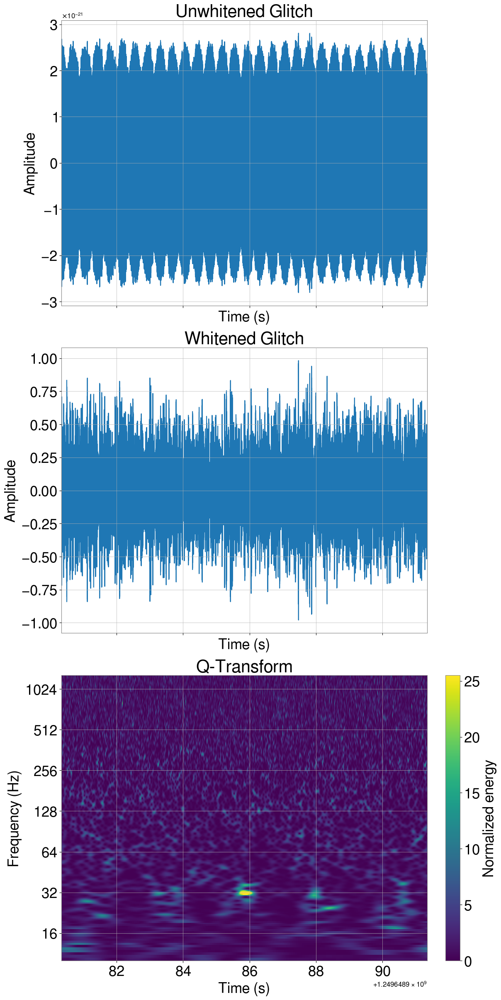

In [44]:
statistical_testing.display_sample_plots(combined_df[combined_df['label'] == 'Scattered_Light'].sample(1).iloc[0])

# Experimenting with the Fractal Dimension

The fractal dimension is another way for us to visualize and characterize our data. FD characterizes the self similarity of a set and provides a measure of complexity of the signal in terms of signal processing. Basically, it tells us how complex a shape is, which in this case would be the shape of the time series signal. If we were to use this in the context of time series signals, it would be as a **Variation over Time** telling us how complex the signal is. Glitches cause this FD value to change.

For this we use the VAR method. (Referenced from LIGO repositories)

In [20]:
combined_df.shape

(3597, 16)

In [21]:
# example_ts = TimeSeries.read(example["timeseries_file_location"])
example = combined_df.loc[combined_df['label'] == 'Tomte'].iloc[0]
example_ts = statistical_testing.get_sample_glitch_from_filepath(example["timeseries_file_location"])[1]
# example_ts = example_ts[int(4096*4.5):-int(4096*4)]

In [22]:
example["timeseries_file_location"]

'./timeseries_data/sample_L1_1246837203.771_10.h5'

In [23]:
example_ts.shape

(4096,)

In [24]:
np.arange(0, 4096//(2*64))

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13,
       14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27,
       28, 29, 30, 31])

In [25]:
import numba

### What's happening here (My explanation)

F_k contains all the fractional dimensions being calculated for the given TimeSeries signal given the decimate value.

To calculate F_k, the outer loop takes values from 1 to half the length of the signal times the deimate, while the inner loop goes from the value of the outer loop to the end of the signal minus the outer loop value. At each iteration of the inner loop a window  of size [k-l, k-l+1] goes along the signal and calculates the absolute value of the difference between the minimum and maximum amplitude values, giving us the Fractional Dimension values.





In [26]:
@numba.njit(parallel=True)
def compute_fractals_var(arr, decimate=64, step=2):
    # Fractal dimensions array for each segment
    # fds = np.empty(shape=arr.shape[0], dtype=np.float32)
    N = arr.shape[0]

    F_k = [
        [np.abs(np.max(arr[l-k:l+k+1]) - np.min(arr[l-k:l+k+1])) for l in np.arange(k, N-k)] \
            for k in np.arange(1, N//(2*decimate), step)
        ]
    A_var = [np.mean(np.asarray(F_k[k])) for k in np.arange(len(F_k))]
    return (np.array(A_var), F_k)


In [27]:
# compute_fractals_var.parallel_diagnostics(level=3)

In [28]:
fd = compute_fractals_var(example_ts)

In [29]:
len(fd[1][15])

4034

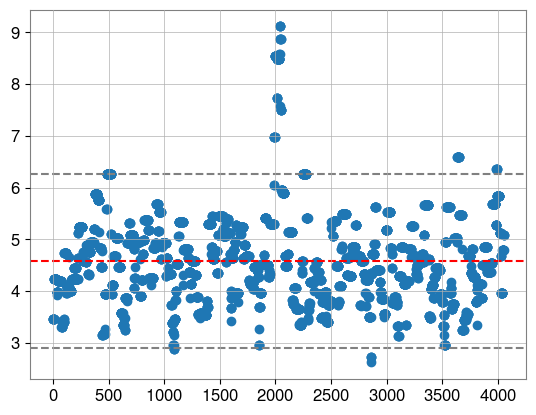

In [30]:
median = np.median(fd[1][10])
std = np.std(fd[1][10])
plt.plot(fd[1][10], 'o')
plt.axhline(median, color='red', linestyle='--', label='Mean')
plt.axhline(median + (2*std), color='grey', linestyle='--', label='Mean + Std')
plt.axhline(median - (2*std), color='grey', linestyle='--', label='Mean - Std')


In [31]:
example2 = combined_df.iloc[0]

example_ts2 = TimeSeries.read(example2["timeseries_file_location"])
example_ts2 = example_ts2.whiten(4,2)
example_ts2 = example_ts2[int(4096):int(8192)]

In [32]:
fd2 = compute_fractals_var(example_ts2)

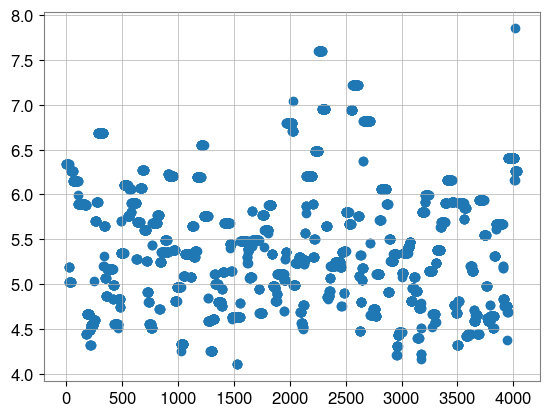

In [33]:
plt.plot(fd2[1][15], 'o')

In [34]:
example3 = combined_df.loc[combined_df['label'] == 'Scattered_Light'].iloc[0]
example_ts3 = statistical_testing.get_sample_glitch_from_filepath(example3["timeseries_file_location"])[1]
fd3 = compute_fractals_var(example_ts3)

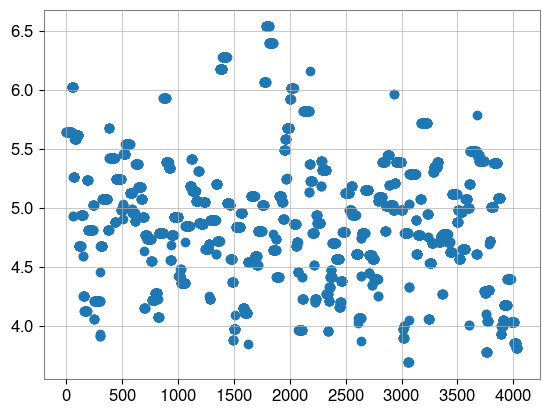

In [35]:
plt.plot(fd3[1][15], 'o')

In [36]:
@numba.njit(parallel=True)
def faster_compute_fractals_var(arr, decimate=64, step=2):
    N = arr.shape[0]
    # Fractal dimensions array for each segment
    fds = np.empty(shape=arr.shape[0], dtype=np.float32)
    # This is used to loop over the k values and is better off defined separately as it is reused
    k_values = np.arange(1, arr.shape[0]//(2*decimate), step)
    k_max = len(k_values)

    F_k = np.empty(shape=(N//(2*decimate), N), dtype=np.float32)
    A_var = np.empty(shape=(N//(2*decimate)), dtype=np.float32)

    for k in numba.prange(1, N//(2*decimate), step):
        for l in numba.prange(k, N-k):
            F_k[k-1][l] = np.abs(np.max(arr[l-k:l+k+1]) - np.min(arr[l-k:l+k+1]))
        A_var[k-1] = np.mean(F_k[k-1])
    
    return A_var

### Studying the SFFTs of the signals

In [48]:
from scipy import signal

eg_fft = example_ts.fft()
eg_fft2 = example_ts2.fft()
eg_fft3 = example_ts3.fft()

f1, t1, Zxx1 = signal.stft(example_ts, fs=4096, nperseg=256, noverlap=128)
f2, t2, Zxx2 = signal.stft(example_ts2, fs=4096, nperseg=256, noverlap=128)
f3, t3, Zxx3 = signal.stft(example_ts3, fs=4096, nperseg=256, noverlap=128)

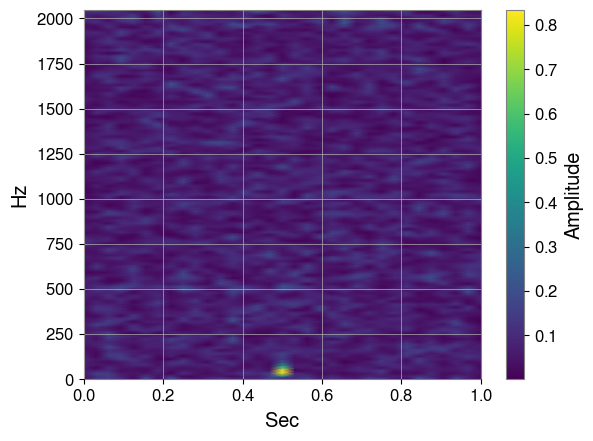

In [44]:
plt.pcolormesh(t1, f1, np.abs(Zxx1), shading='gouraud')
plt.ylabel('Hz')
plt.xlabel('Sec')
plt.colorbar(label='Amplitude')
plt.show()

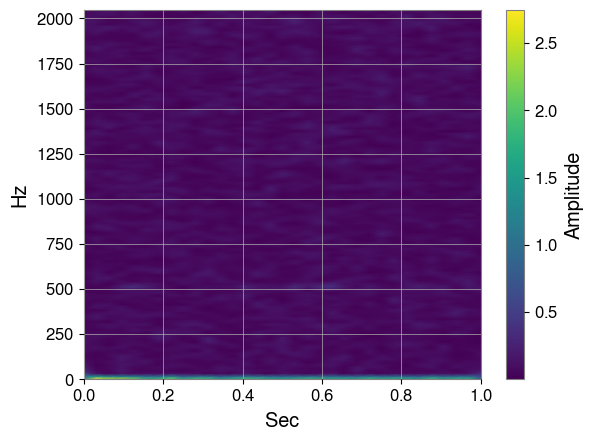

In [46]:
plt.pcolormesh(t2, f2, np.abs(Zxx2), shading='gouraud')
plt.ylabel('Hz')
plt.xlabel('Sec')
plt.colorbar(label='Amplitude')
plt.show()

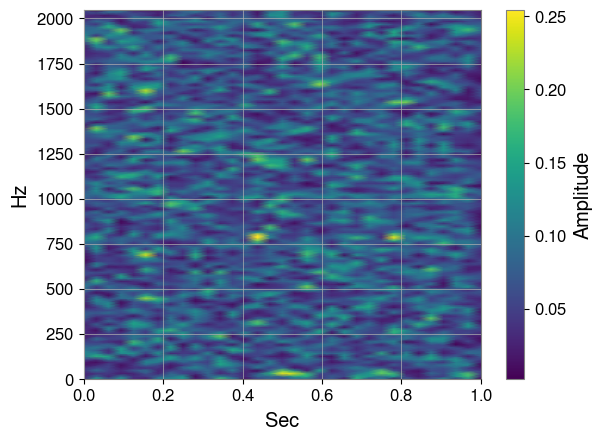

In [47]:
plt.pcolormesh(t3, f3, np.abs(Zxx3), shading='gouraud')
plt.ylabel('Hz')
plt.xlabel('Sec')
plt.colorbar(label='Amplitude')
plt.show()

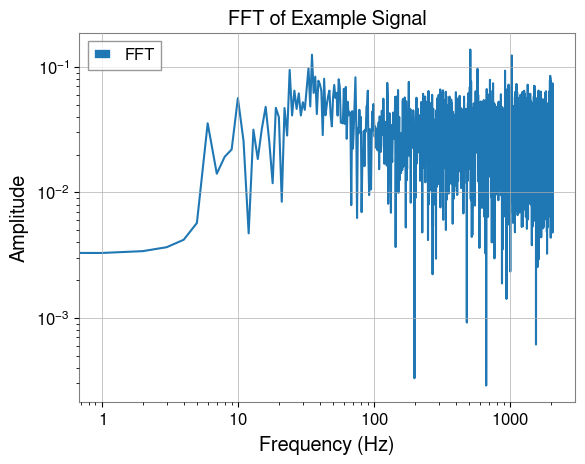

In [49]:
plt.plot(eg_fft.frequencies, np.abs(eg_fft.value), label="FFT")
plt.xscale('log')
plt.yscale('log')
plt.xlabel("Frequency (Hz)")
plt.ylabel("Amplitude")
plt.title("FFT of Example Signal")
plt.legend()
plt.show()

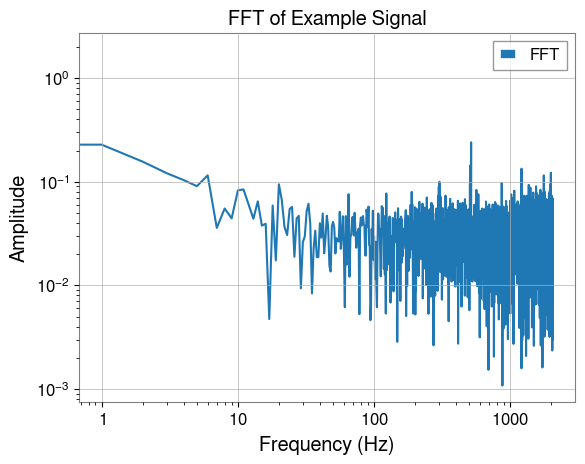

In [50]:
plt.plot(eg_fft2.frequencies, np.abs(eg_fft2.value), label="FFT")
plt.xscale('log')
plt.yscale('log')
plt.xlabel("Frequency (Hz)")
plt.ylabel("Amplitude")
plt.title("FFT of Example Signal")
plt.legend()
plt.show()

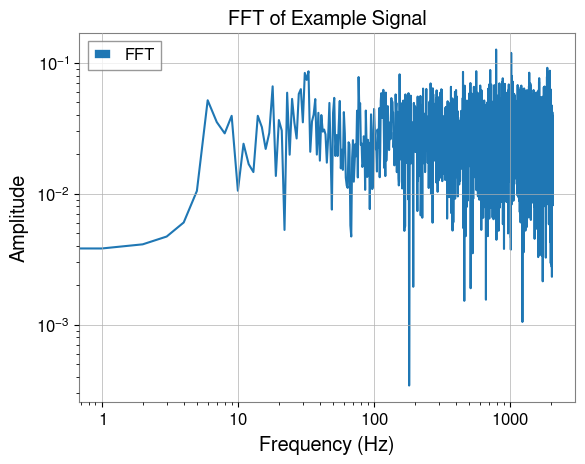

In [51]:
plt.plot(eg_fft3.frequencies, np.abs(eg_fft3.value), label="FFT")
plt.xscale('log')
plt.yscale('log')
plt.xlabel("Frequency (Hz)")
plt.ylabel("Amplitude")
plt.title("FFT of Example Signal")
plt.legend()
plt.show()

From the above tests we see that the KS and Anderson Darling statistical tests have ambivalent results with our data both in the case of no bandpass filter being applied to them at a range of 15 to 250 Hz.

However, in the case of the Shapiro-Wilks test we do notice that for the non-bandpassed data, it has good amount of True Negatives (a sample not containing a glitch/a gaussian sample being classified accurately), while having True Positives (a sample containing a glitch/being non-gaussian classified correctly) and False Negatives almost equal to each other, which isn't that great.

In the case of the bandpass filter being applied, however, the number of true positives shoots up way high, but this also leads to a lot of false positives being detected as well.

Looking at this behavior, Melissa Lopez, Ph.D. proposed a workflow that aims to take advantage of this characteristic. This this "double-testing" workflow is as follows.

![Double Testing Workflow](./images/double_testing_workflow.png)

I will be applying this now.

# Testing a failed failed case and the Effects of different Scalers

In [43]:
x = statistical_testing.get_TimeSeries(gps_time=1238176530.304203, gps_end_time=1238176537.558593)

In [44]:
x

(<TimeSeries([-7.93903263e-20, -7.89323641e-20, -7.95509577e-20,
              ..., -1.40620372e-19, -1.38284808e-19,
              -1.35977828e-19]
             unit=Unit(dimensionless),
             t0=<Quantity 1.23817653e+09 s>,
             dt=<Quantity 0.00024414 s>,
             name='Strain',
             channel=None)>,
 <TimeSeries([-0.0640748 ,  1.04582857,  1.19853494, ...,
               4.3709337 ,  2.0222022 ,  4.36657532]
             unit=Unit(dimensionless),
             t0=<Quantity 1.23817653e+09 s>,
             dt=<Quantity 0.00024414 s>,
             name='Strain',
             channel=None)>,
 './timeseries_data/sample_L1_1238176530.304203_1238176537.558593.h5')

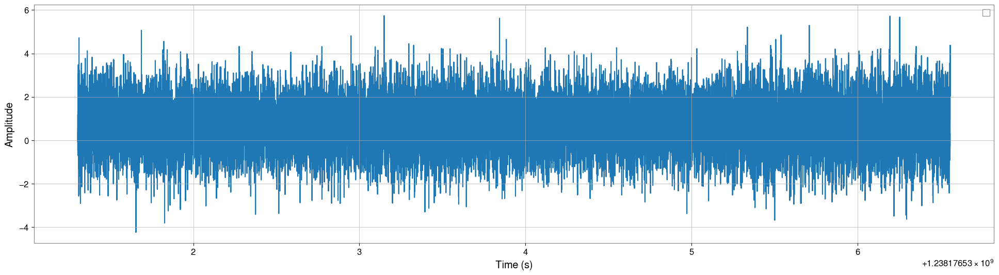

In [30]:

fig, ax = plt.subplots(figsize=(24, 6))
ax.plot(x[1].times, x[1].value)
ax.set_xlabel("Time (s)")
ax.set_ylabel("Amplitude")
ax.legend()

plt.show()

In [31]:
statistical_testing.calculate_sample_statistics(x[1].value)

{'shapiro_statistic': np.float64(0.9998121209418486),
 'shapiro_pvalue': np.float64(0.05706369755434295),
 'shapiro_prediction': 0,
 'ks_statistic': np.float64(0.007155801310347987),
 'ks_pvalue': np.float64(0.6374871827885945),
 'ks_prediction': 0,
 'ad_statistic': np.float64(0.7648976197560842),
 'ad_critical_values': array([0.576, 0.656, 0.787, 0.918, 1.092]),
 'ad_significance_level': array([15. , 10. ,  5. ,  2.5,  1. ]),
 'ad_prediction': 0,
 'kurtosis': np.float64(3.0578495207297065),
 'skew': np.float64(0.02520227834394108)}

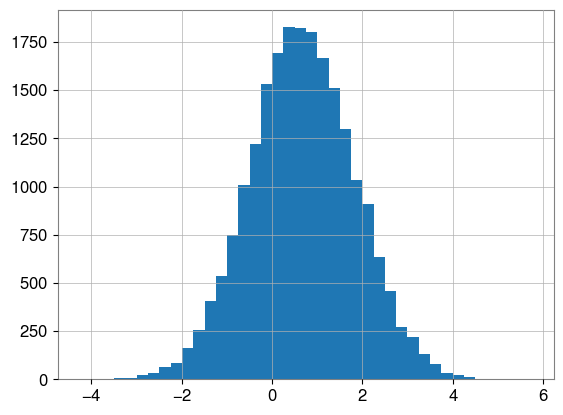

In [32]:
plt.hist(x[1].value, bins=40)
plt.show()

In [33]:
np.random.seed(42)

scaler = MinMaxScaler(feature_range=(-4,4))
ks_statistic = stats.ks_2samp(list(scaler.fit_transform(x[1].value.reshape(-1,1))[:,0]), stats.norm.rvs(size=len(x[1].value)))

In [34]:
ks_statistic

KstestResult(statistic=np.float64(0.038520514845964415), pvalue=np.float64(2.6162594485404763e-14), statistic_location=np.float64(0.38736429297550057), statistic_sign=np.int8(1))

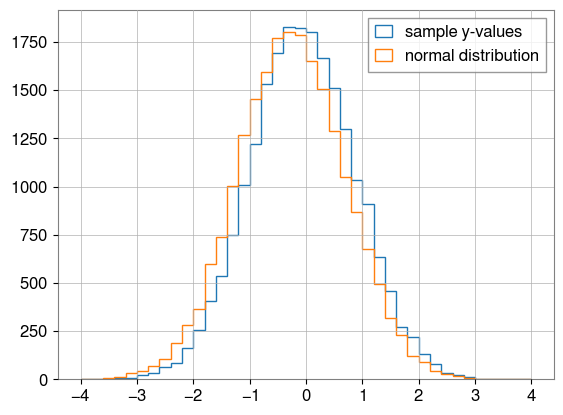

In [35]:

fig = plt.figure(dpi=100)

np.random.seed(42)

plt.hist(scaler.fit_transform(x[1].value.reshape(-1,1)), label="sample y-values", histtype='step', bins=40)
plt.hist(scaler.fit_transform(stats.norm.rvs(size=len(x[1].value)).reshape(-1,1)), label="normal distribution", histtype='step', bins=40)
plt.legend()
plt.show()

In [36]:
scaler = StandardScaler()
# scaler = MaxAbsScaler()
# scaler = MinMaxScaler()


In [37]:
np.random.seed(42)
np.std(stats.norm.rvs(size=len(x[1].value))), np.std(scaler.fit_transform(x[1].value.reshape(-1,1)))

(np.float64(1.0027071863441566), np.float64(1.0))

In [38]:
np.random.seed(42)
np.mean(stats.norm.rvs(size=len(x[1].value))), np.mean(scaler.fit_transform(x[1].value.reshape(-1,1)))

(np.float64(0.0041227260324685), np.float64(-4.556242625105424e-17))